In [1]:
## Location/Duration scan of STRB1 near optimal

# 1 - Find the average waveform for each scan step and plot: start 32ns
# 2 - Find the average waveform for each scan step and plot: start 33ns
# 3 - Find the average waveform for each scan step and plot: start 34ns
# 4 - Find the average waveform for each scan step and plot: start 35ns
# 5 - Compare different scans with rainbow colormap plot
# 6 - Plot only Even Blocks
# 7 - Compare different scans with rainbow colormap plot
# 8 - Plot only Odd Blocks

# Conclusion - Take this scan again with the block boundry at a better location

In [1]:
%pylab inline
import numpy as np
import matplotlib.pyplot as plt
import os.path

Populating the interactive namespace from numpy and matplotlib


In [2]:
#Setting plot default sizes
plt.rc('axes', titlesize = 40)
plt.rc('axes', labelsize = 30)
plt.rc('xtick', labelsize = 20)
plt.rc('ytick', labelsize = 20)
plt.rc('legend', fontsize = 20)
plt.rc('figure', titlesize = 40)
plt.figure(figsize(12,9))

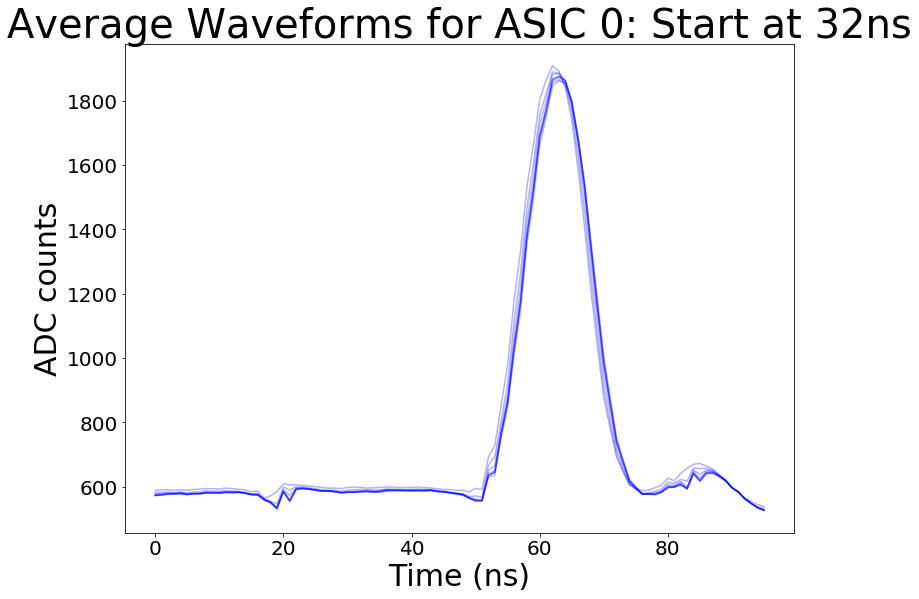

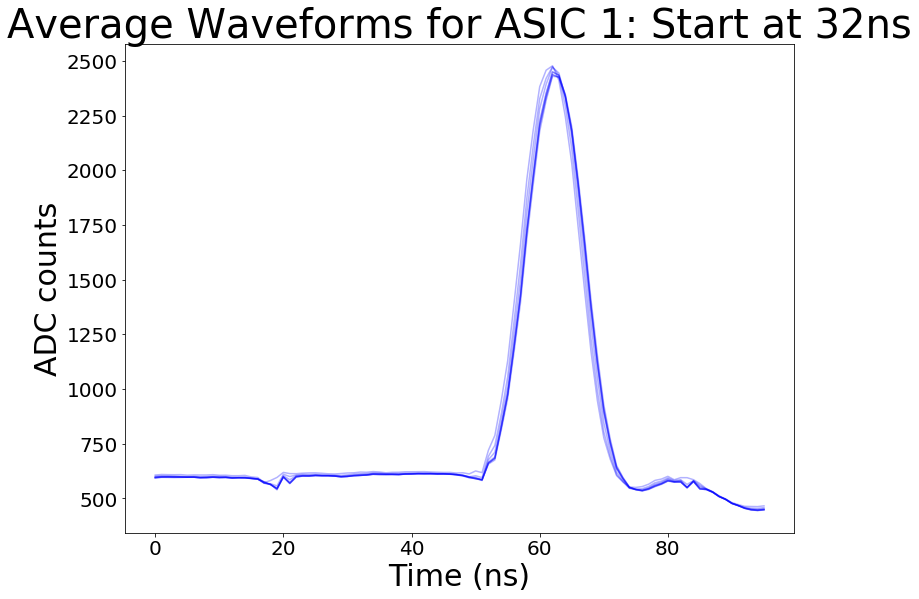

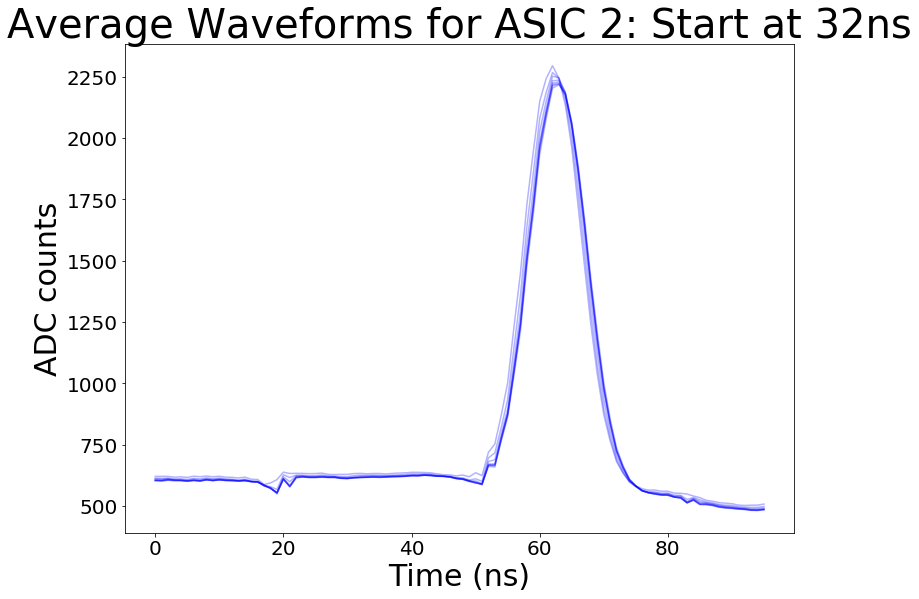

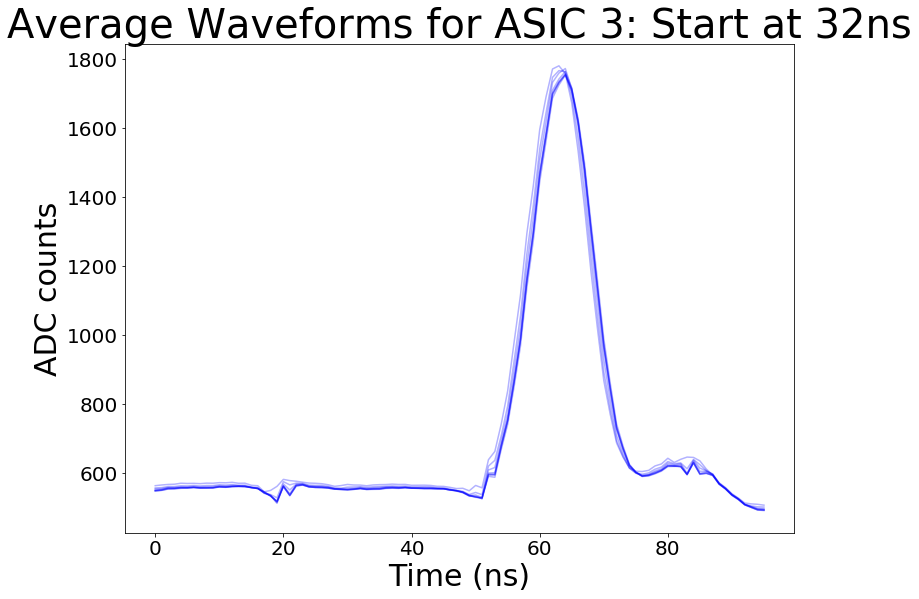

In [46]:
# Duration Scan begining at 32ns

STRB1_32 = []
for ASIC in range(4):
    runs = []
    length = 3
    for run in range(320816,320824):
        data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/ASIC Initialization Scans/New STRB1 Duration+Location/sampleFileAllBlocks_run" + str(run) + "ASIC" + str(ASIC) + "CH6.npz", 'r'))
        waveforms = []
        for event in range(len(data['event'])):
            phase = int(data['phase'][event])
            shift = 32 - phase - 1 + 16*(phase>=16) - 16*(phase<16)
            waveforms.append(data['samples'][event][shift: shift+96])
        avg_waveform = []
        for point in range(96):
            a = []
            for event in range(len(waveforms)):
                a.append(waveforms[event][point])
            avg_waveform.append(np.mean(a))
        runs.append(avg_waveform)
        plt.plot(avg_waveform, label = '32 to ' + str(32 + length), color = 'b', alpha = 0.3)
        length = length + 1
    STRB1_32.append(runs)
    plt.title('Average Waveforms for ASIC ' + str(ASIC) + ": Start at 32ns")
    plt.ylabel('ADC counts')
    plt.xlabel('Time (ns)')
    plt.show()

(5000, 96)
<class 'list'>
<class 'numpy.ndarray'>


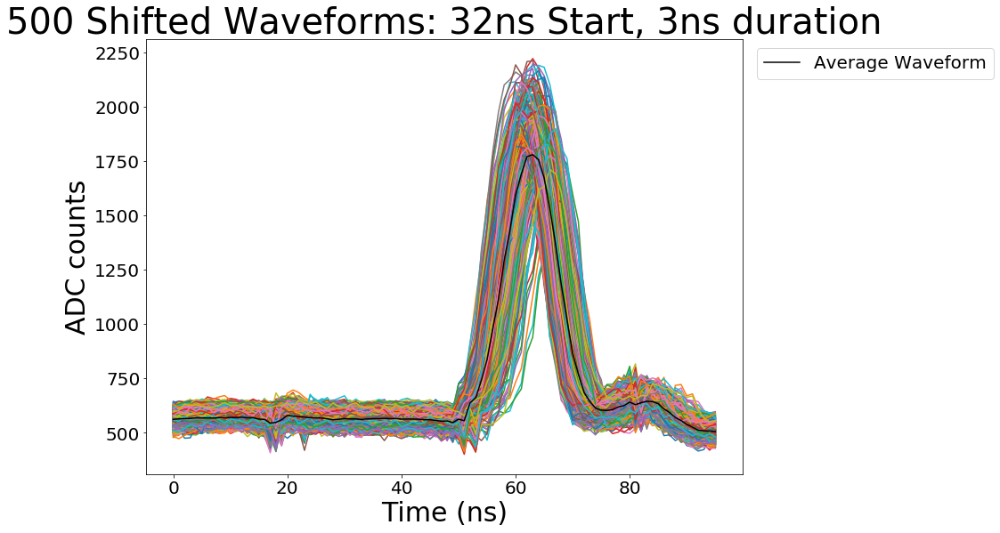

(5000, 96)
<class 'list'>
<class 'numpy.ndarray'>


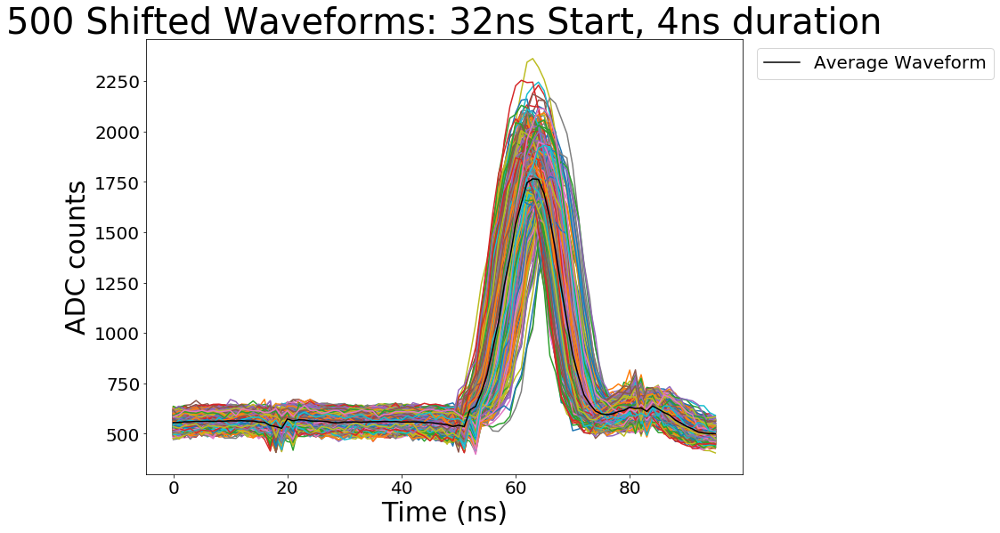

(5000, 96)
<class 'list'>
<class 'numpy.ndarray'>


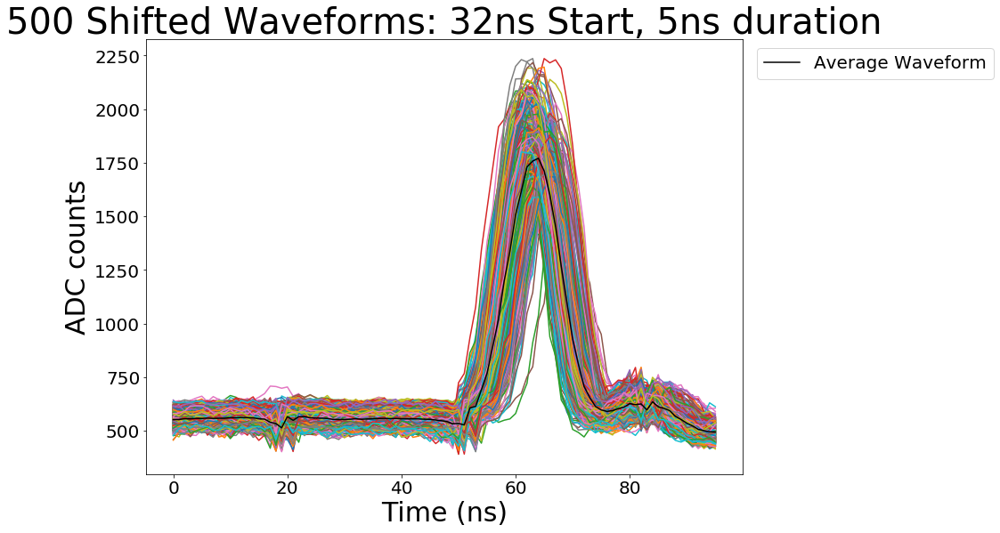

(5000, 96)
<class 'list'>
<class 'numpy.ndarray'>


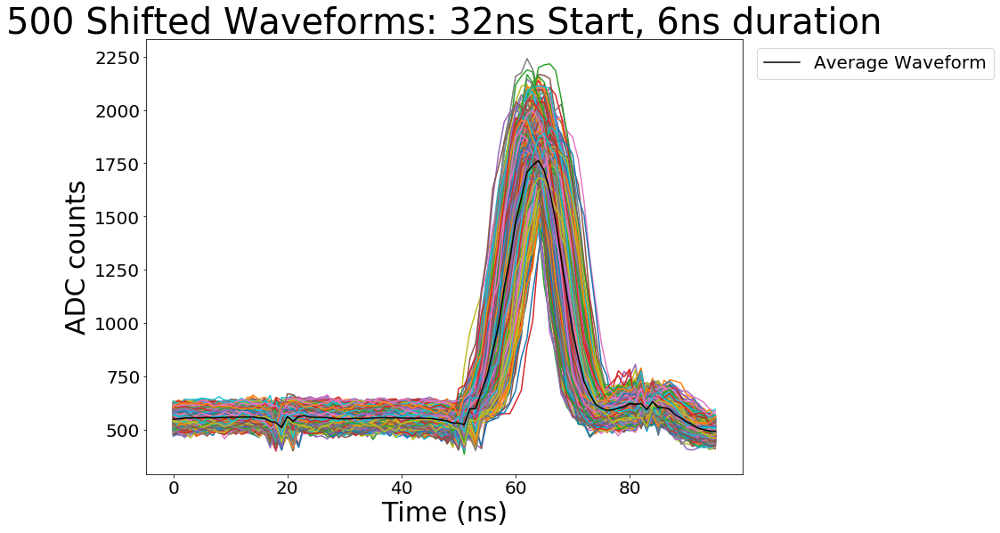

(5000, 96)
<class 'list'>
<class 'numpy.ndarray'>


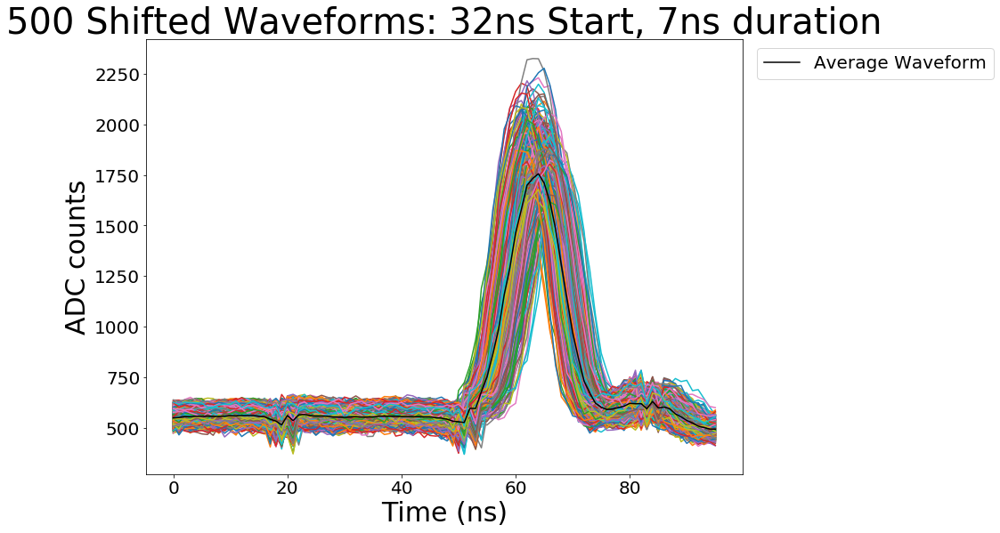

(5002, 96)
<class 'list'>
<class 'numpy.ndarray'>


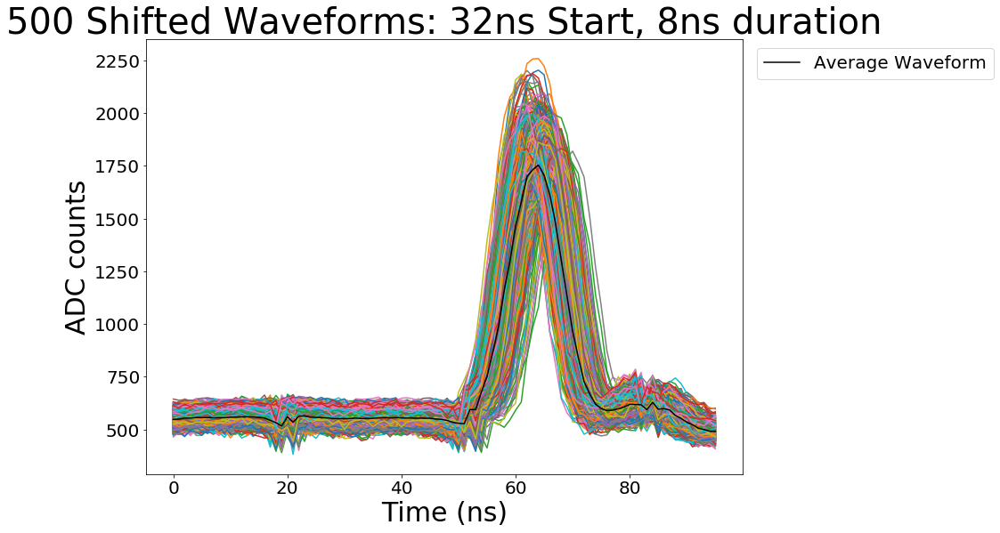

(5000, 96)
<class 'list'>
<class 'numpy.ndarray'>


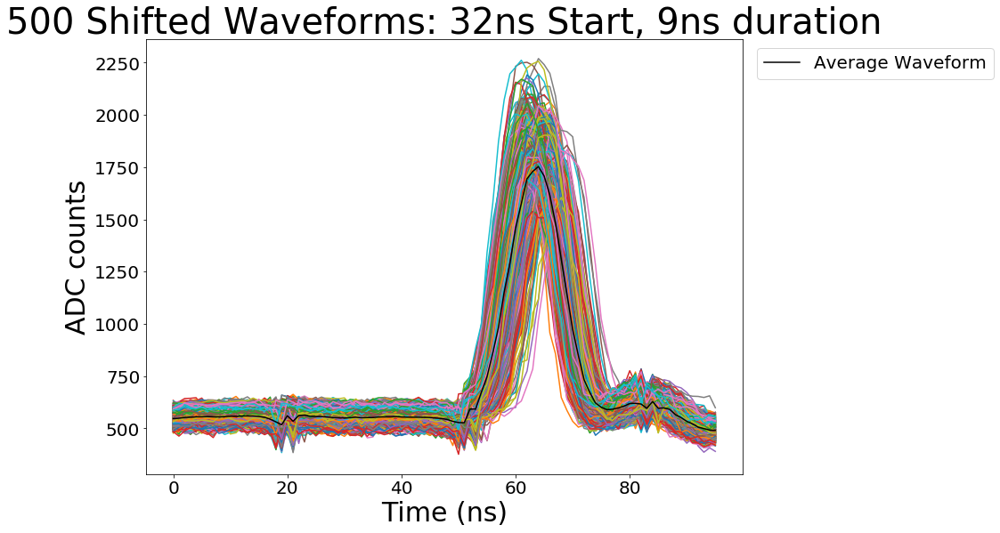

(5000, 96)
<class 'list'>
<class 'numpy.ndarray'>


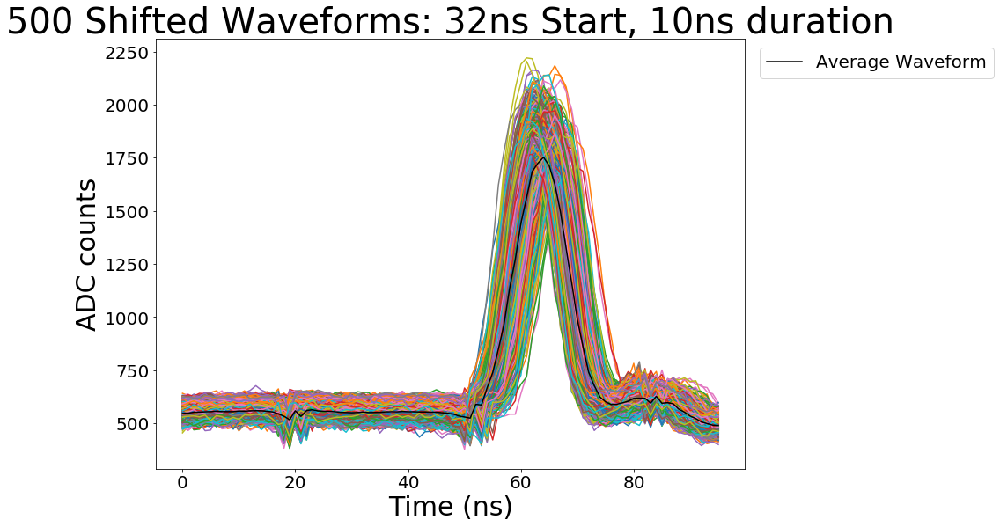

In [75]:
# Checking the phase correction for 32ns start
# Original phase correction

duration = 3
for run in range(320816,320824):
    data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/ASIC Initialization Scans/New STRB1 Duration+Location/sampleFileAllBlocks_run" + str(run) + "ASIC" + str(ASIC) + "CH6.npz", 'r'))
    waveforms = []
    for event in range(len(data['event'])):
        phase = int(data['phase'][event])
        shift = 32 - phase - 1 + 16*(phase>=16) - 16*(phase<16)
        d = data['samples'][event][shift: shift+96]
        waveforms.append(d)
        
    print(shape(waveforms))
    print(type(waveforms))
    print(type(waveforms[0]))
    
    avg_waveform = []
    for point in range(96):
        a = []
        for event in range(len(waveforms)):
            a.append(waveforms[event][point])
        avg_waveform.append(np.mean(a))
        
    for event in range(500):
        plt.plot(waveforms[event])
    plt.plot(avg_waveform, label = 'Average Waveform', color = 'black')
    plt.title('500 Shifted Waveforms: 32ns Start, ' + str(duration) + 'ns duration')
    plt.ylabel('ADC counts')
    plt.xlabel('Time (ns)')
    plt.legend(bbox_to_anchor = (1.01,1),loc = 'upper left')
    plt.show()
    
    duration = duration + 1

(4410, 96)
<class 'list'>
<class 'numpy.ndarray'>


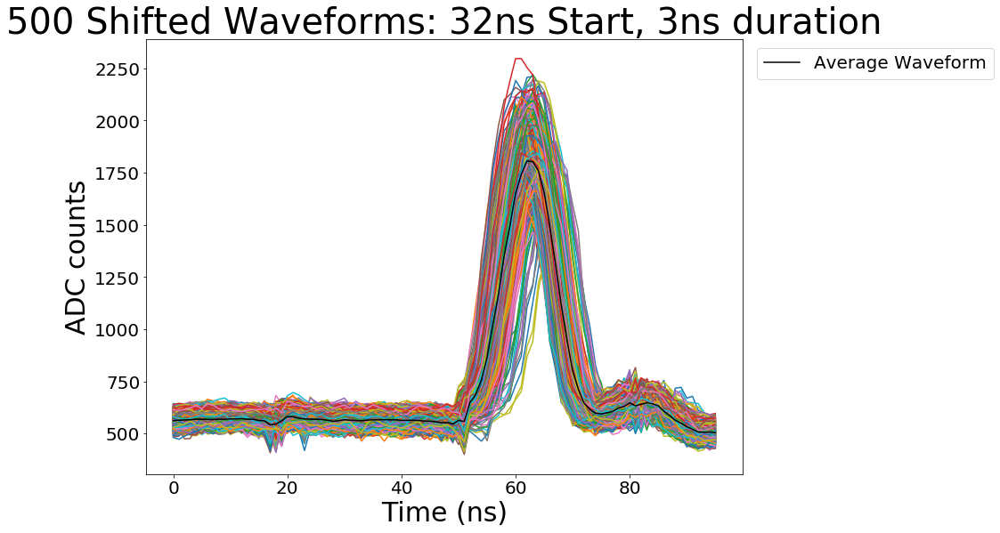

(4149, 96)
<class 'list'>
<class 'numpy.ndarray'>


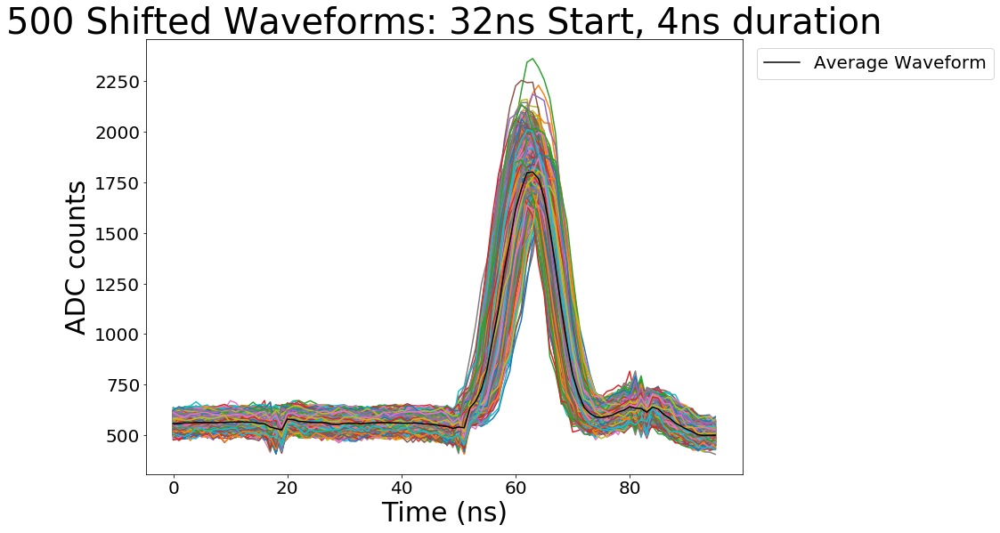

(3717, 96)
<class 'list'>
<class 'numpy.ndarray'>


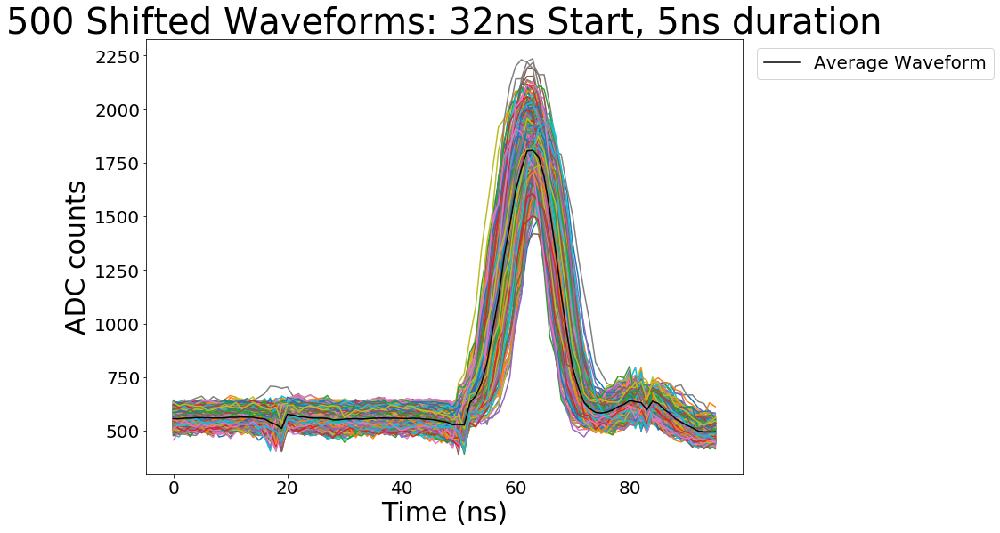

(3376, 96)
<class 'list'>
<class 'numpy.ndarray'>


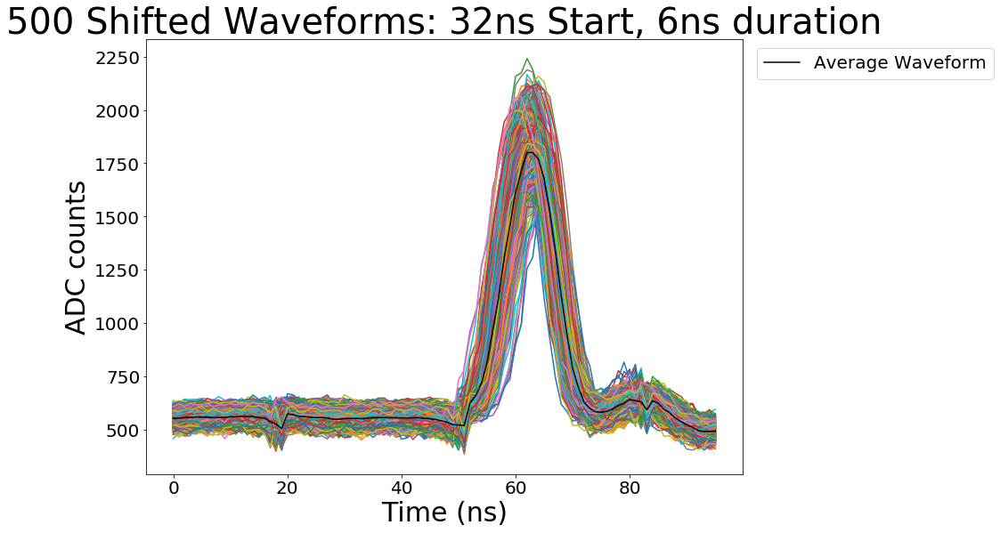

(3248, 96)
<class 'list'>
<class 'numpy.ndarray'>


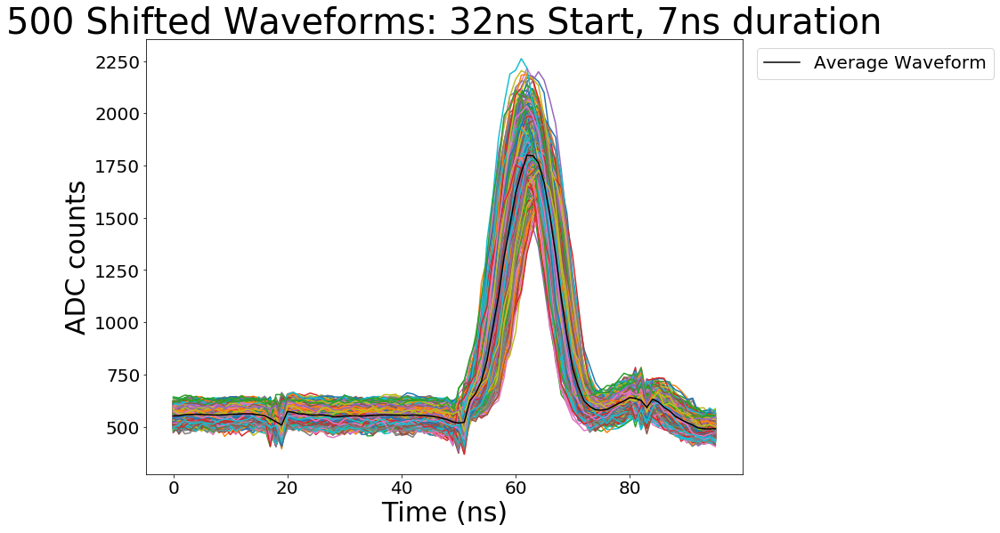

(3213, 96)
<class 'list'>
<class 'numpy.ndarray'>


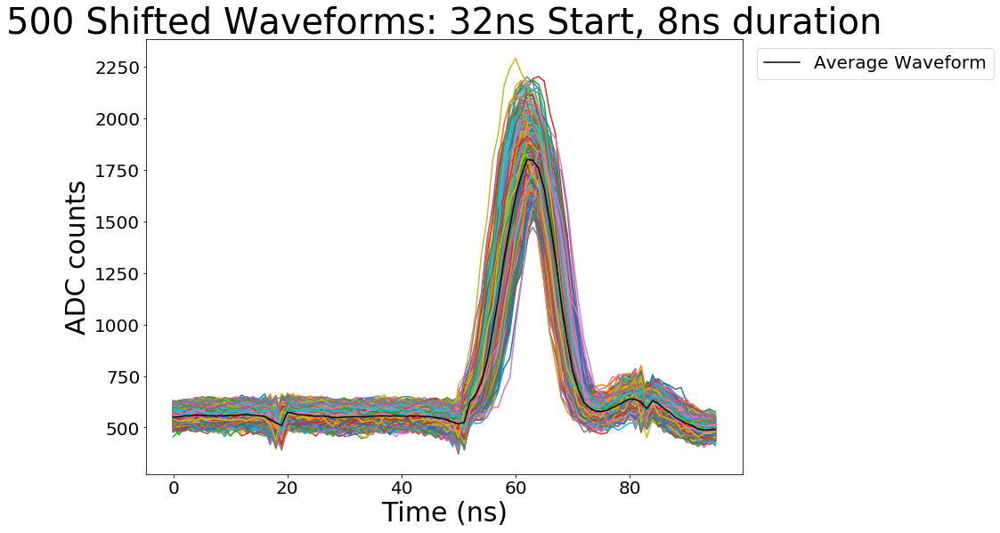

(3217, 96)
<class 'list'>
<class 'numpy.ndarray'>


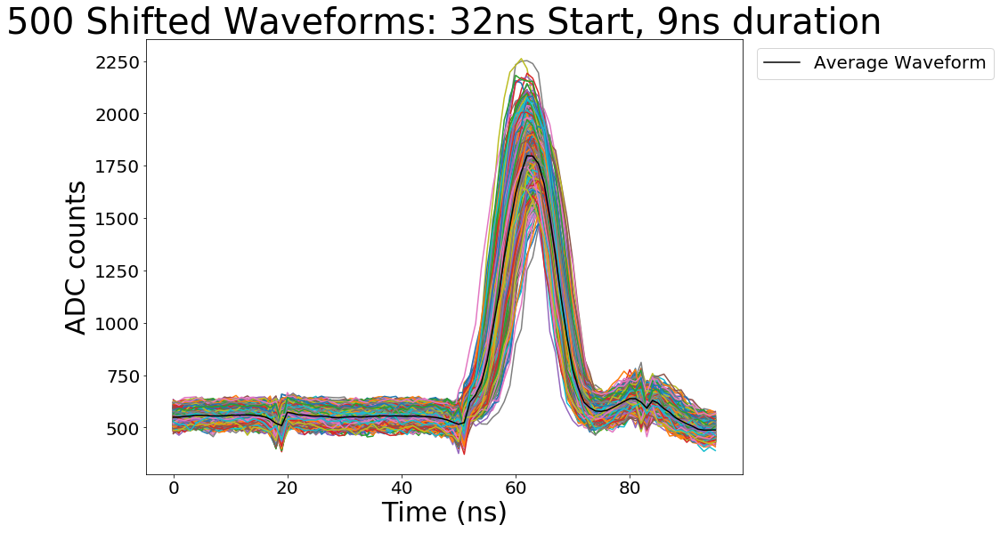

(3083, 96)
<class 'list'>
<class 'numpy.ndarray'>


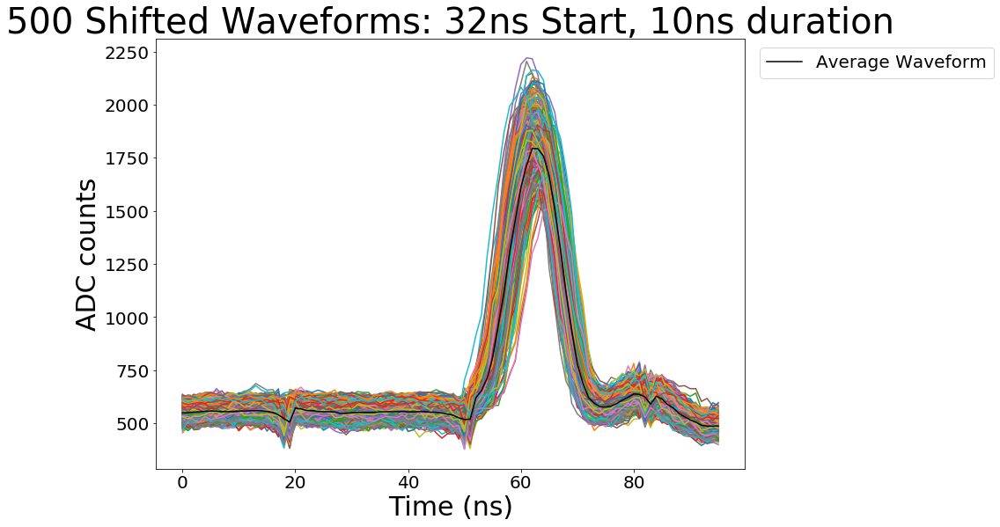

In [83]:
# Checking the phase correction for 32ns start
# Original phase correction - disregard faulty phases

duration = 3
for run in range(320816,320824):
    data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/ASIC Initialization Scans/New STRB1 Duration+Location/sampleFileAllBlocks_run" + str(run) + "ASIC" + str(ASIC) + "CH6.npz", 'r'))
    waveforms = []
    for event in range(len(data['event'])):
        phase = int(data['phase'][event])
        if phase<=32:
            shift = 32 - phase - 1 + 16*(phase>=16) - 16*(phase<16)
            d = data['samples'][event][shift: shift+96]
            waveforms.append(d)
        
    print(shape(waveforms))
    print(type(waveforms))
    print(type(waveforms[0]))
    
    avg_waveform = []
    for point in range(96):
        a = []
        for event in range(len(waveforms)):
            a.append(waveforms[event][point])
        avg_waveform.append(np.mean(a))
        
    for event in range(500):
        plt.plot(waveforms[event])
    plt.plot(avg_waveform, label = 'Average Waveform', color = 'black')
    plt.title('500 Shifted Waveforms: 32ns Start, ' + str(duration) + 'ns duration')
    plt.ylabel('ADC counts')
    plt.xlabel('Time (ns)')
    plt.legend(bbox_to_anchor = (1.01,1),loc = 'upper left')
    plt.show()
    
    duration = duration + 1

(4410, 96)
<class 'list'>
<class 'numpy.ndarray'>


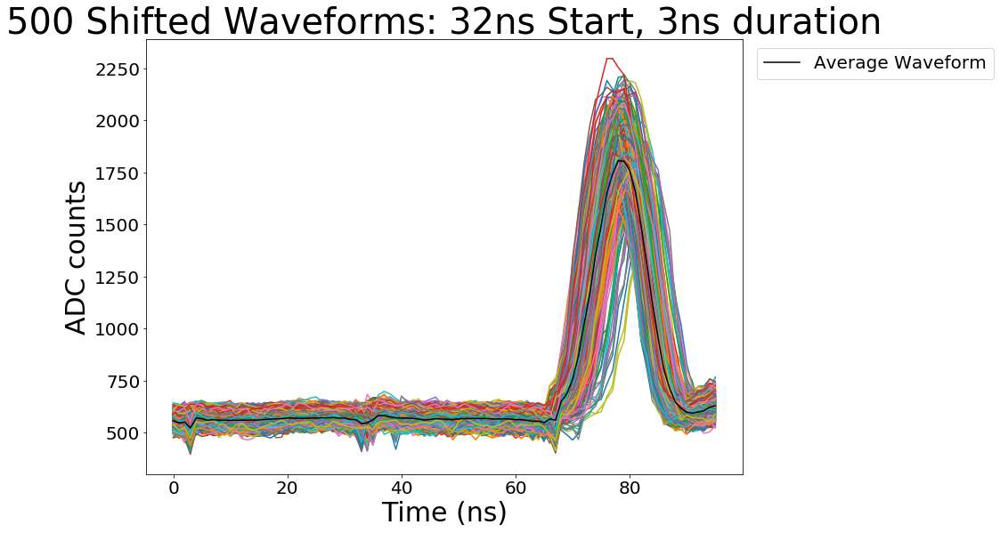

(4149, 96)
<class 'list'>
<class 'numpy.ndarray'>


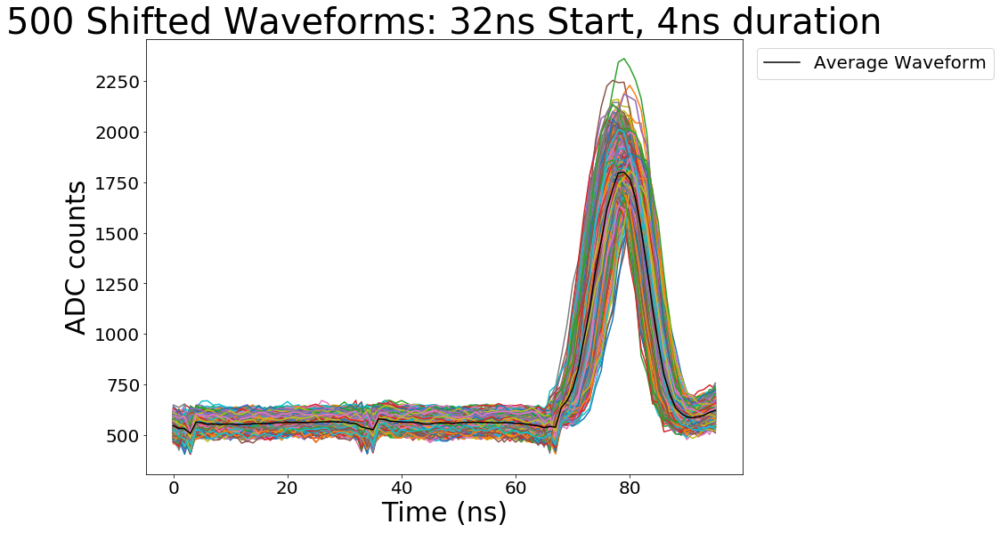

(3717, 96)
<class 'list'>
<class 'numpy.ndarray'>


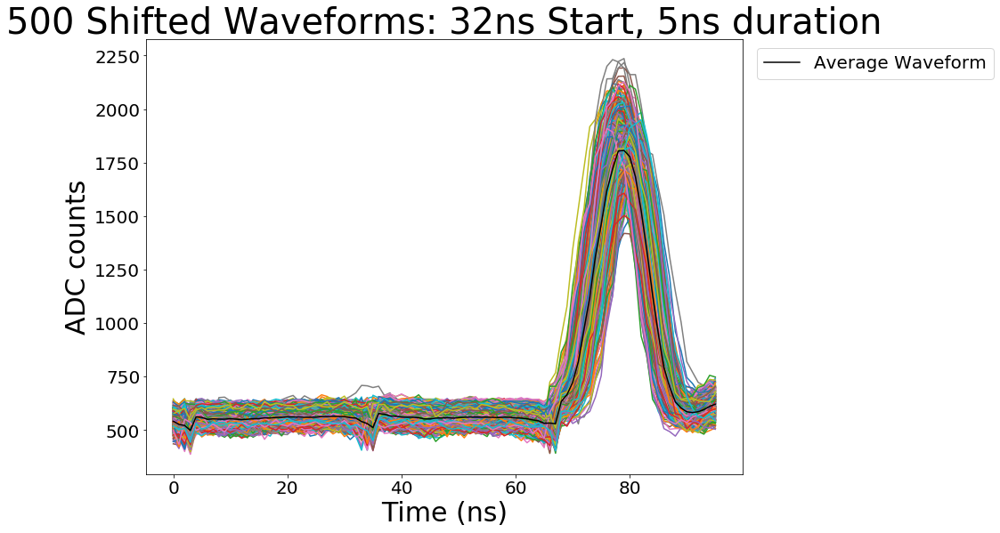

(3376, 96)
<class 'list'>
<class 'numpy.ndarray'>


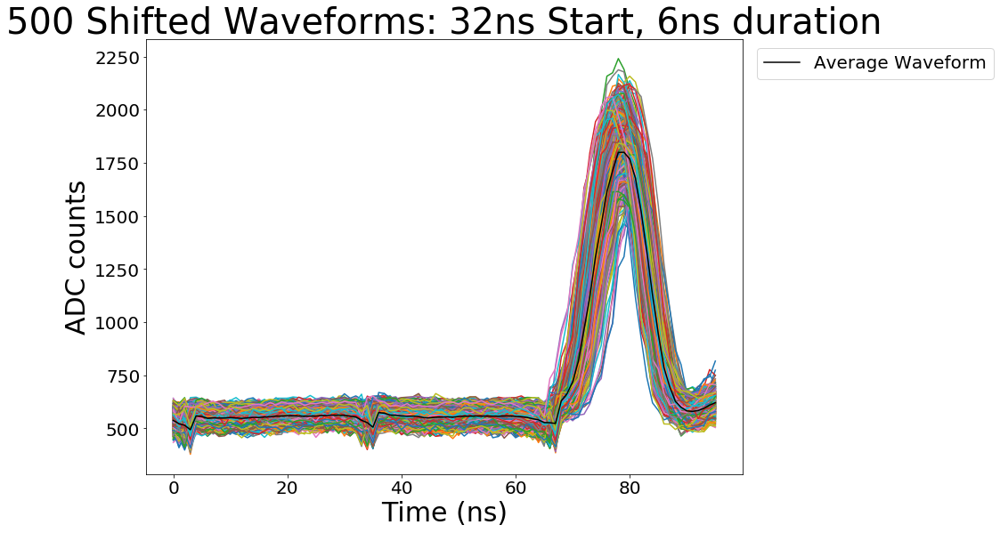

(3248, 96)
<class 'list'>
<class 'numpy.ndarray'>


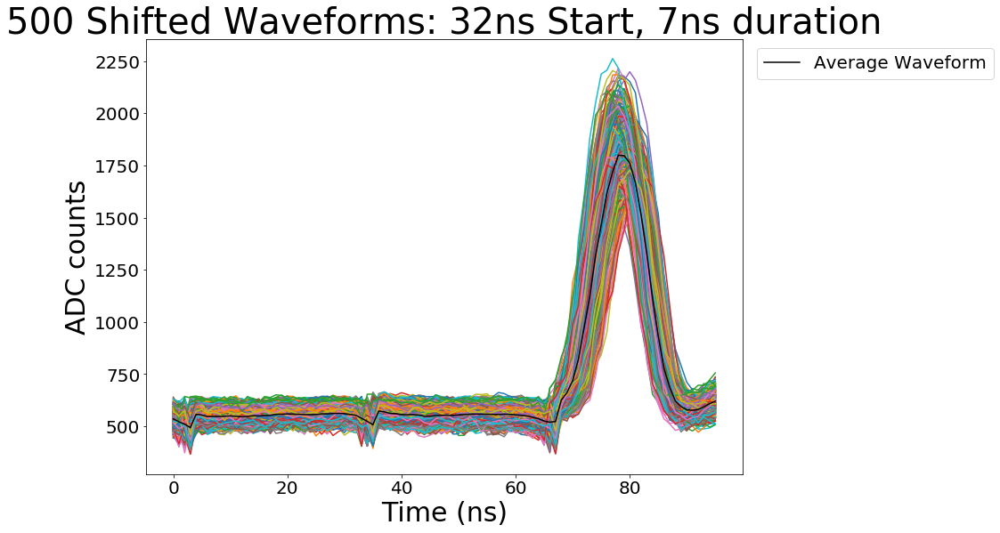

(3213, 96)
<class 'list'>
<class 'numpy.ndarray'>


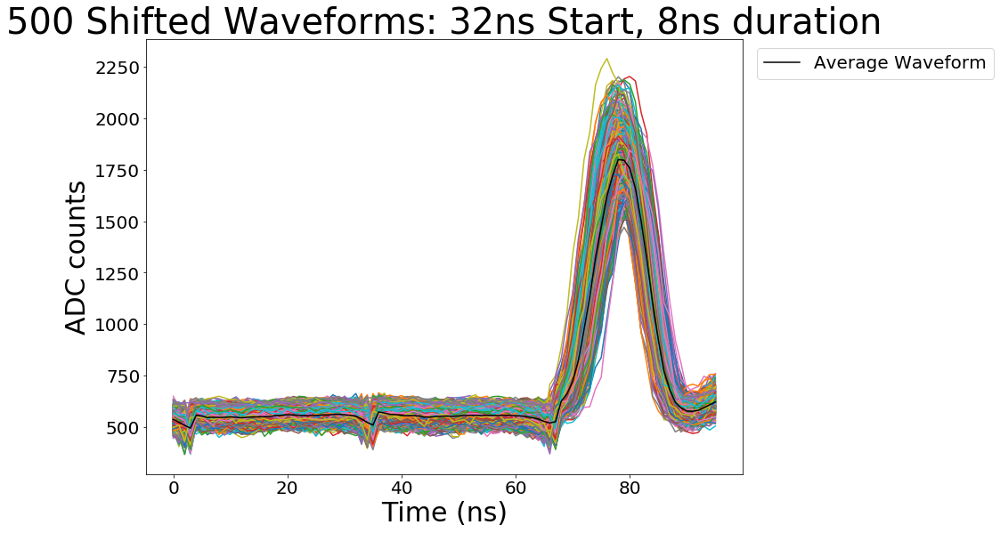

(3217, 96)
<class 'list'>
<class 'numpy.ndarray'>


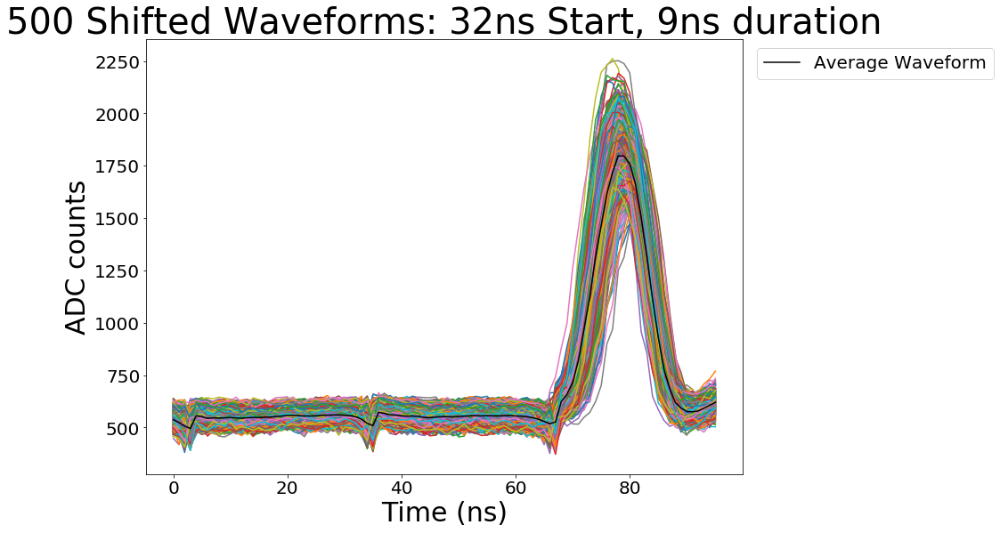

(3083, 96)
<class 'list'>
<class 'numpy.ndarray'>


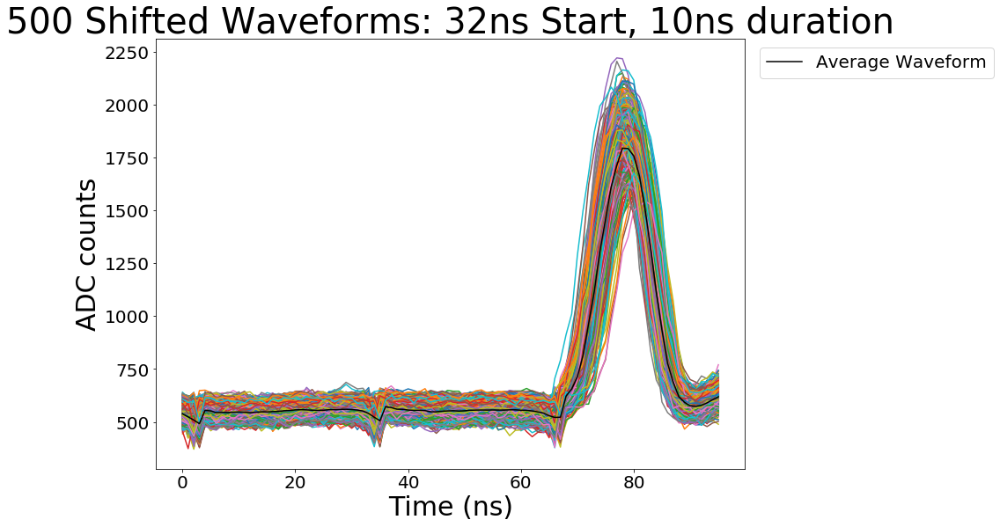

In [82]:
# Checking the phase correction for 32ns start
# Simple phase correction

duration = 3
for run in range(320816,320824):
    data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/ASIC Initialization Scans/New STRB1 Duration+Location/sampleFileAllBlocks_run" + str(run) + "ASIC" + str(ASIC) + "CH6.npz", 'r'))
    waveforms = []
    for event in range(len(data['event'])):
        phase = int(data['phase'][event])
        if phase<=32:
            shift = 32 - phase - 1
            d = data['samples'][event][shift: shift+96]
            waveforms.append(d)
        
    print(shape(waveforms))
    print(type(waveforms))
    print(type(waveforms[0]))
    
    avg_waveform = []
    for point in range(96):
        a = []
        for event in range(len(waveforms)):
            a.append(waveforms[event][point])
        avg_waveform.append(np.mean(a))
        
    for event in range(500):
        plt.plot(waveforms[event])
    plt.plot(avg_waveform, label = 'Average Waveform', color = 'black')
    plt.title('500 Shifted Waveforms: 32ns Start, ' + str(duration) + 'ns duration')
    plt.ylabel('ADC counts')
    plt.xlabel('Time (ns)')
    plt.legend(bbox_to_anchor = (1.01,1),loc = 'upper left')
    plt.show()
    
    duration = duration + 1

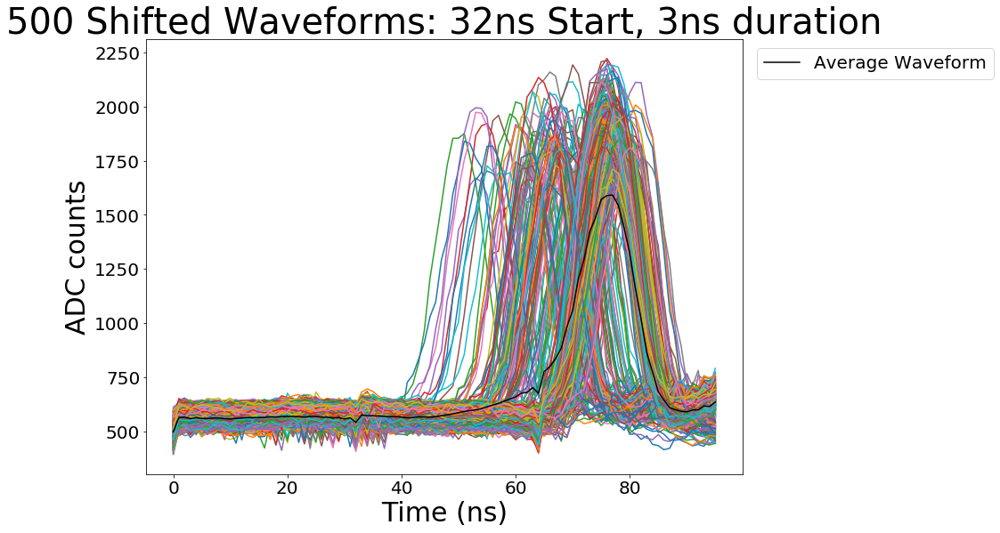

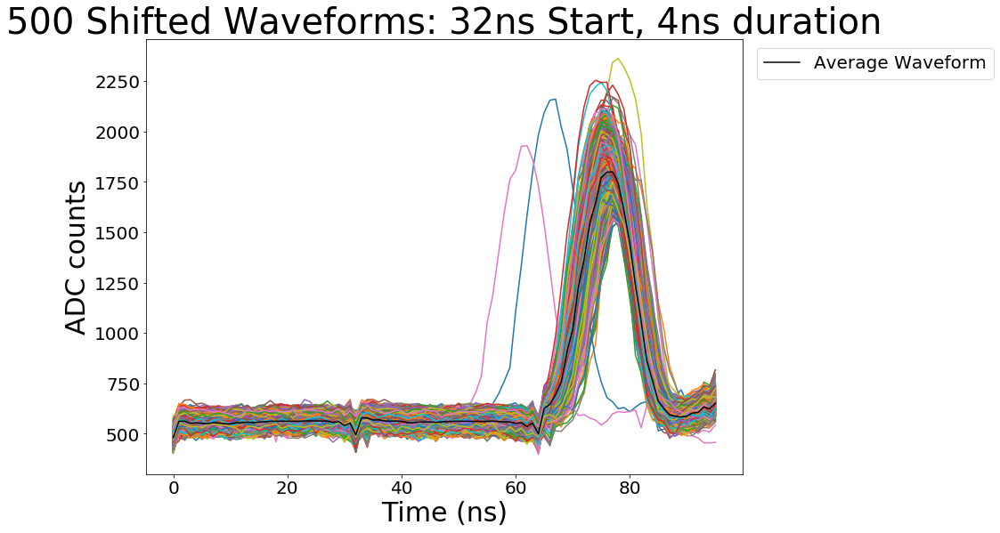

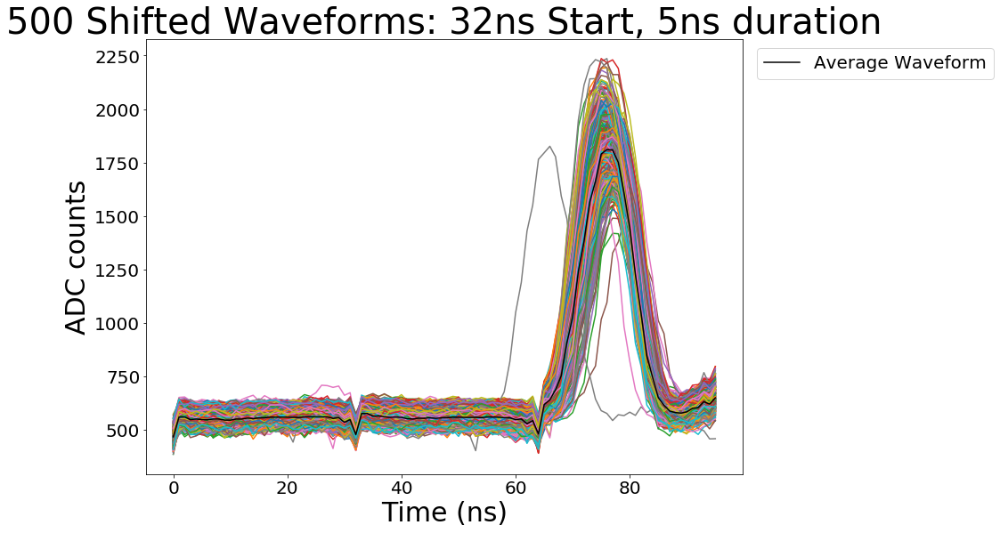

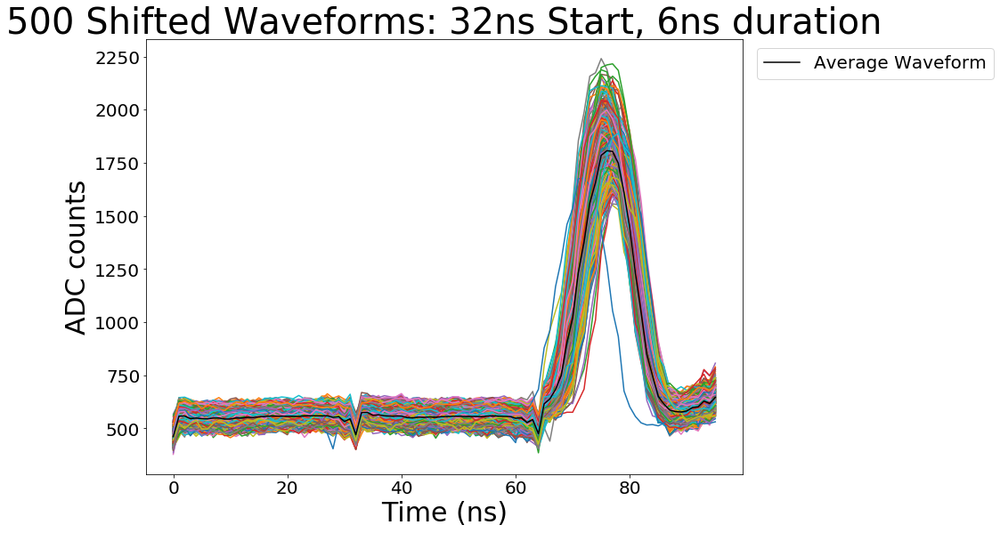

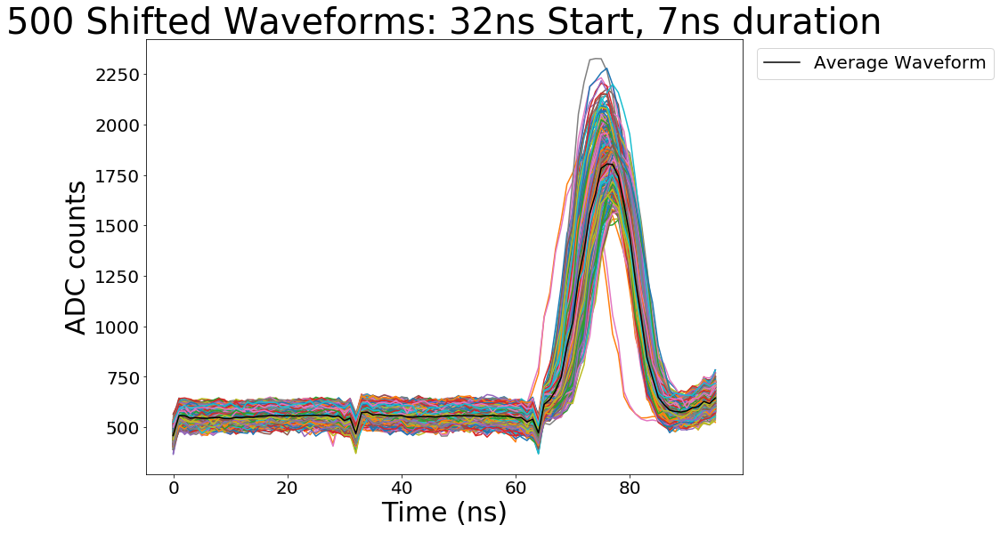

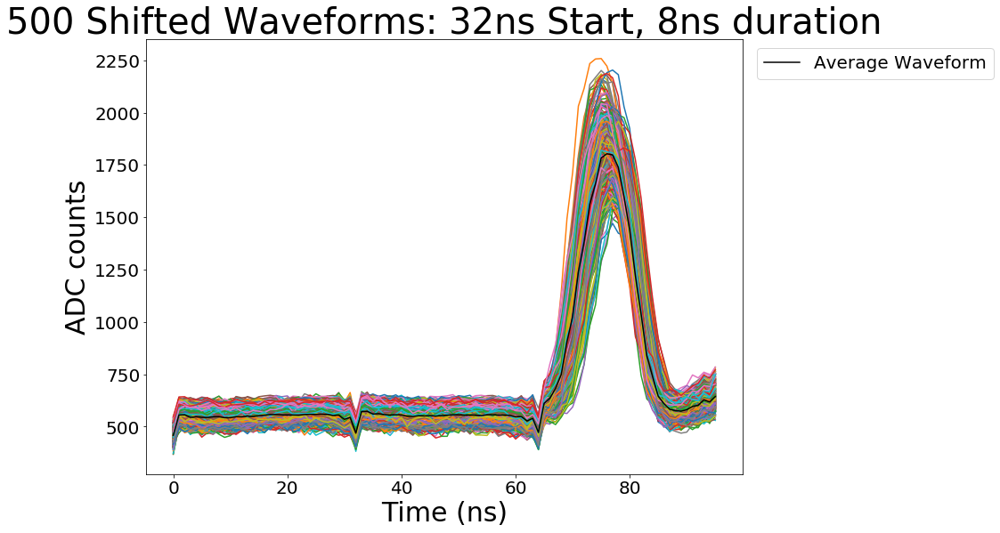

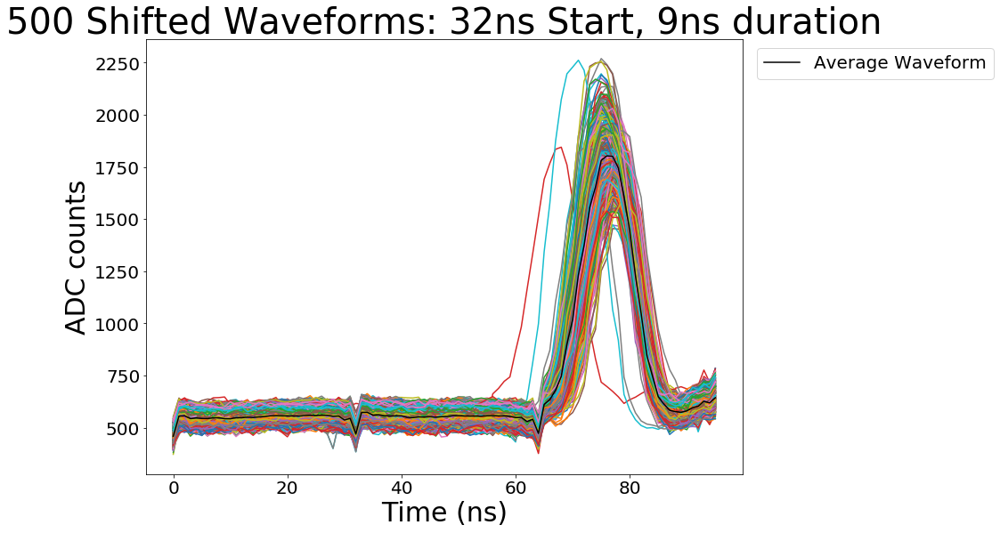

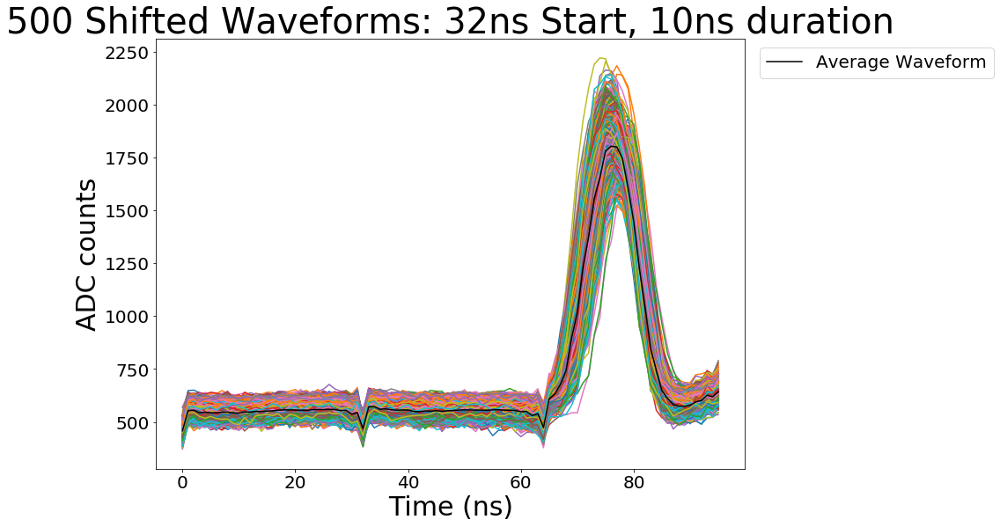

In [86]:
# Checking the phase correction for 32ns start
# Phase correction using lowest point as reference

duration = 3
for run in range(320816,320824):
    data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/ASIC Initialization Scans/New STRB1 Duration+Location/sampleFileAllBlocks_run" + str(run) + "ASIC" + str(ASIC) + "CH6.npz", 'r'))
    waveforms = []
    for event in range(len(data['event'])):
        first_block = np.ndarray.tolist(data['samples'][event][:32])
        for num in first_block:
            if num<250:
                first_block.remove(num)
        min_value = min(first_block)
        min_index = np.ndarray.tolist(data['samples'][event]).index(min_value)
        d = data['samples'][event][min_index: min_index+96]
        waveforms.append(d)
    
    avg_waveform = []
    for point in range(96):
        a = []
        for event in range(len(waveforms)):
            a.append(waveforms[event][point])
        avg_waveform.append(np.mean(a))
        
    for event in range(500):
        plt.plot(waveforms[event])
    plt.plot(avg_waveform, label = 'Average Waveform', color = 'black')
    plt.title('500 Shifted Waveforms: 32ns Start, ' + str(duration) + 'ns duration')
    plt.ylabel('ADC counts')
    plt.xlabel('Time (ns)')
    plt.legend(bbox_to_anchor = (1.01,1),loc = 'upper left')
    plt.show()
    
    duration = duration + 1

In [4]:
data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/ASIC Initialization Scans/New STRB1 Duration+Location/sampleFileAllBlocks_run320816ASIC0CH6.npz", 'r'))
phases = []
for event in range(len(data['event'])):
    phase = int(data['phase'][event])
    shift = 32 - phase - 1
    d = data['samples'][event][shift: shift+96]
    if len(d)!=96:
        #print(data['samples'][event])
        #print(data['phase'][event])
        phases.append(data['phase'][event])
        
print(len(phases))

590


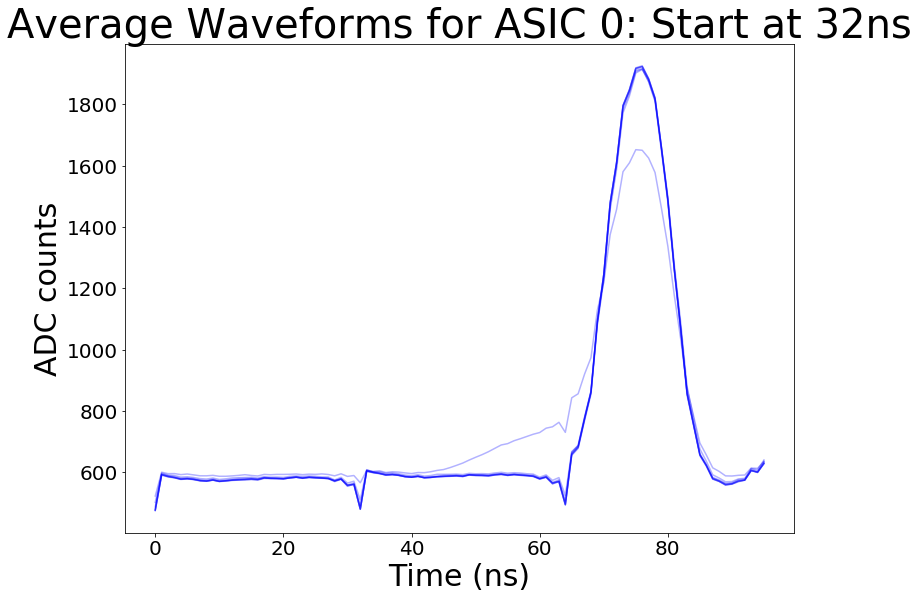

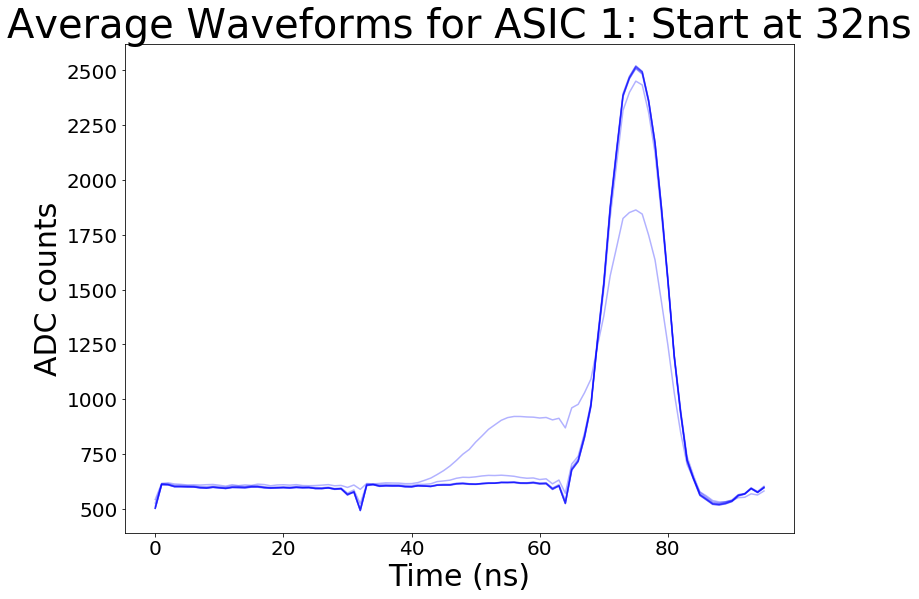

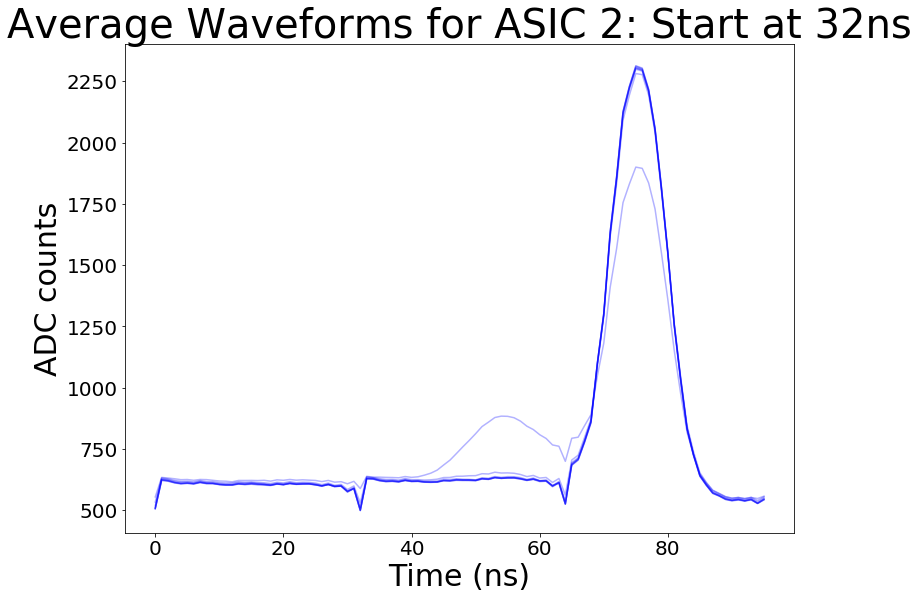

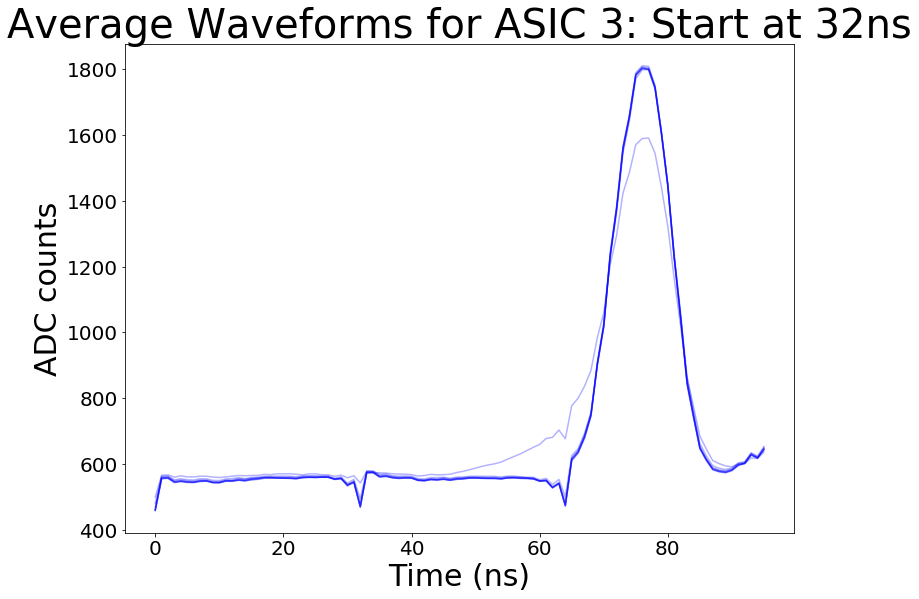

In [87]:
# Duration Scan begining at 32ns
# Using lowest point as phase shift correction

STRB1_32 = []
for ASIC in range(4):
    runs = []
    length = 3
    for run in range(320816,320824):
        data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/ASIC Initialization Scans/New STRB1 Duration+Location/sampleFileAllBlocks_run" + str(run) + "ASIC" + str(ASIC) + "CH6.npz", 'r'))
        waveforms = []
        for event in range(len(data['event'])):
            first_block = np.ndarray.tolist(data['samples'][event][:32])
            for num in first_block:
                if num<250:
                    first_block.remove(num)
            min_value = min(first_block)
            min_index = np.ndarray.tolist(data['samples'][event]).index(min_value)
            d = data['samples'][event][min_index: min_index+96]
            waveforms.append(d)
        avg_waveform = []
        for point in range(96):
            a = []
            for event in range(len(waveforms)):
                a.append(waveforms[event][point])
            avg_waveform.append(np.mean(a))
        runs.append(avg_waveform)
        plt.plot(avg_waveform, label = '32 to ' + str(32 + length), color = 'b', alpha = 0.3)
        length = length + 1
    STRB1_32.append(runs)
    plt.title('Average Waveforms for ASIC ' + str(ASIC) + ": Start at 32ns")
    plt.ylabel('ADC counts')
    plt.xlabel('Time (ns)')
    plt.show()

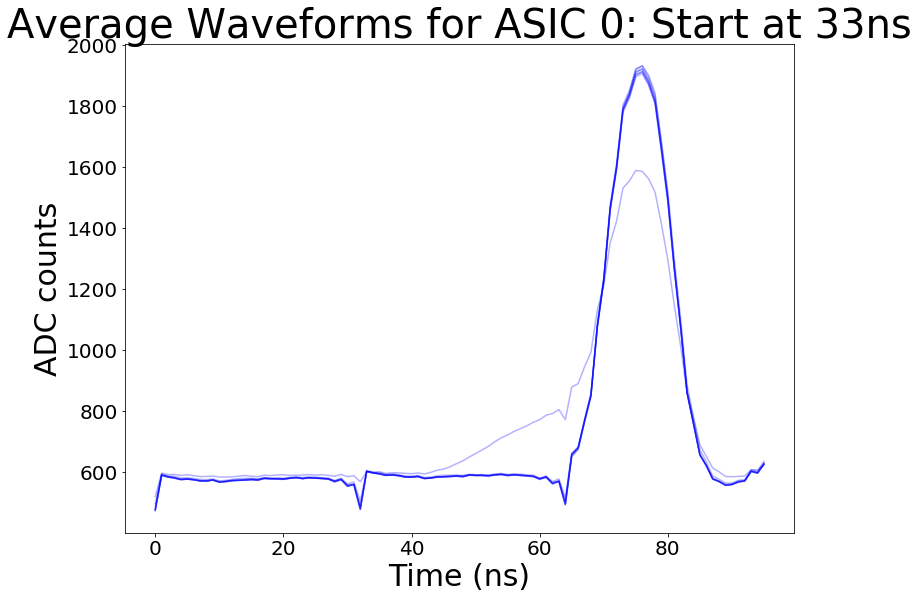

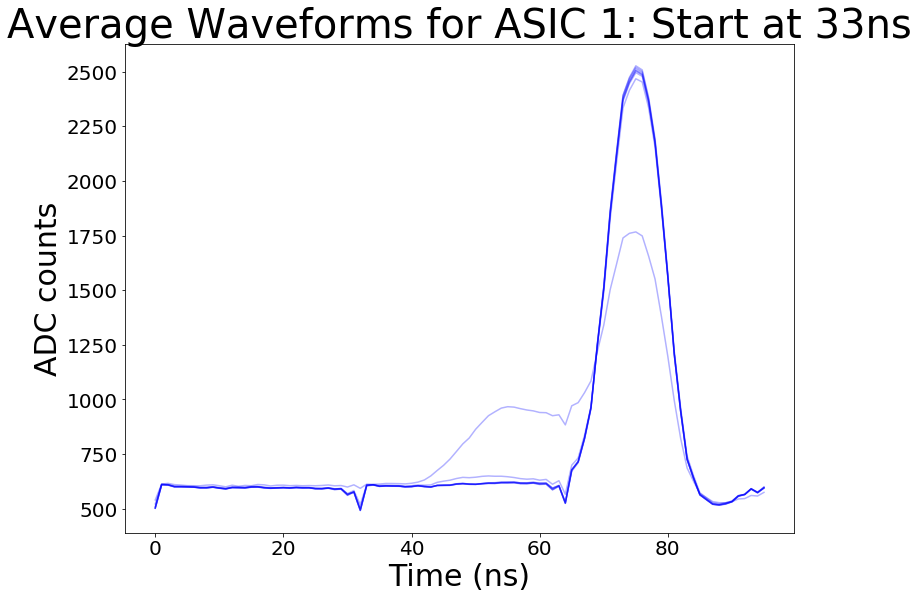

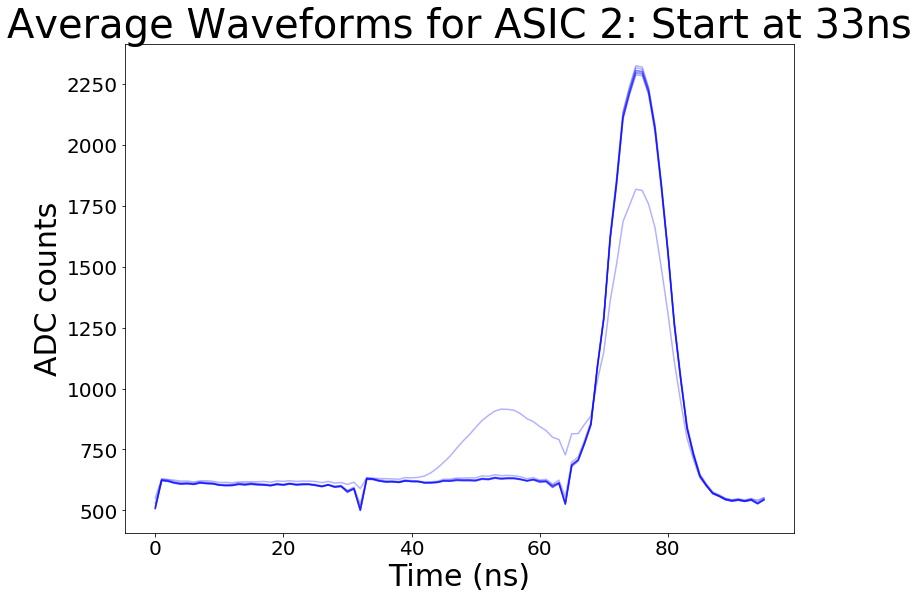

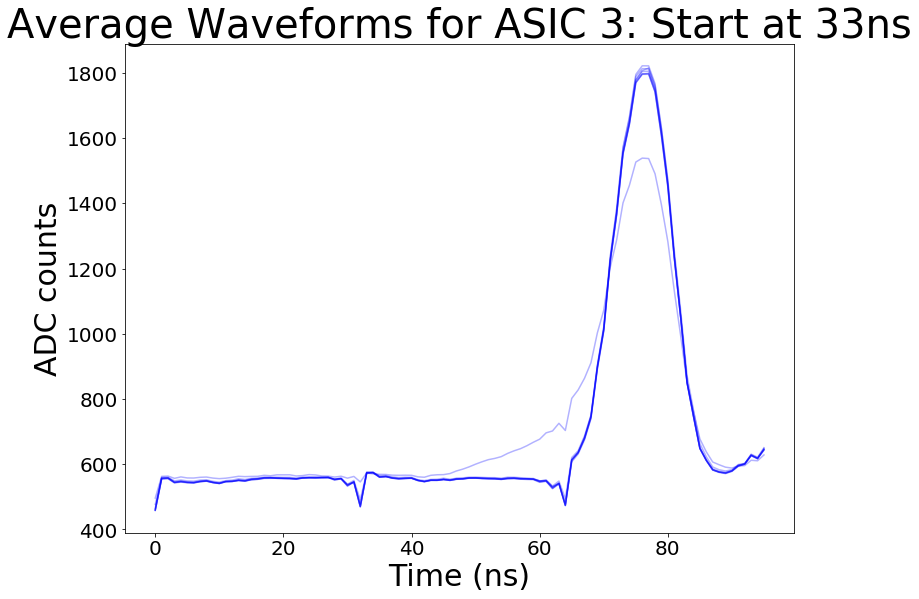

In [88]:
# Duration Scan begining at 33ns
# Using lowest point as phase shift correction

STRB1_33 = []
for ASIC in range(4):
    runs = []
    length = 3
    for run in range(320824,320832):
        data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/ASIC Initialization Scans/New STRB1 Duration+Location/sampleFileAllBlocks_run" + str(run) + "ASIC" + str(ASIC) + "CH6.npz", 'r'))
        waveforms = []
        for event in range(len(data['event'])):
            first_block = np.ndarray.tolist(data['samples'][event][:32])
            for num in first_block:
                if num<250:
                    first_block.remove(num)
            min_value = min(first_block)
            min_index = np.ndarray.tolist(data['samples'][event]).index(min_value)
            d = data['samples'][event][min_index: min_index+96]
            waveforms.append(d)
        avg_waveform = []
        for point in range(96):
            a = []
            for event in range(len(waveforms)):
                a.append(waveforms[event][point])
            avg_waveform.append(np.mean(a))
        runs.append(avg_waveform)
        plt.plot(avg_waveform, label = '33 to ' + str(33 + length), color = 'b', alpha = 0.3)
        length = length + 1
    STRB1_33.append(runs)
    plt.title('Average Waveforms for ASIC ' + str(ASIC) + ": Start at 33ns")
    plt.ylabel('ADC counts')
    plt.xlabel('Time (ns)')
    plt.show()

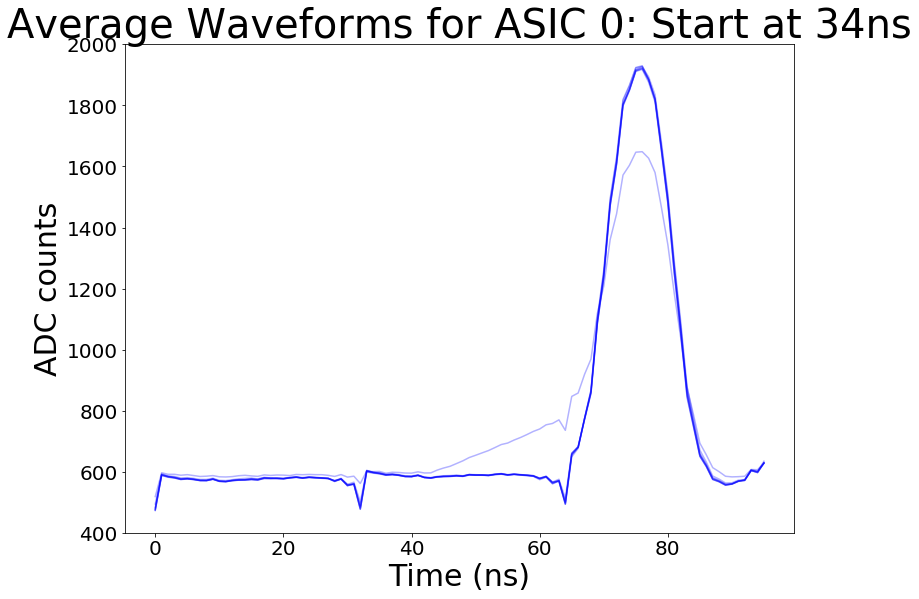

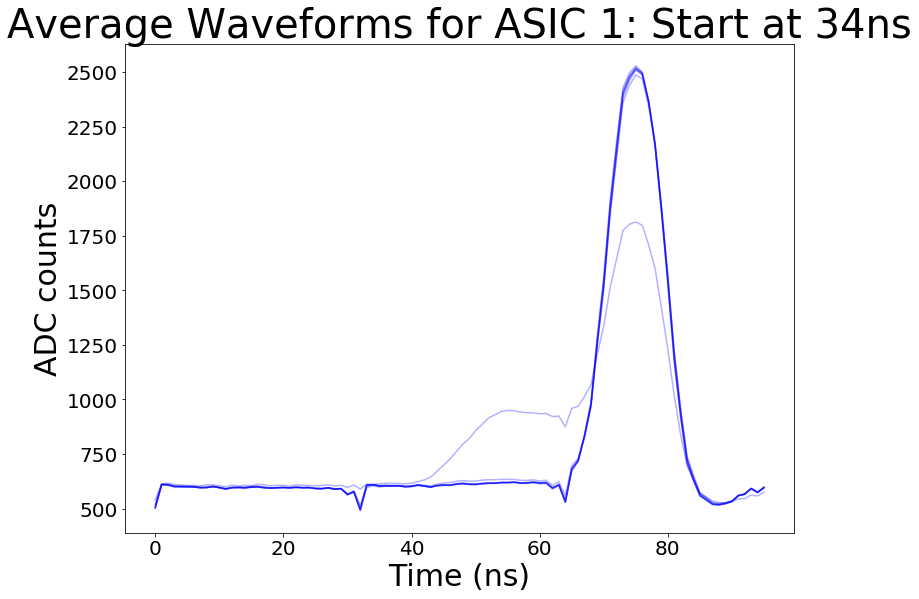

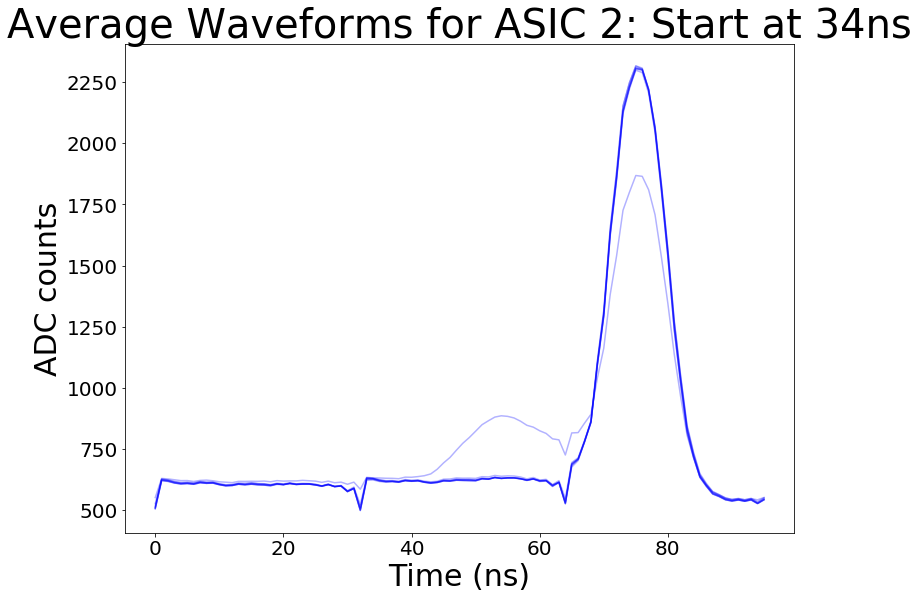

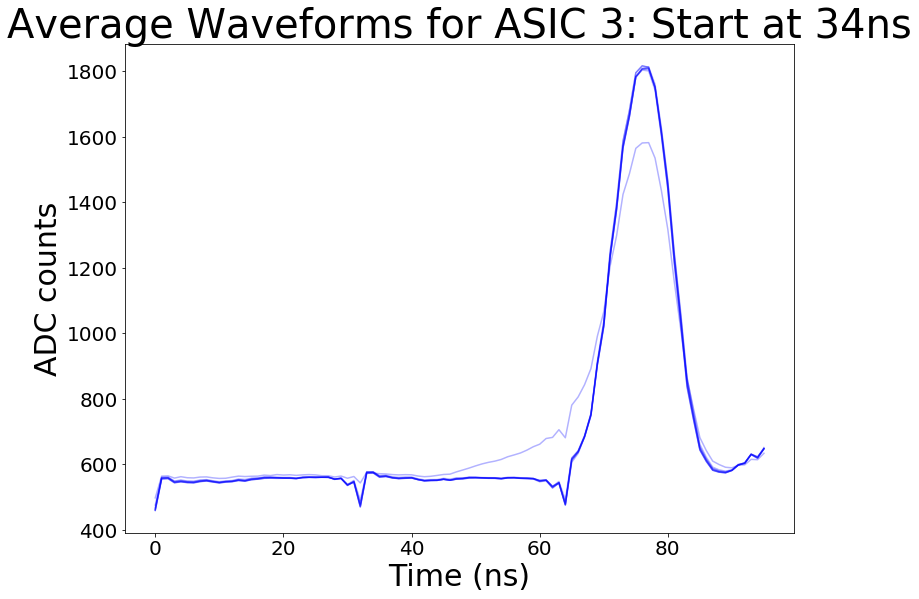

In [89]:
# Duration Scan begining at 34ns
# Using lowest point as phase shift correction

STRB1_34 = []
for ASIC in range(4):
    runs = []
    length = 3
    for run in range(320832,320840):
        data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/ASIC Initialization Scans/New STRB1 Duration+Location/sampleFileAllBlocks_run" + str(run) + "ASIC" + str(ASIC) + "CH6.npz", 'r'))
        waveforms = []
        for event in range(len(data['event'])):
            first_block = np.ndarray.tolist(data['samples'][event][:32])
            for num in first_block:
                if num<250:
                    first_block.remove(num)
            min_value = min(first_block)
            min_index = np.ndarray.tolist(data['samples'][event]).index(min_value)
            d = data['samples'][event][min_index: min_index+96]
            waveforms.append(d)
        avg_waveform = []
        for point in range(96):
            a = []
            for event in range(len(waveforms)):
                a.append(waveforms[event][point])
            avg_waveform.append(np.mean(a))
        runs.append(avg_waveform)
        plt.plot(avg_waveform, label = '34 to ' + str(34 + length), color = 'b', alpha = 0.3)
        length = length + 1
    STRB1_34.append(runs)
    plt.title('Average Waveforms for ASIC ' + str(ASIC) + ": Start at 34ns")
    plt.ylabel('ADC counts')
    plt.xlabel('Time (ns)')
    plt.show()

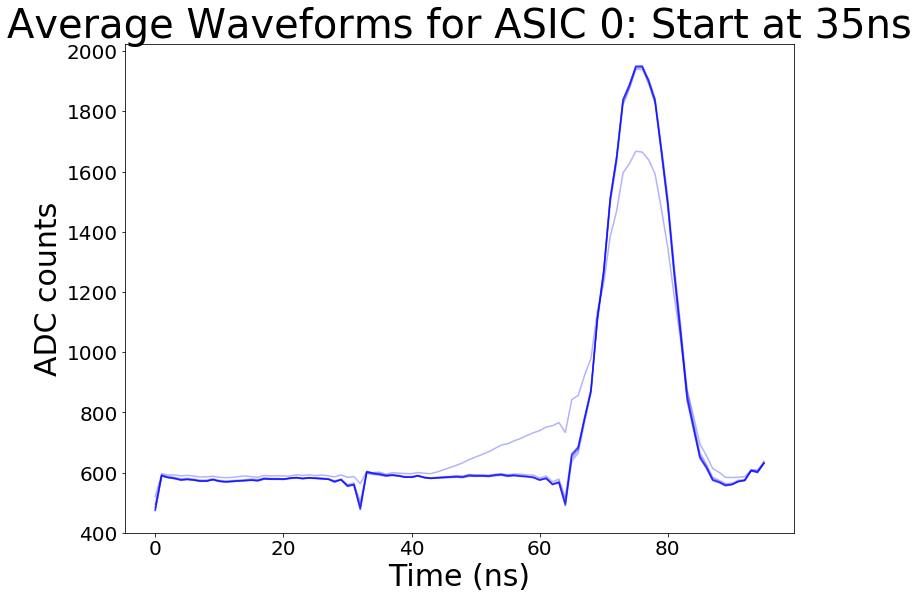

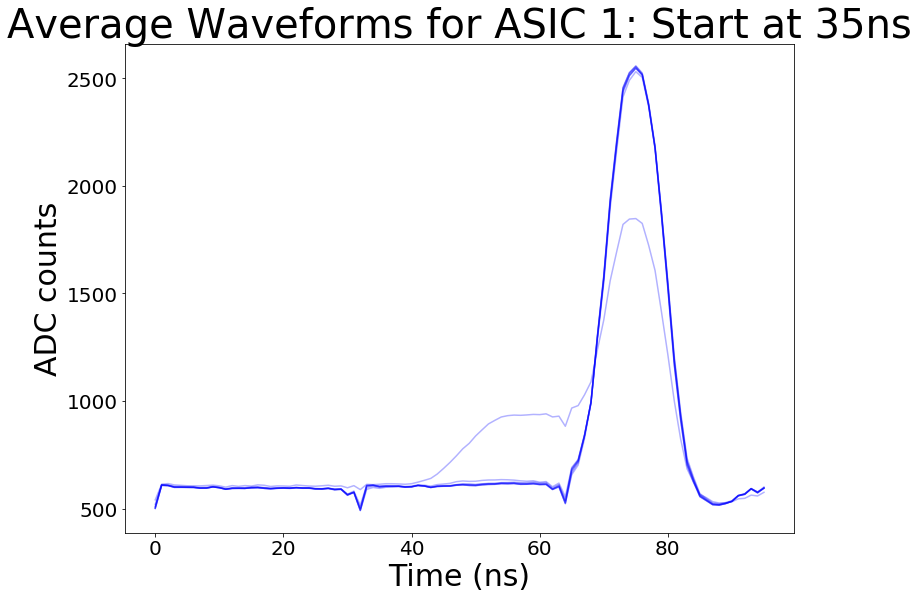

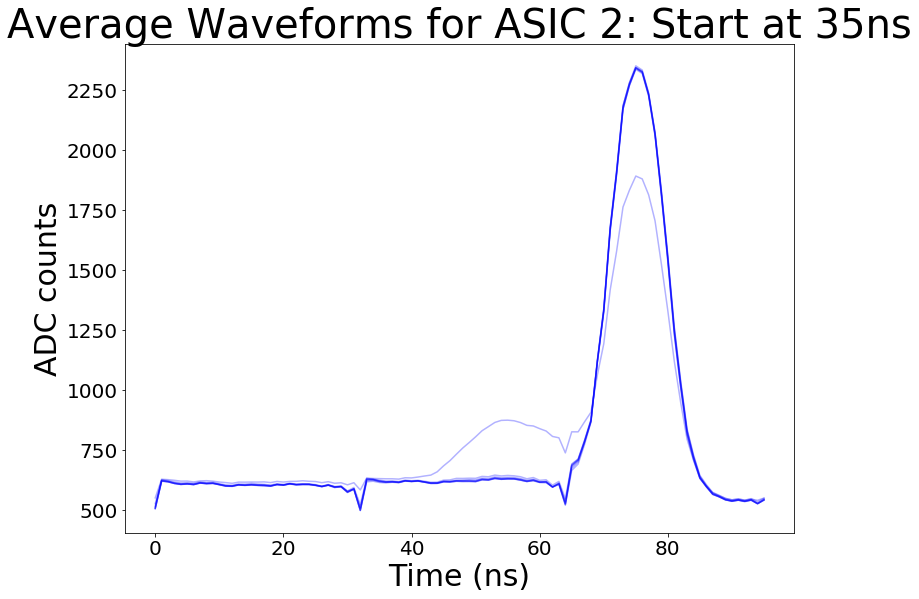

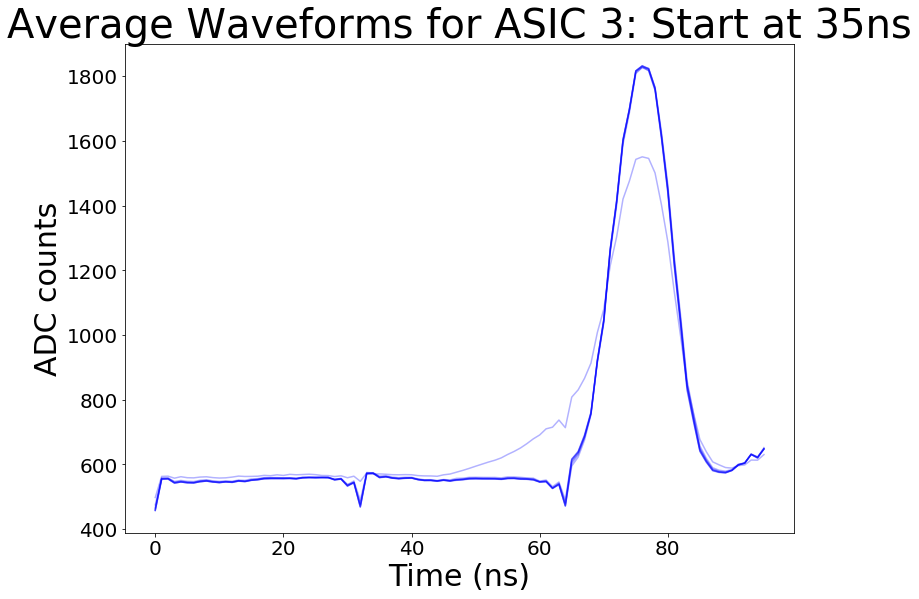

In [90]:
# Duration Scan begining at 35ns
# Using lowest point as phase shift correction

STRB1_35 = []
for ASIC in range(4):
    runs = []
    length = 3
    for run in range(320840,320848):
        data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/ASIC Initialization Scans/New STRB1 Duration+Location/sampleFileAllBlocks_run" + str(run) + "ASIC" + str(ASIC) + "CH6.npz", 'r'))
        waveforms = []
        for event in range(len(data['event'])):
            first_block = np.ndarray.tolist(data['samples'][event][:32])
            for num in first_block:
                if num<250:
                    first_block.remove(num)
            min_value = min(first_block)
            min_index = np.ndarray.tolist(data['samples'][event]).index(min_value)
            d = data['samples'][event][min_index: min_index+96]
            waveforms.append(d)
        avg_waveform = []
        for point in range(96):
            a = []
            for event in range(len(waveforms)):
                a.append(waveforms[event][point])
            avg_waveform.append(np.mean(a))
        runs.append(avg_waveform)
        plt.plot(avg_waveform, label = '35 to ' + str(35 + length), color = 'b', alpha = 0.3)
        length = length + 1
    STRB1_35.append(runs)
    plt.title('Average Waveforms for ASIC ' + str(ASIC) + ": Start at 35ns")
    plt.ylabel('ADC counts')
    plt.xlabel('Time (ns)')
    plt.show()

In [19]:
print(shape(STRB1_32))

(4, 8, 96)


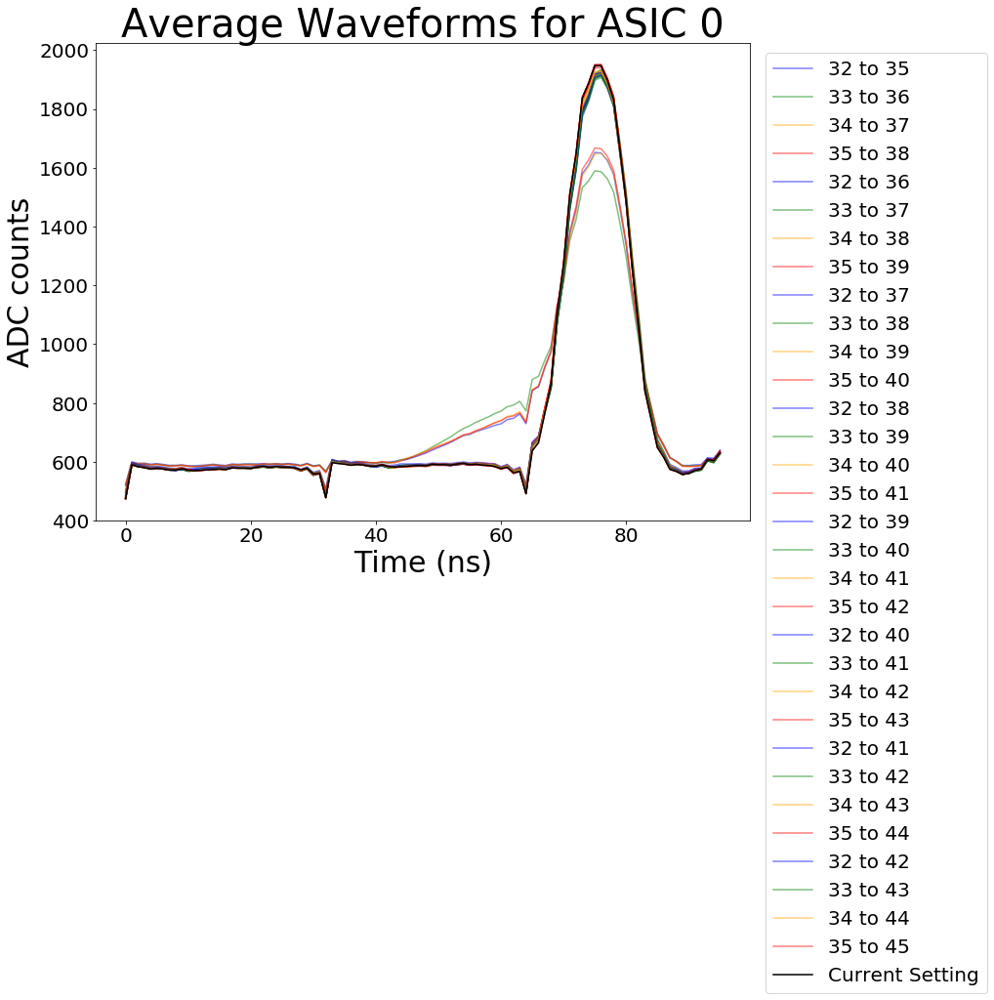

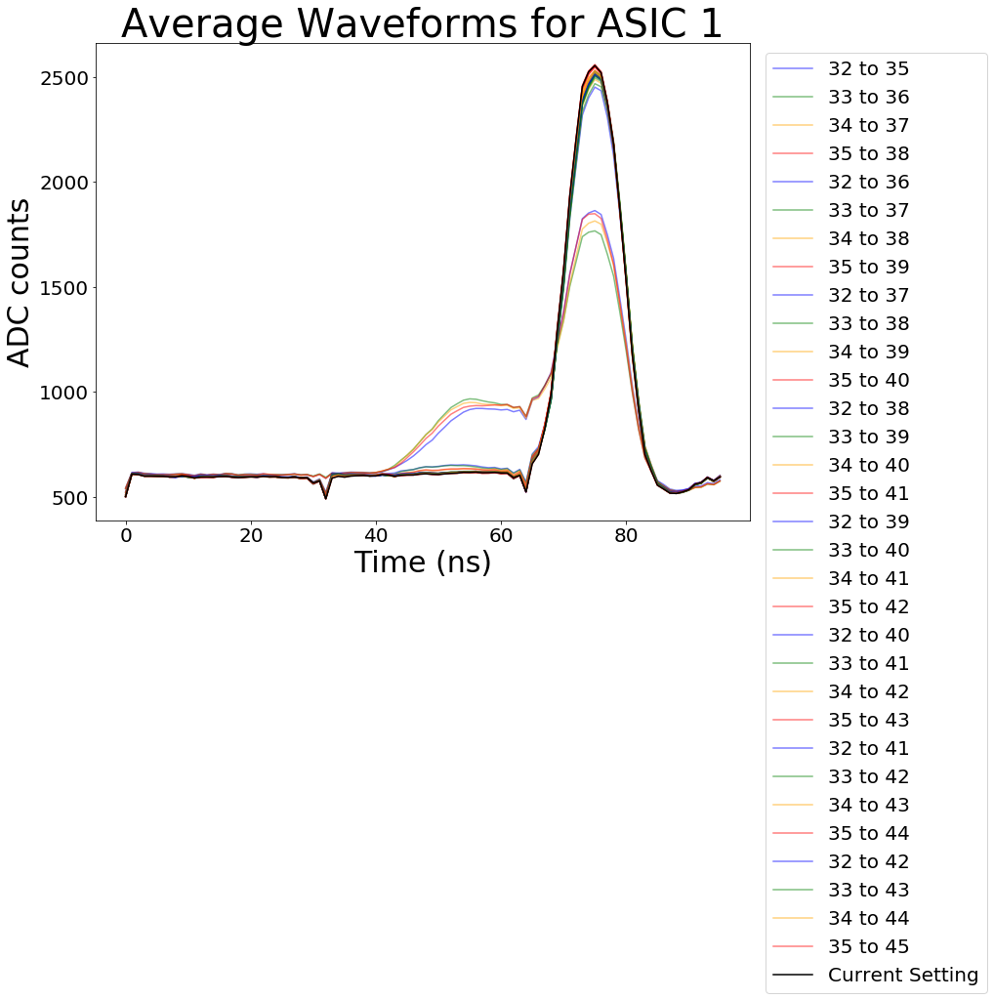

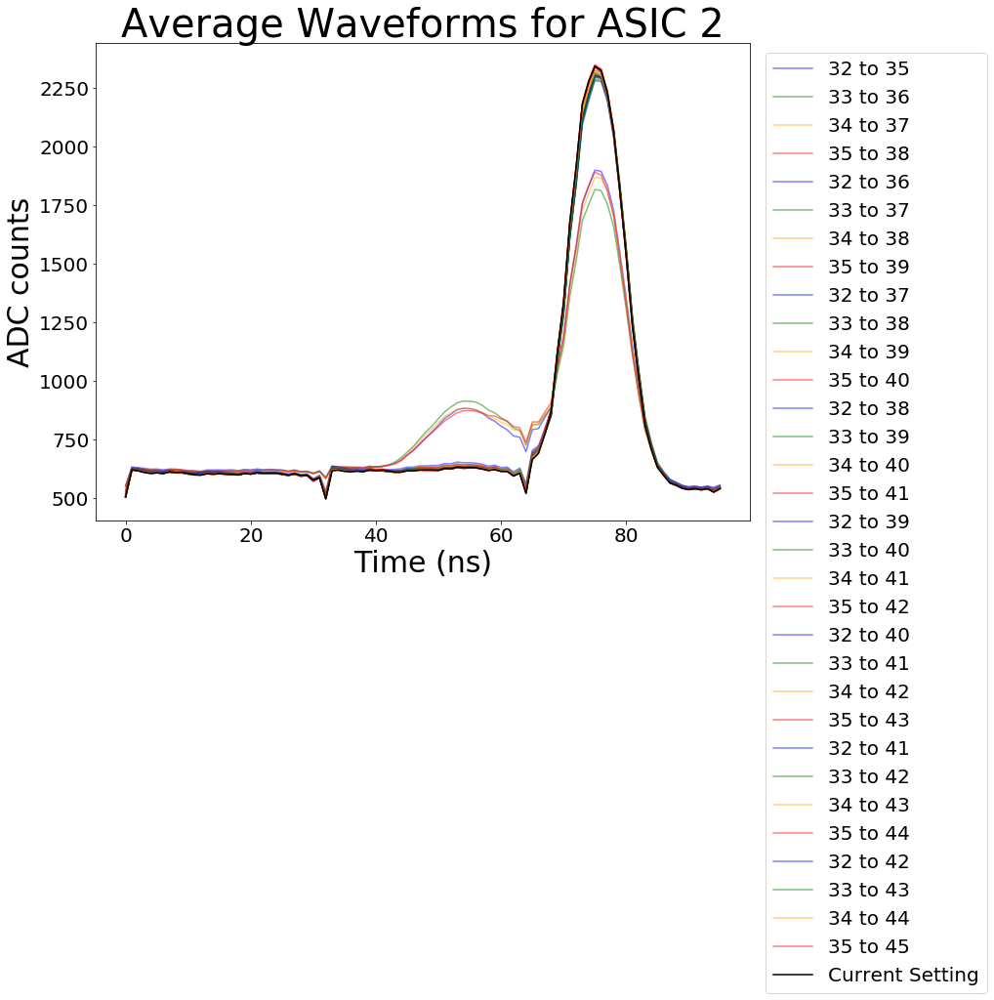

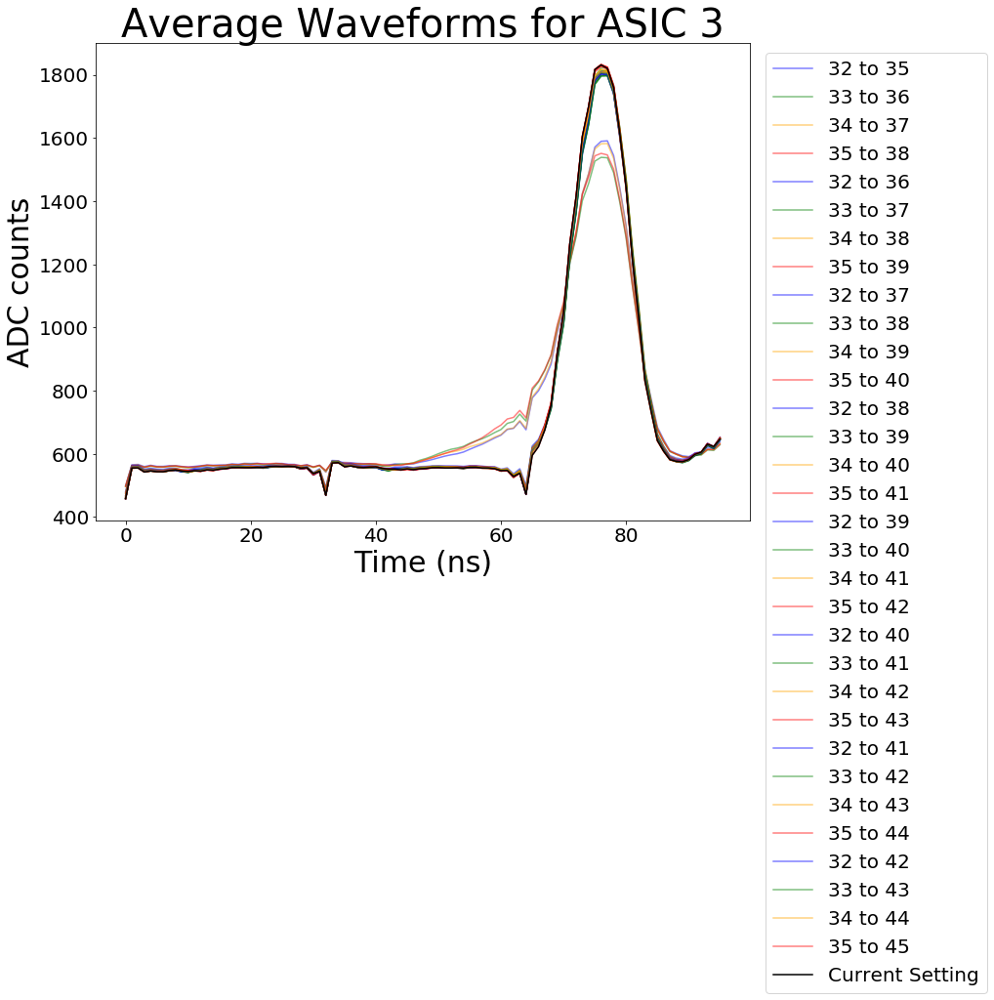

In [92]:
# Plot with rainbow colormap

number_runs = 8

for ASIC in range(4):
    length = 3
    for run in range(number_runs):
        plt.plot(STRB1_32[ASIC][run], label = '32 to ' + str(32 + length), color = 'blue', alpha = 0.5)
        plt.plot(STRB1_33[ASIC][run], label = '33 to ' + str(33 + length), color = 'green', alpha = 0.5)
        plt.plot(STRB1_34[ASIC][run], label = '34 to ' + str(34 + length), color = 'orange', alpha = 0.5)
        plt.plot(STRB1_35[ASIC][run], label = '35 to ' + str(35 + length), color = 'red', alpha = 0.5)
        length = length + 1
    plt.plot(STRB1_35[ASIC][7], label = 'Current Setting', color = 'black')
    plt.title('Average Waveforms for ASIC ' + str(ASIC))
    plt.ylabel('ADC counts')
    plt.xlabel('Time (ns)')
    plt.legend(bbox_to_anchor = (1.01,1),loc = 'upper left')
    plt.show()

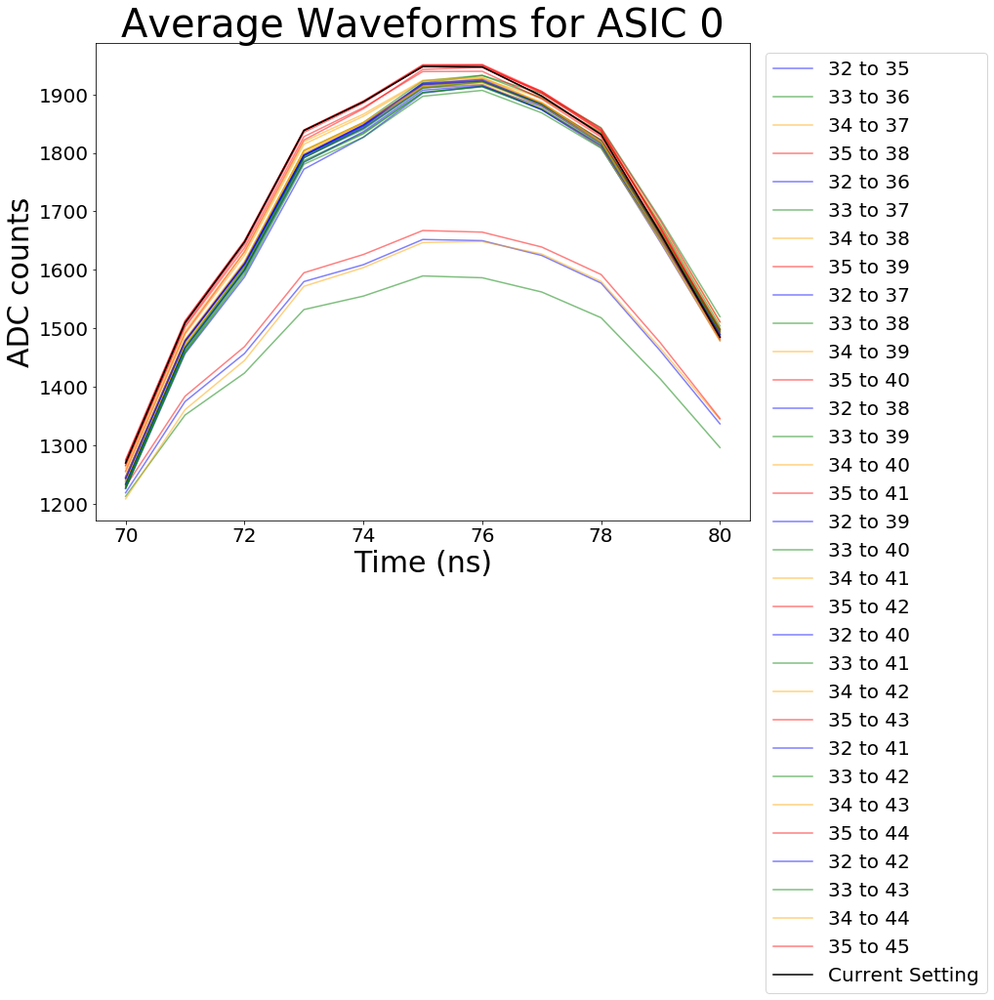

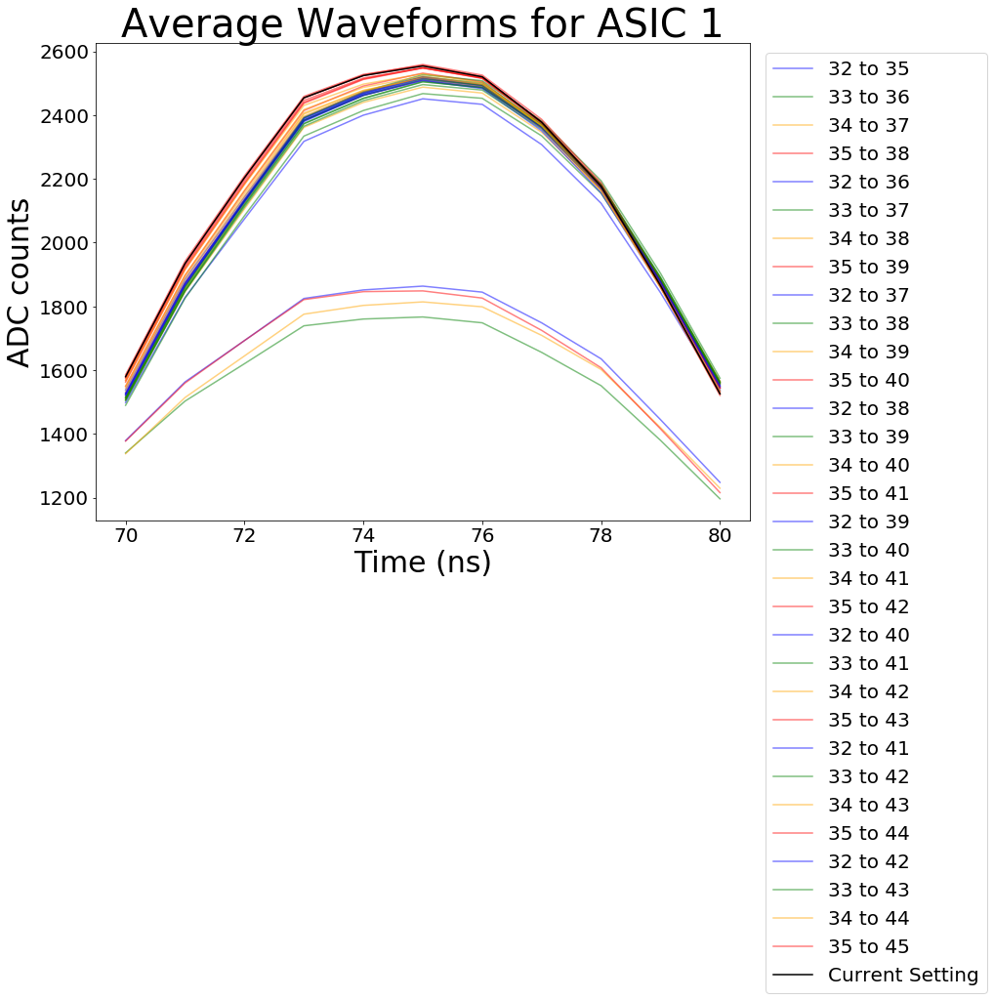

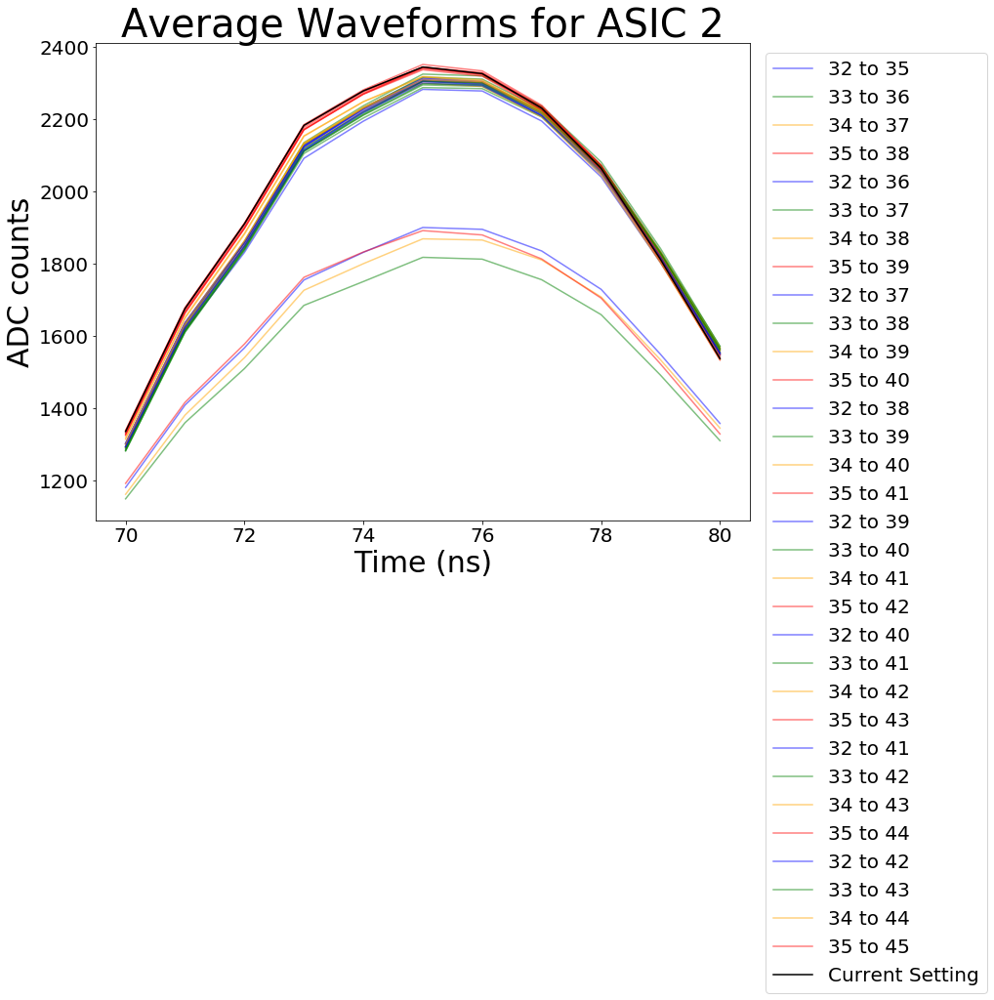

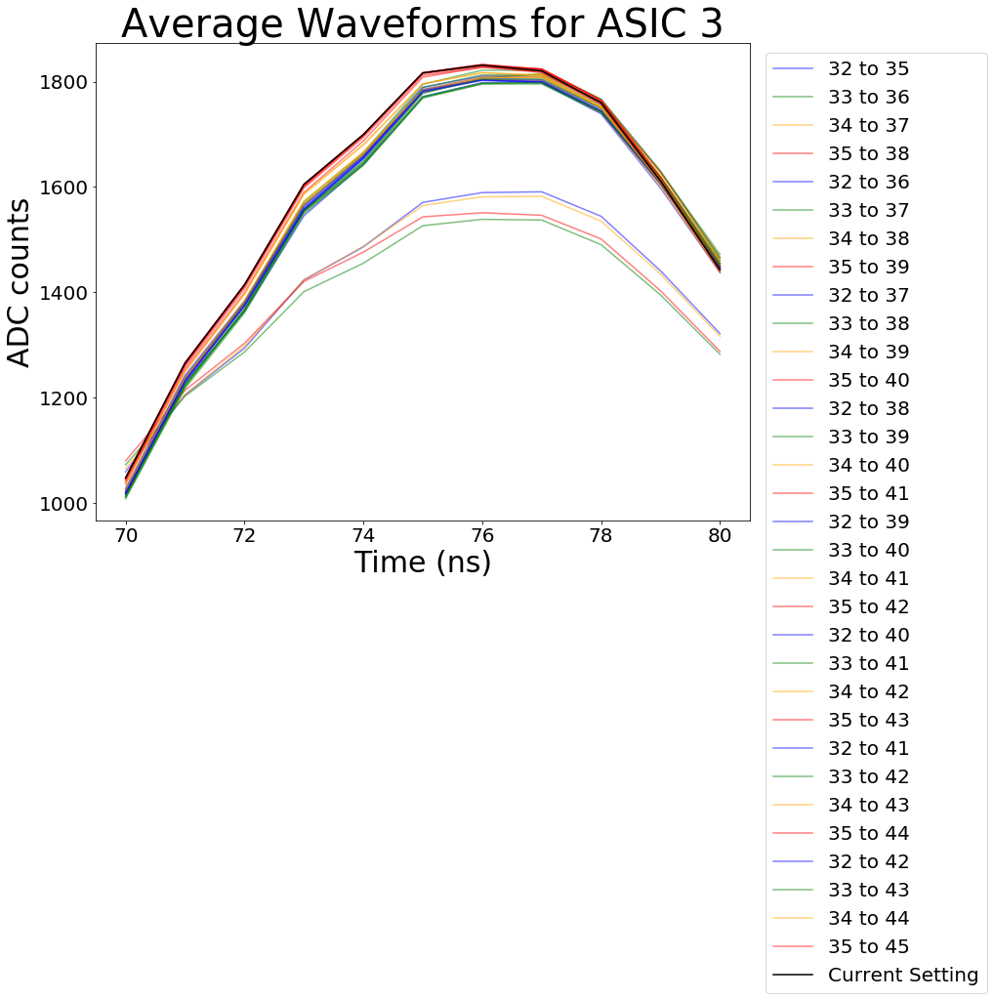

In [96]:
# Zoom in on top of pulse

number_runs = 8
x = [i for i in range(70,81)]

for ASIC in range(4):
    length = 3
    for run in range(number_runs):
        plt.plot(x, STRB1_32[ASIC][run][70:81], label = '32 to ' + str(32 + length), color = 'blue', alpha = 0.5)
        plt.plot(x, STRB1_33[ASIC][run][70:81], label = '33 to ' + str(33 + length), color = 'green', alpha = 0.5)
        plt.plot(x, STRB1_34[ASIC][run][70:81], label = '34 to ' + str(34 + length), color = 'orange', alpha = 0.5)
        plt.plot(x, STRB1_35[ASIC][run][70:81], label = '35 to ' + str(35 + length), color = 'red', alpha = 0.5)
        length = length + 1
    plt.plot(x, STRB1_35[ASIC][7][70:81], label = 'Current Setting', color = 'black')
    plt.title('Average Waveforms for ASIC ' + str(ASIC))
    plt.ylabel('ADC counts')
    plt.xlabel('Time (ns)')
    plt.legend(bbox_to_anchor = (1.01,1),loc = 'upper left')
    plt.show()

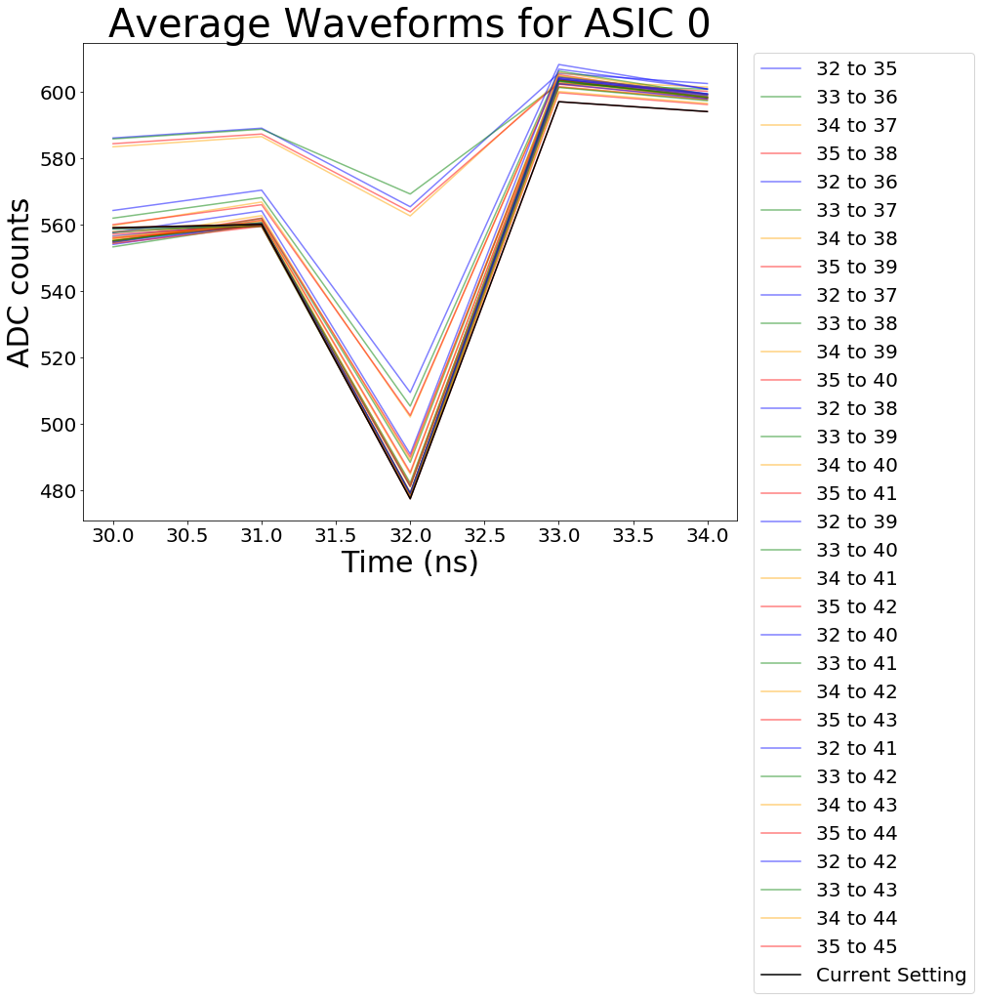

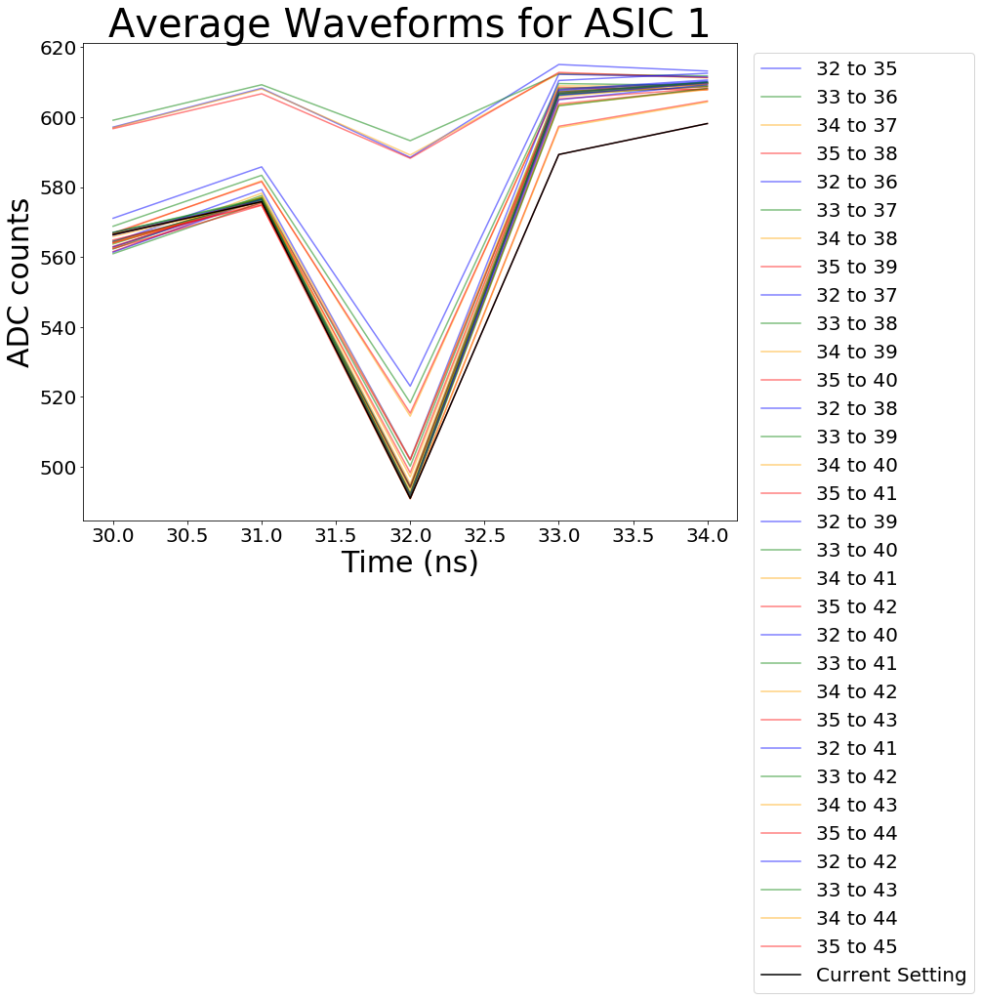

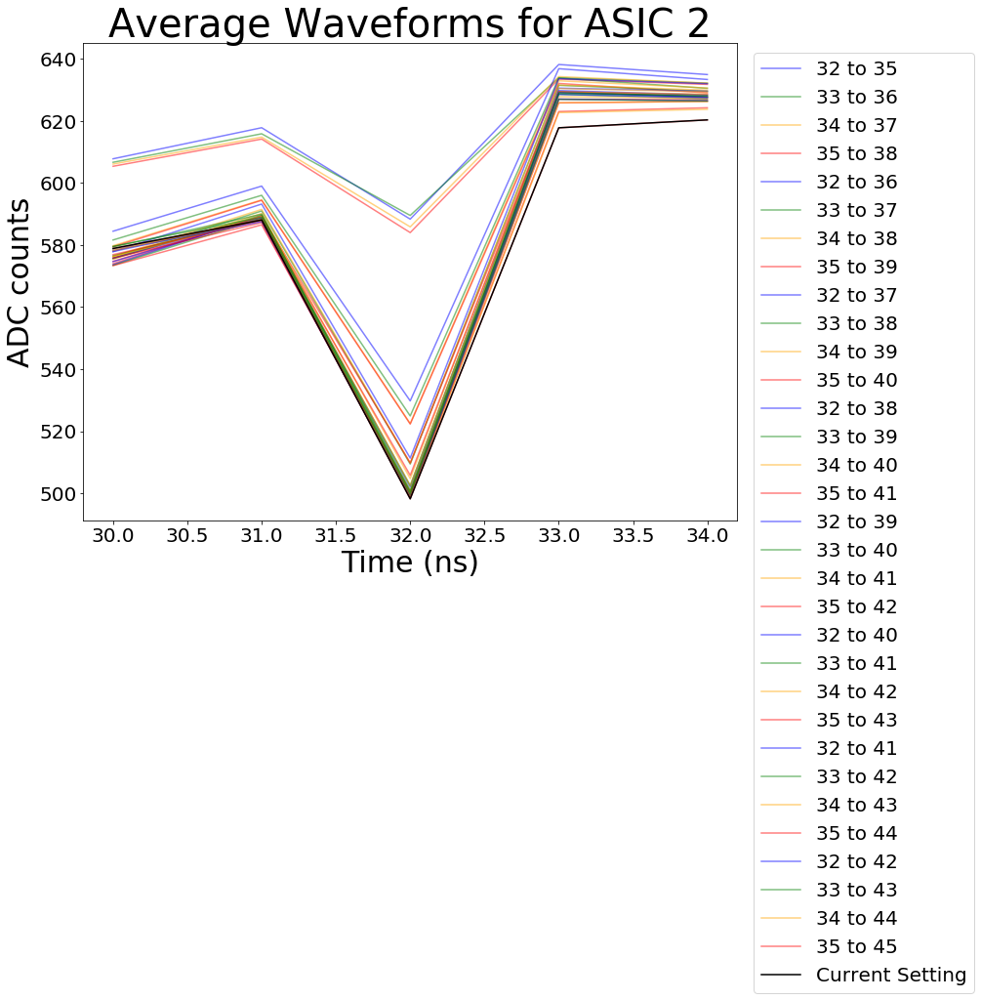

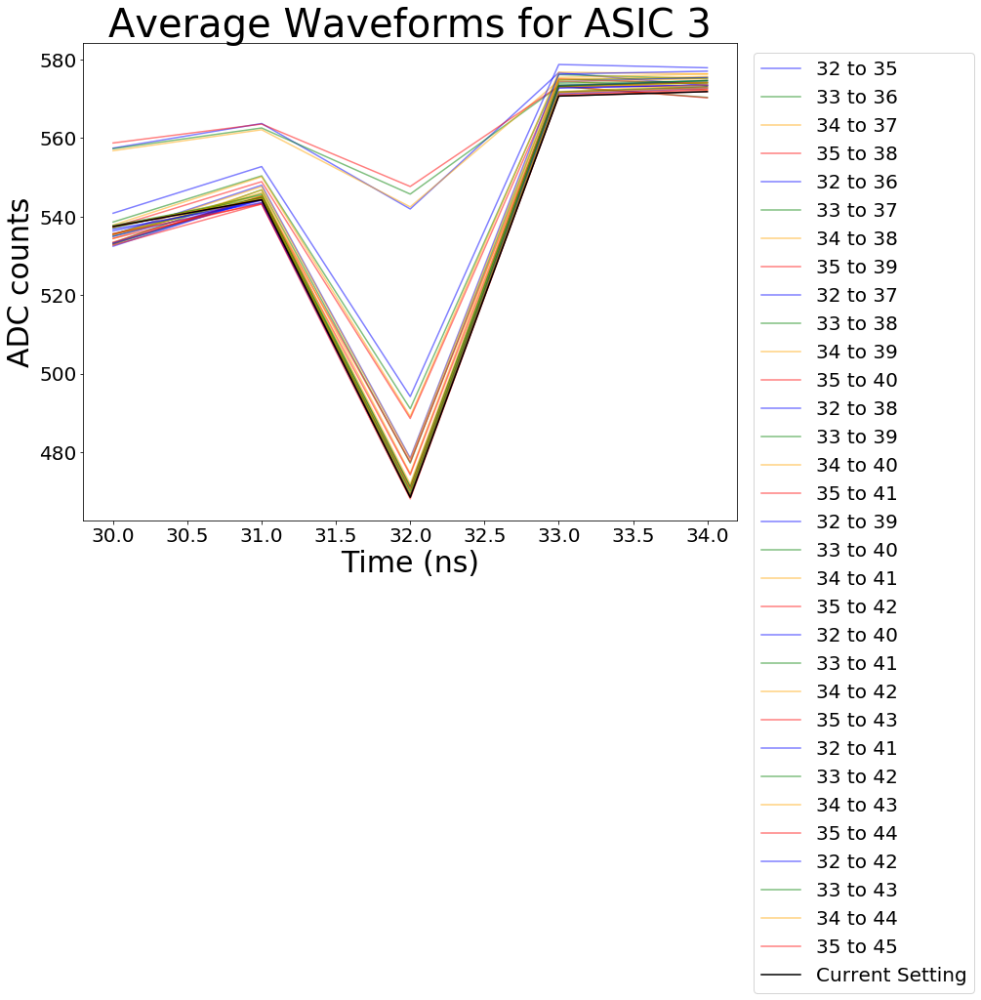

In [97]:
# Zoom in on glitch location

number_runs = 8
x = [i for i in range(30,35)]

for ASIC in range(4):
    length = 3
    for run in range(number_runs):
        plt.plot(x, STRB1_32[ASIC][run][30:35], label = '32 to ' + str(32 + length), color = 'blue', alpha = 0.5)
        plt.plot(x, STRB1_33[ASIC][run][30:35], label = '33 to ' + str(33 + length), color = 'green', alpha = 0.5)
        plt.plot(x, STRB1_34[ASIC][run][30:35], label = '34 to ' + str(34 + length), color = 'orange', alpha = 0.5)
        plt.plot(x, STRB1_35[ASIC][run][30:35], label = '35 to ' + str(35 + length), color = 'red', alpha = 0.5)
        length = length + 1
    plt.plot(x, STRB1_35[ASIC][7][30:35], label = 'Current Setting', color = 'black')
    plt.title('Average Waveforms for ASIC ' + str(ASIC))
    plt.ylabel('ADC counts')
    plt.xlabel('Time (ns)')
    plt.legend(bbox_to_anchor = (1.01,1),loc = 'upper left')
    plt.show()

In [36]:
## Even waveforms only ##

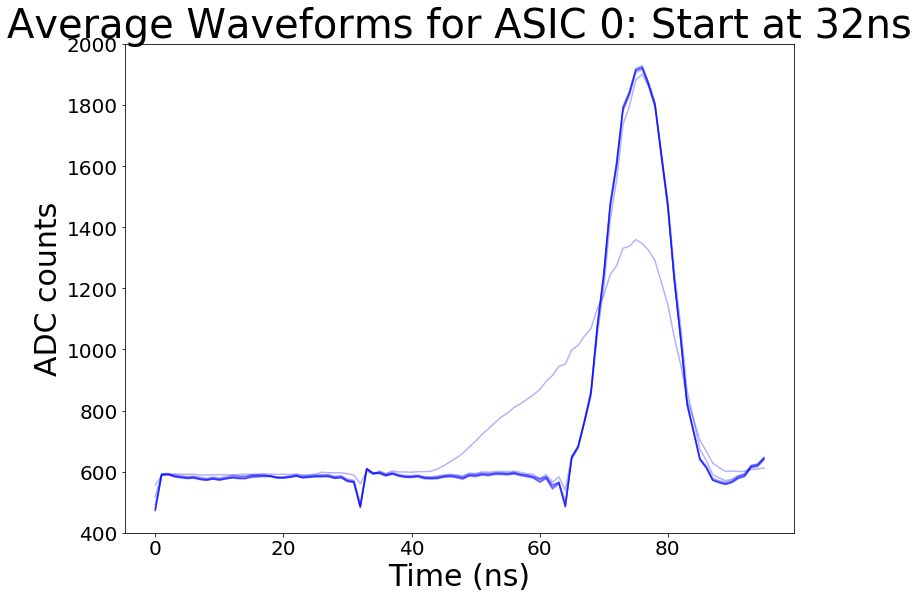

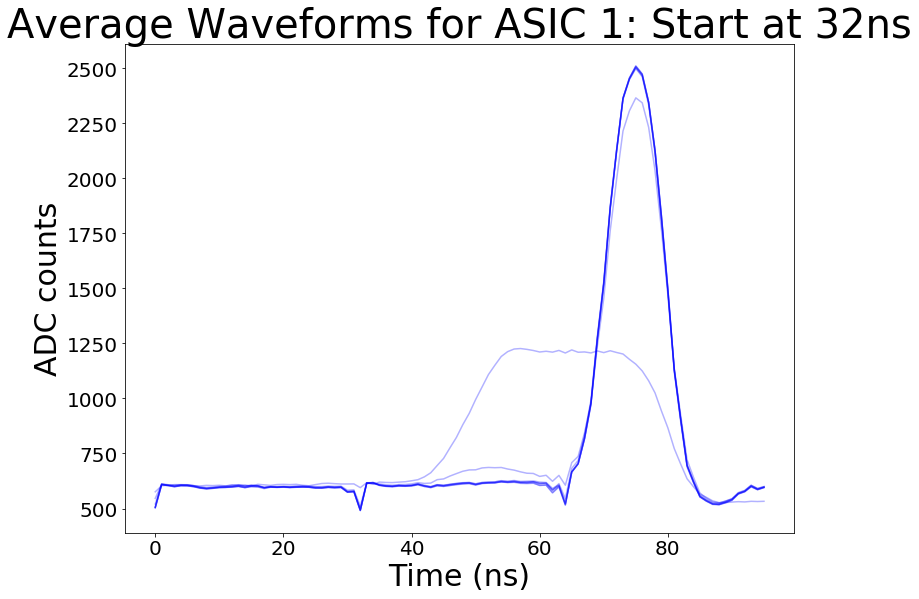

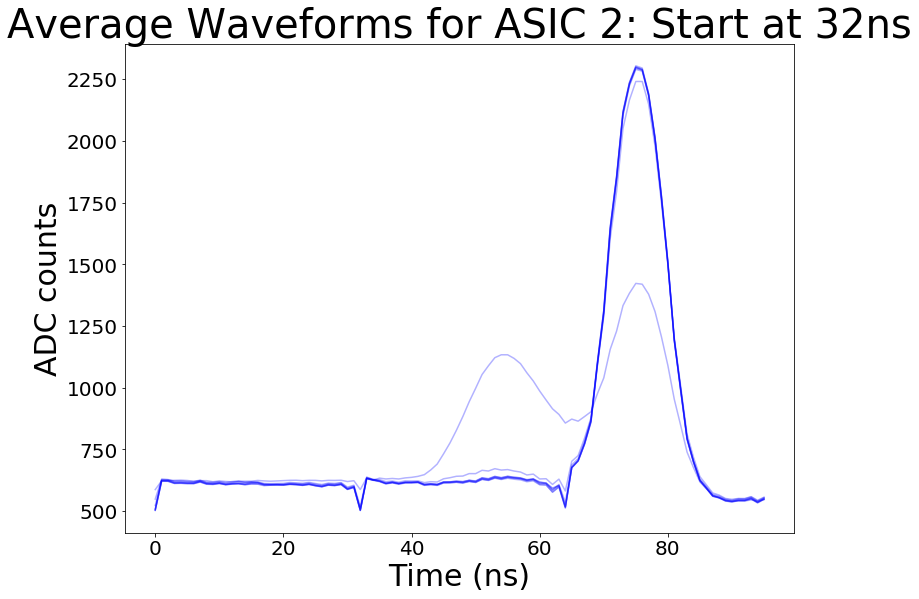

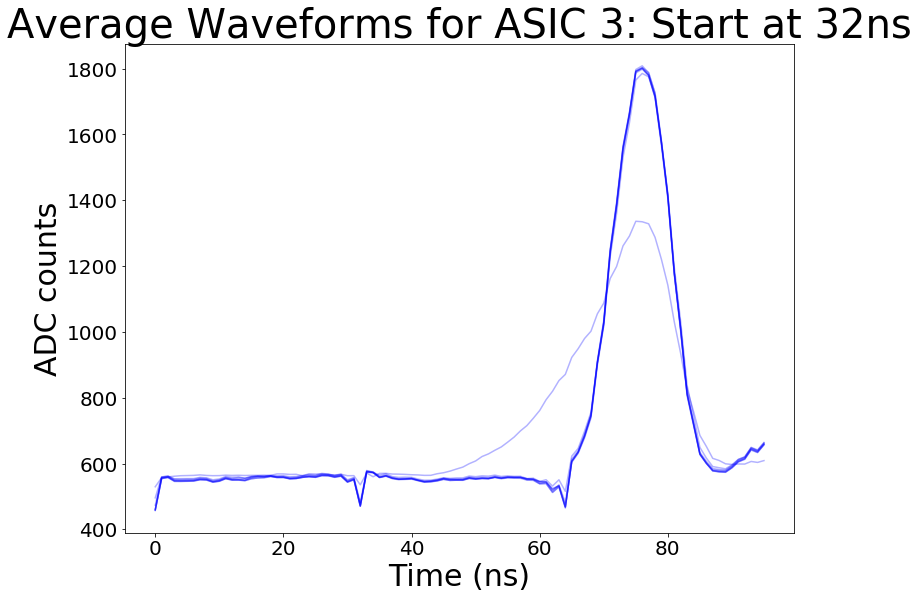

In [99]:
# Duration Scan begining at 32ns
# Using lowest point as phase shift correction

STRB1_32_even = []
for ASIC in range(4):
    runs = []
    length = 3
    for run in range(320816,320824):
        data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/ASIC Initialization Scans/New STRB1 Duration+Location/sampleFileAllBlocks_run" + str(run) + "ASIC" + str(ASIC) + "CH6.npz", 'r'))
        waveforms = []
        for event in range(len(data['event'])):
            block = int(data['block'][event])
            if block%2==0:
                first_block = np.ndarray.tolist(data['samples'][event][:32])
                for num in first_block:
                    if num<250:
                        first_block.remove(num)
                min_value = min(first_block)
                min_index = np.ndarray.tolist(data['samples'][event]).index(min_value)
                d = data['samples'][event][min_index: min_index+96]
                waveforms.append(d)
        avg_waveform = []
        for point in range(96):
            a = []
            for event in range(len(waveforms)):
                a.append(waveforms[event][point])
            avg_waveform.append(np.mean(a))
        runs.append(avg_waveform)
        plt.plot(avg_waveform, label = '32 to ' + str(32 + length), color = 'b', alpha = 0.3)
        length = length + 1
    STRB1_32_even.append(runs)
    plt.title('Even Average Waveforms for ASIC ' + str(ASIC) + ": Start at 32ns")
    plt.ylabel('ADC counts')
    plt.xlabel('Time (ns)')
    plt.show()

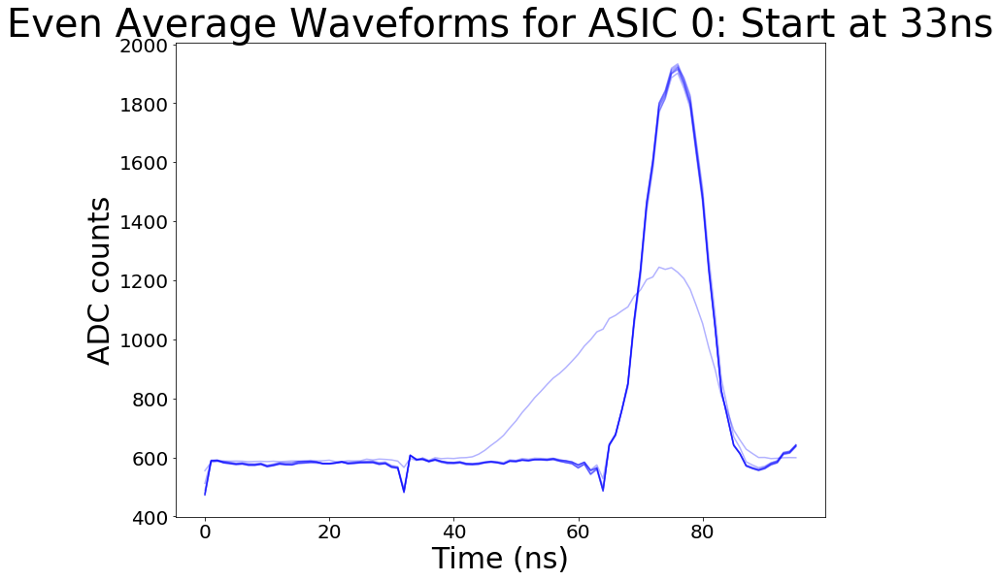

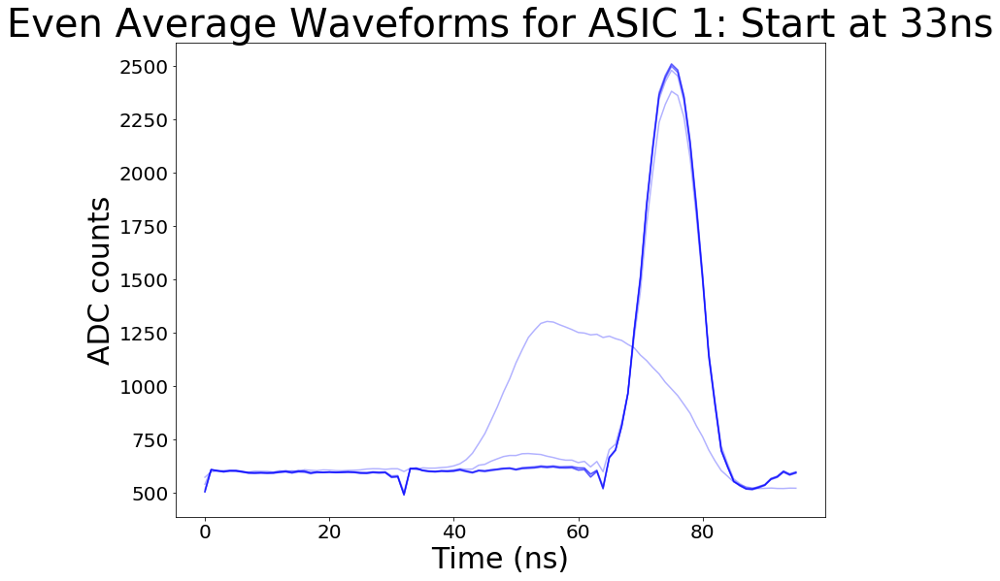

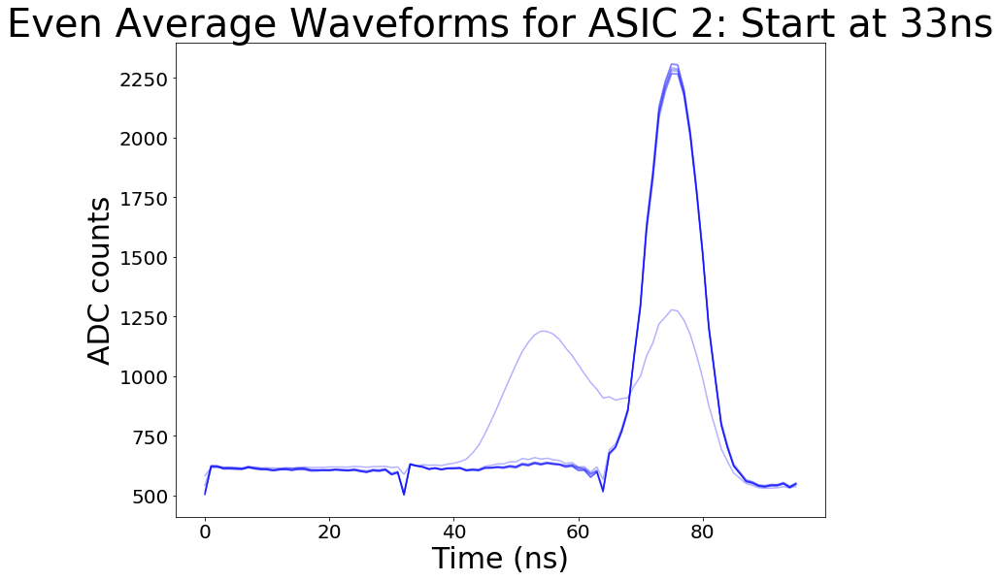

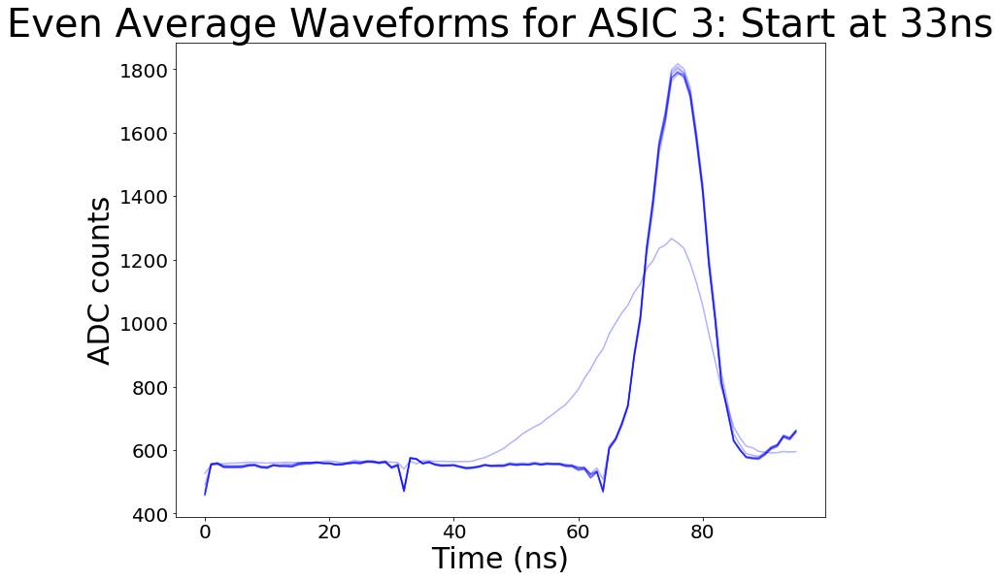

In [102]:
# Duration Scan begining at 33ns
# Using lowest point as phase shift correction

STRB1_33_even = []
for ASIC in range(4):
    runs = []
    length = 3
    for run in range(320824,320832):
        data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/ASIC Initialization Scans/New STRB1 Duration+Location/sampleFileAllBlocks_run" + str(run) + "ASIC" + str(ASIC) + "CH6.npz", 'r'))
        waveforms = []
        for event in range(len(data['event'])):
            block = int(data['block'][event])
            if block%2==0:
                first_block = np.ndarray.tolist(data['samples'][event][:32])
                for num in first_block:
                    if num<250:
                        first_block.remove(num)
                min_value = min(first_block)
                min_index = np.ndarray.tolist(data['samples'][event]).index(min_value)
                d = data['samples'][event][min_index: min_index+96]
                waveforms.append(d)
        avg_waveform = []
        for point in range(96):
            a = []
            for event in range(len(waveforms)):
                a.append(waveforms[event][point])
            avg_waveform.append(np.mean(a))
        runs.append(avg_waveform)
        plt.plot(avg_waveform, label = '33 to ' + str(33 + length), color = 'b', alpha = 0.3)
        length = length + 1
    STRB1_33_even.append(runs)
    plt.title('Even Average Waveforms for ASIC ' + str(ASIC) + ": Start at 33ns")
    plt.ylabel('ADC counts')
    plt.xlabel('Time (ns)')
    plt.show()

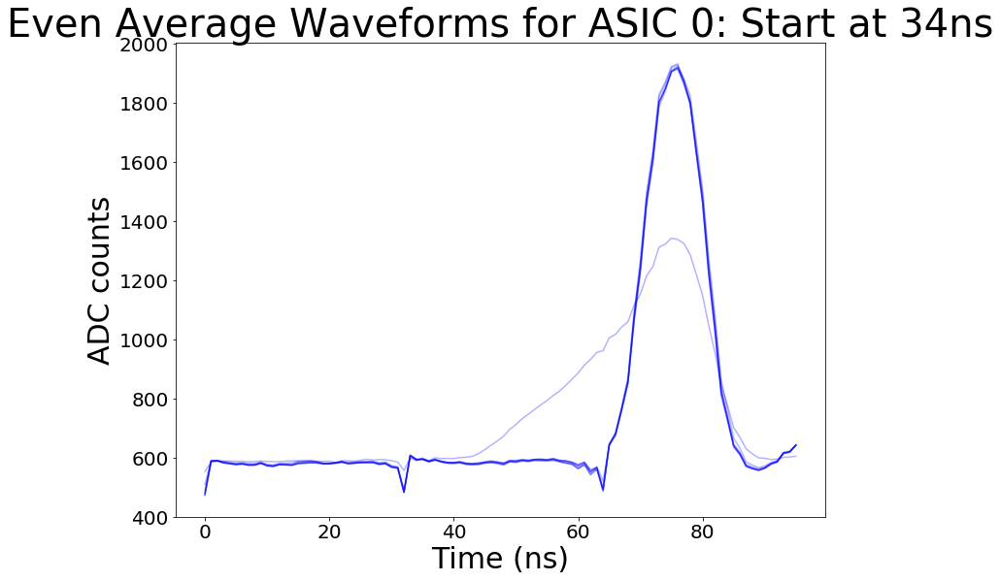

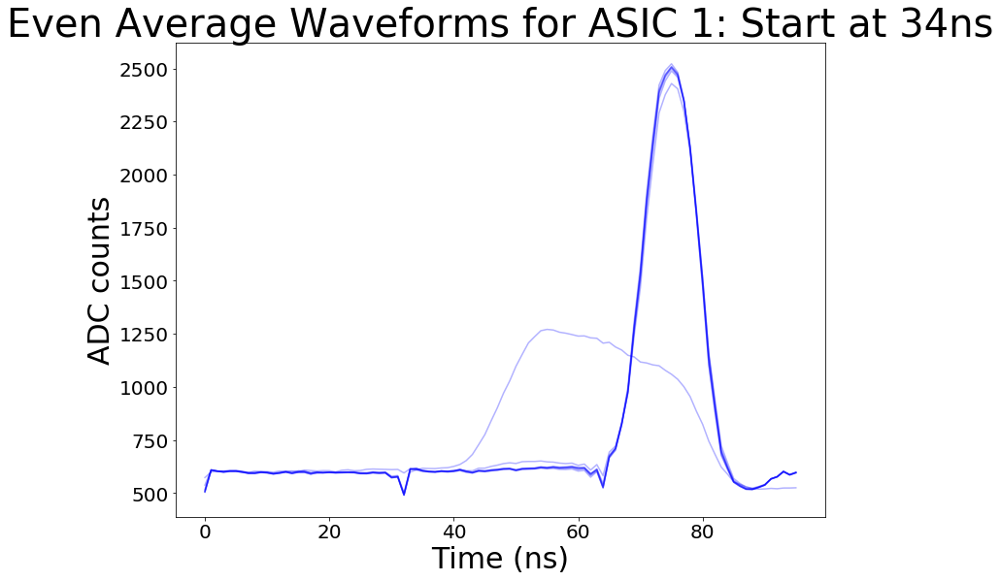

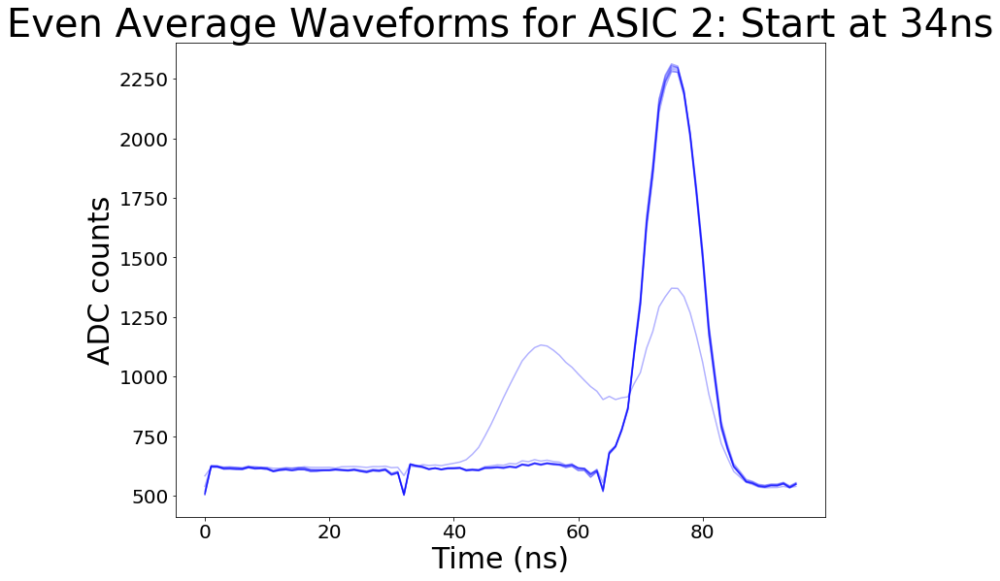

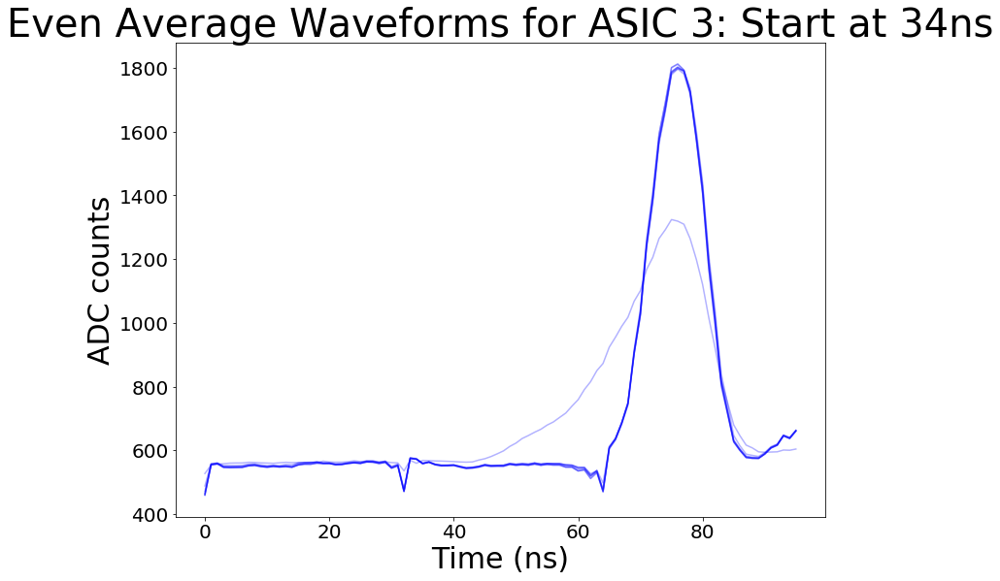

In [101]:
# Duration Scan begining at 34ns
# Using lowest point as phase shift correction

STRB1_34_even = []
for ASIC in range(4):
    runs = []
    length = 3
    for run in range(320832,320840):
        data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/ASIC Initialization Scans/New STRB1 Duration+Location/sampleFileAllBlocks_run" + str(run) + "ASIC" + str(ASIC) + "CH6.npz", 'r'))
        waveforms = []
        for event in range(len(data['event'])):
            block = int(data['block'][event])
            if block%2==0:
                first_block = np.ndarray.tolist(data['samples'][event][:32])
                for num in first_block:
                    if num<250:
                        first_block.remove(num)
                min_value = min(first_block)
                min_index = np.ndarray.tolist(data['samples'][event]).index(min_value)
                d = data['samples'][event][min_index: min_index+96]
                waveforms.append(d)
        avg_waveform = []
        for point in range(96):
            a = []
            for event in range(len(waveforms)):
                a.append(waveforms[event][point])
            avg_waveform.append(np.mean(a))
        runs.append(avg_waveform)
        plt.plot(avg_waveform, label = '34 to ' + str(34 + length), color = 'b', alpha = 0.3)
        length = length + 1
    STRB1_34_even.append(runs)
    plt.title('Even Average Waveforms for ASIC ' + str(ASIC) + ": Start at 34ns")
    plt.ylabel('ADC counts')
    plt.xlabel('Time (ns)')
    plt.show()

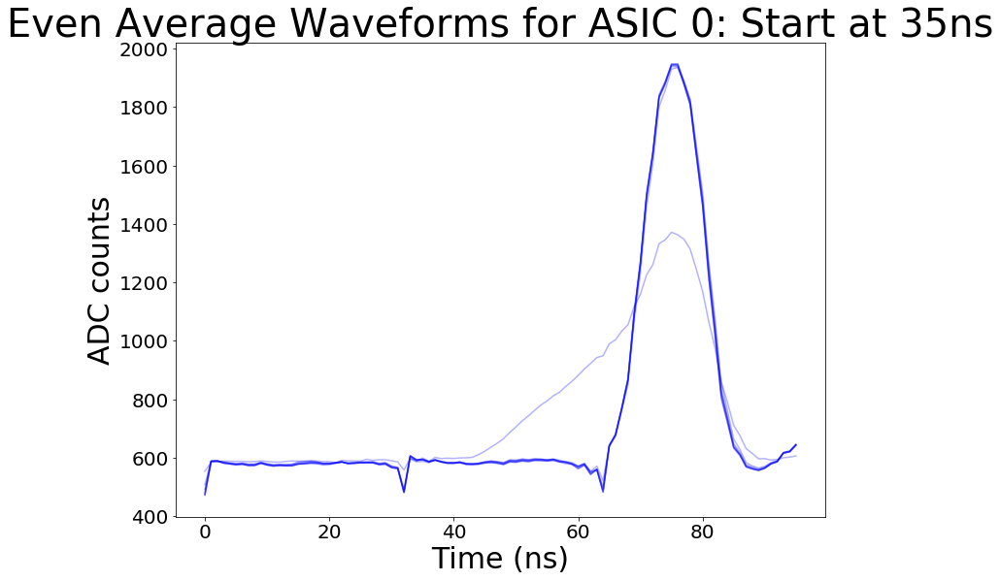

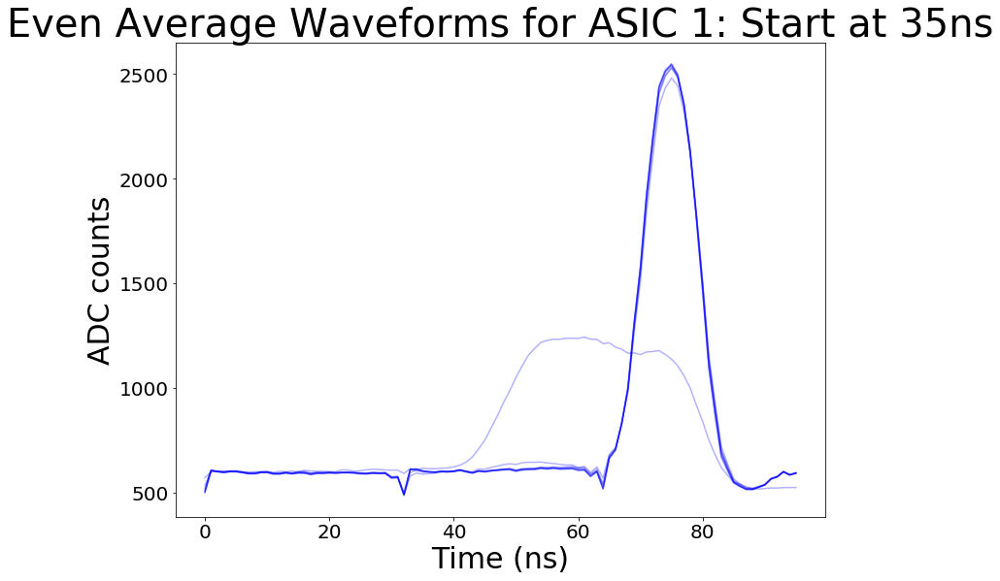

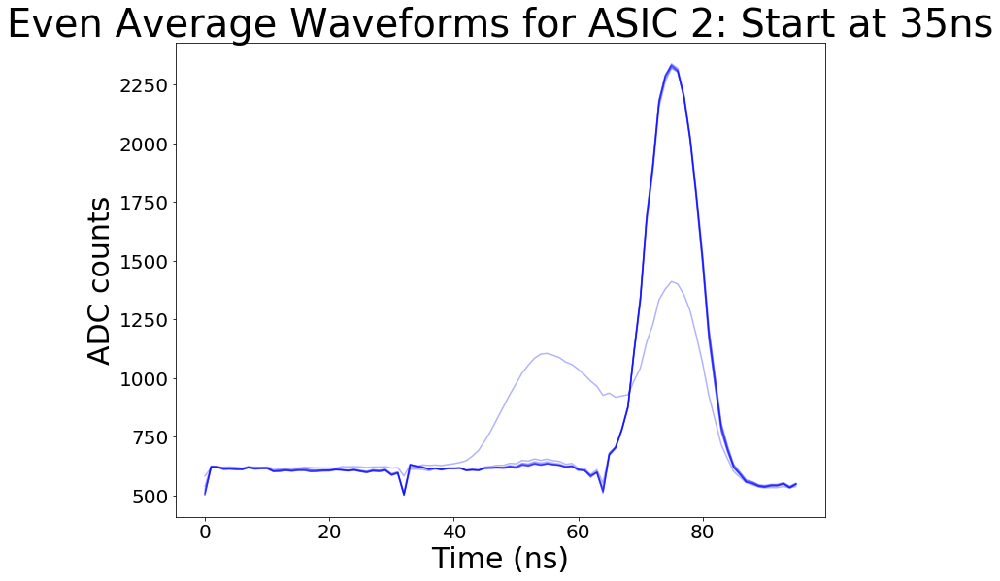

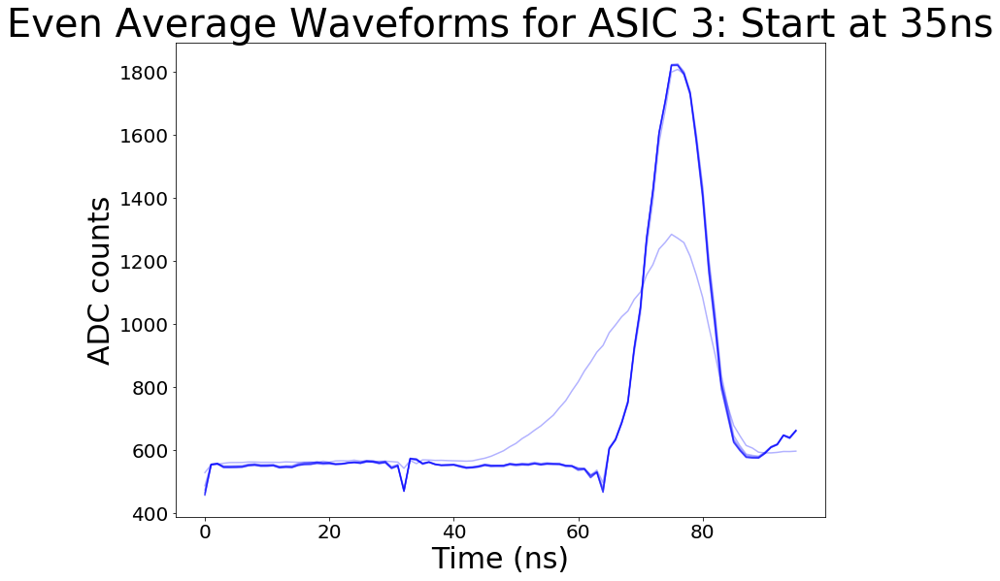

In [103]:
# Duration Scan begining at 35ns
# Using lowest point as phase shift correction

STRB1_35_even = []
for ASIC in range(4):
    runs = []
    length = 3
    for run in range(320840,320848):
        data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/ASIC Initialization Scans/New STRB1 Duration+Location/sampleFileAllBlocks_run" + str(run) + "ASIC" + str(ASIC) + "CH6.npz", 'r'))
        waveforms = []
        for event in range(len(data['event'])):
            block = int(data['block'][event])
            if block%2==0:
                first_block = np.ndarray.tolist(data['samples'][event][:32])
                for num in first_block:
                    if num<250:
                        first_block.remove(num)
                min_value = min(first_block)
                min_index = np.ndarray.tolist(data['samples'][event]).index(min_value)
                d = data['samples'][event][min_index: min_index+96]
                waveforms.append(d)
        avg_waveform = []
        for point in range(96):
            a = []
            for event in range(len(waveforms)):
                a.append(waveforms[event][point])
            avg_waveform.append(np.mean(a))
        runs.append(avg_waveform)
        plt.plot(avg_waveform, label = '35 to ' + str(35 + length), color = 'b', alpha = 0.3)
        length = length + 1
    STRB1_35_even.append(runs)
    plt.title('Even Average Waveforms for ASIC ' + str(ASIC) + ": Start at 35ns")
    plt.ylabel('ADC counts')
    plt.xlabel('Time (ns)')
    plt.show()

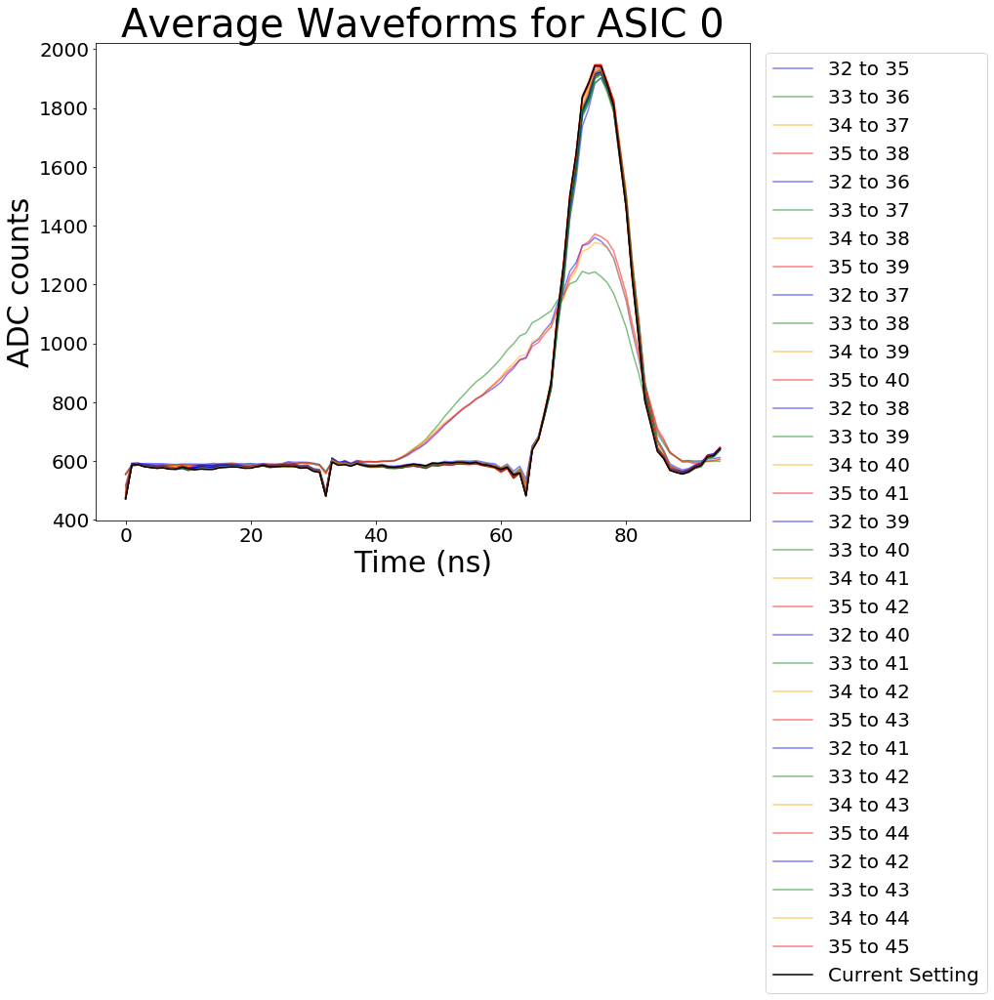

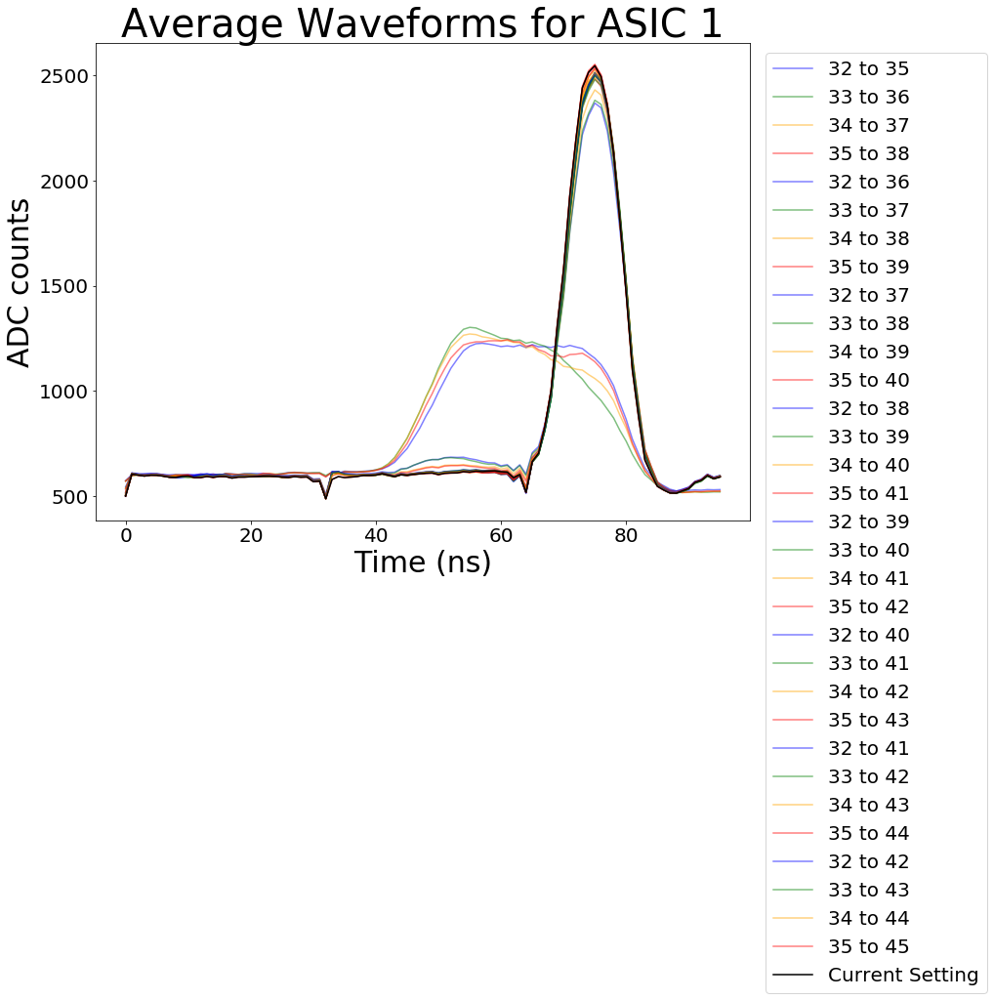

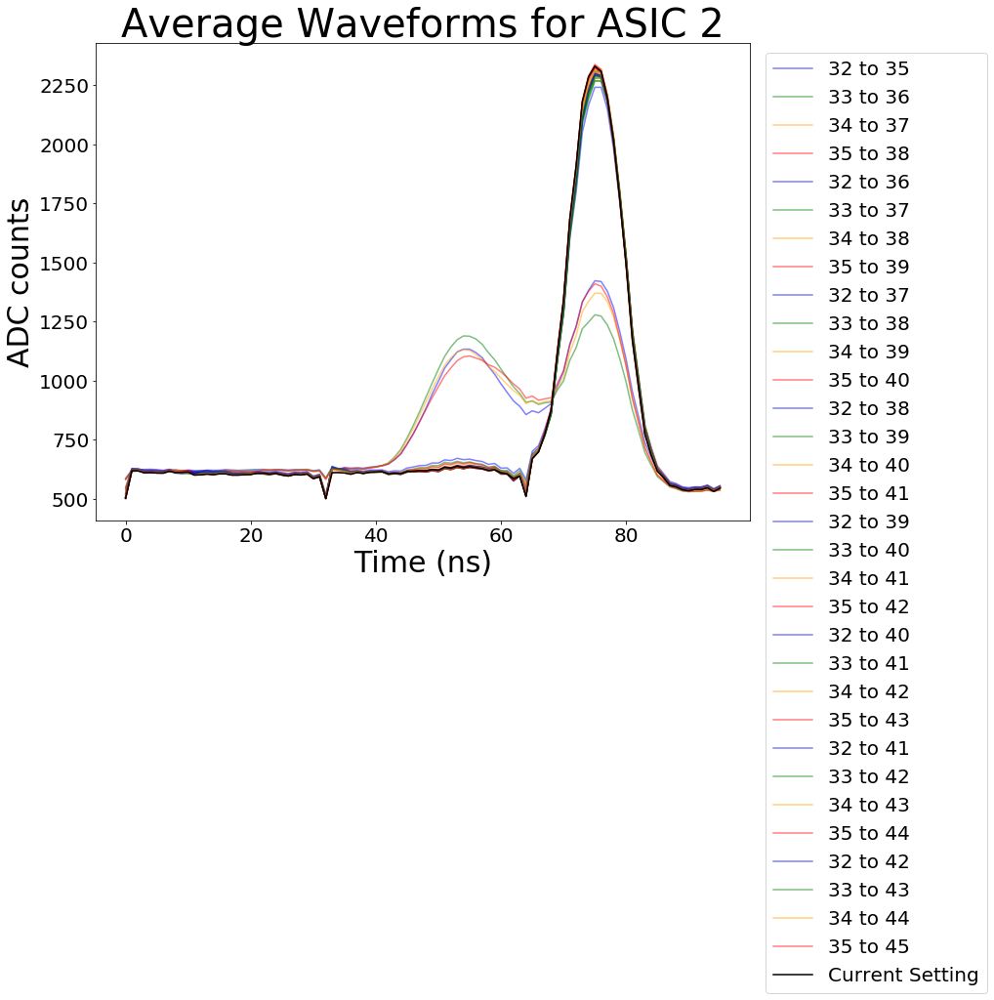

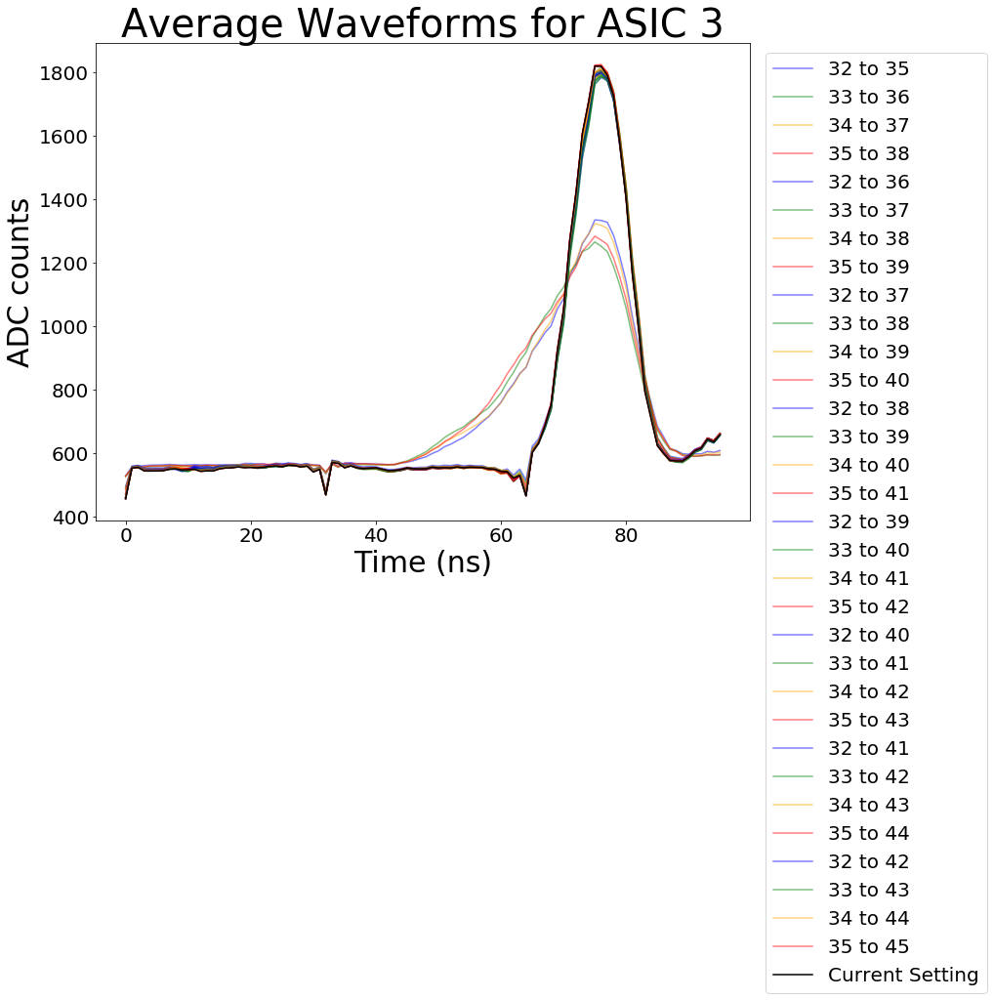

In [112]:
# Plot with a rainbow colormap

number_runs = 8

for ASIC in range(4):
    length = 3
    for run in range(number_runs):
        plt.plot(STRB1_32_even[ASIC][run], label = '32 to ' + str(32 + length), color = 'blue', alpha = 0.5)
        plt.plot(STRB1_33_even[ASIC][run], label = '33 to ' + str(33 + length), color = 'green', alpha = 0.5)
        plt.plot(STRB1_34_even[ASIC][run], label = '34 to ' + str(34 + length), color = 'orange', alpha = 0.5)
        plt.plot(STRB1_35_even[ASIC][run], label = '35 to ' + str(35 + length), color = 'red', alpha = 0.5)
        length = length + 1
    plt.plot(STRB1_35_even[ASIC][7], label = 'Current Setting', color = 'black')
    plt.title('Average Waveforms for ASIC ' + str(ASIC))
    plt.ylabel('ADC counts')
    plt.xlabel('Time (ns)')
    plt.legend(bbox_to_anchor = (1.01,1),loc = 'upper left')
    plt.show()

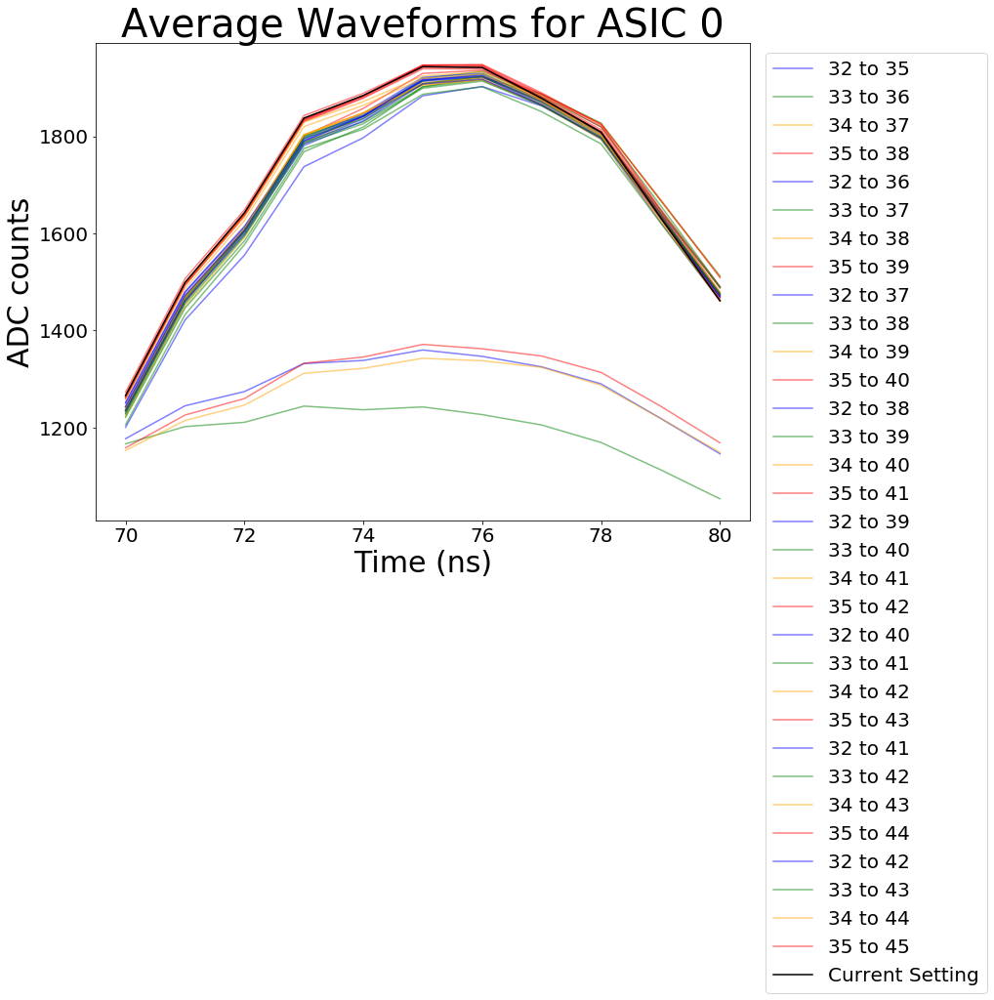

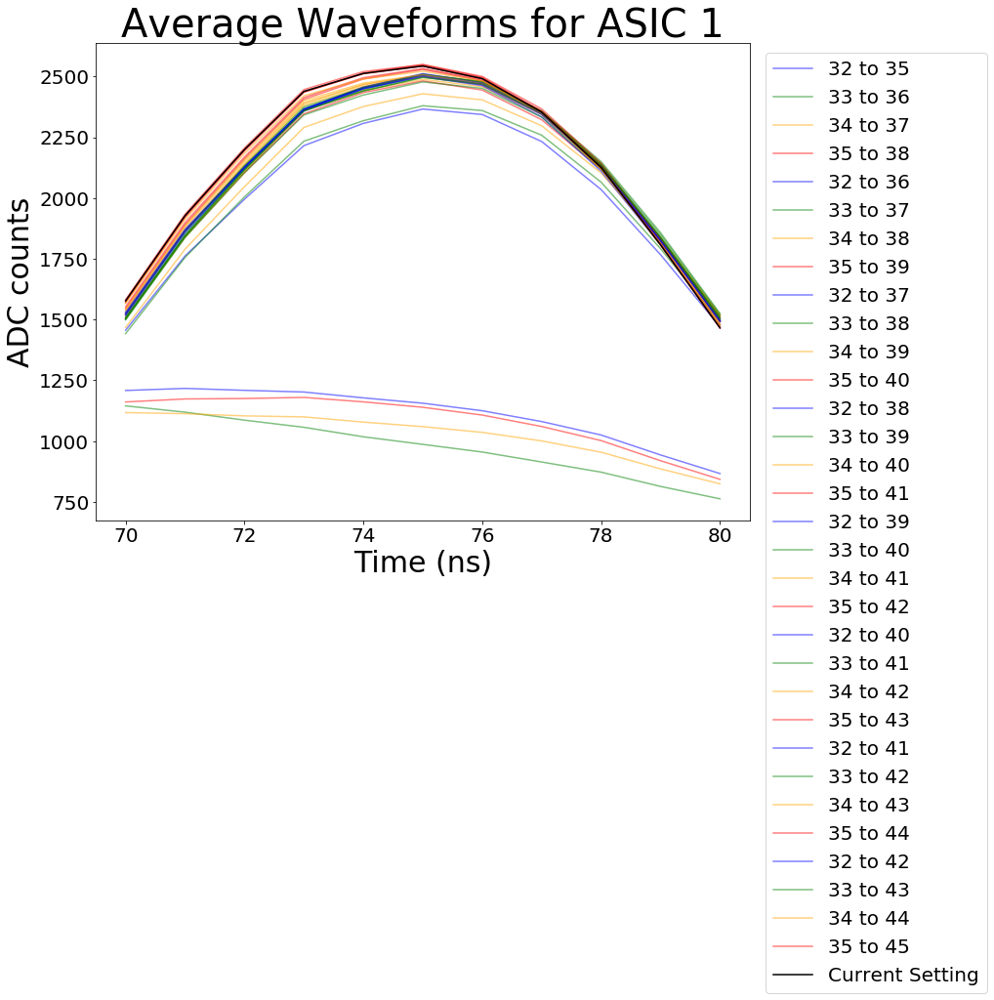

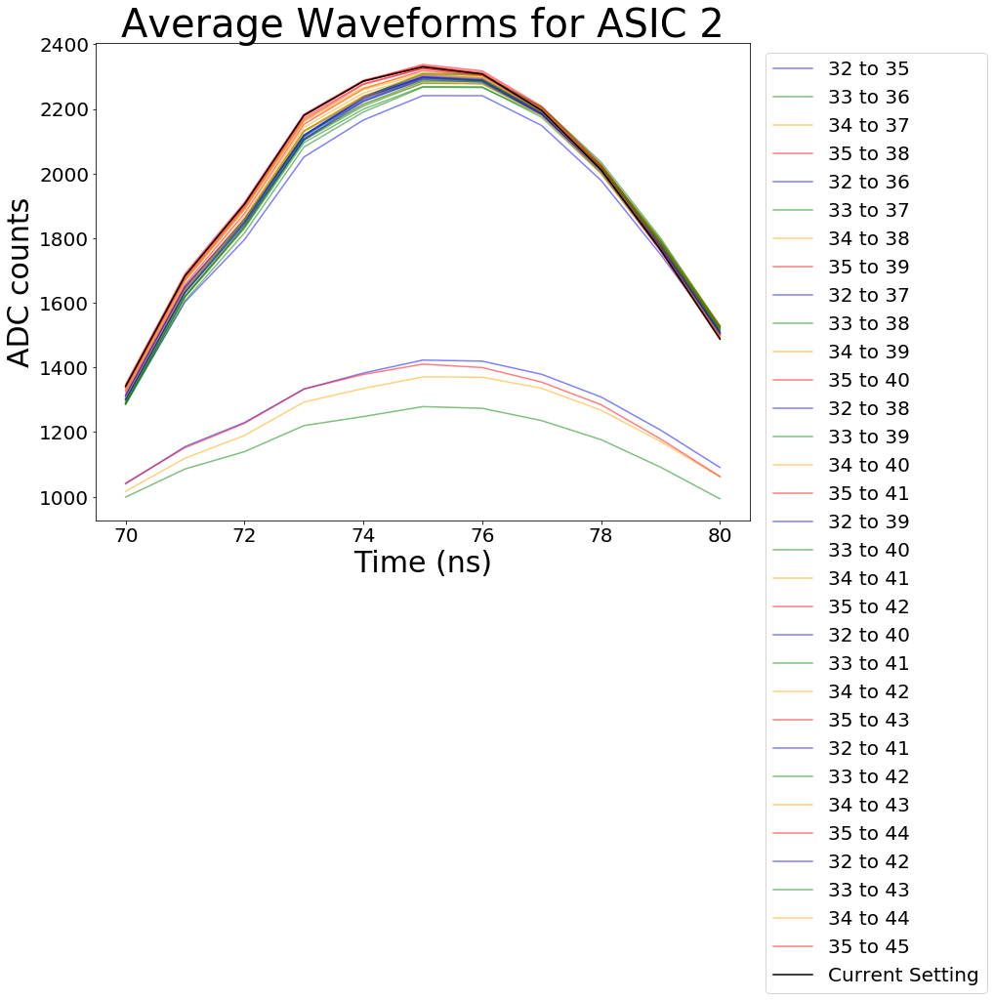

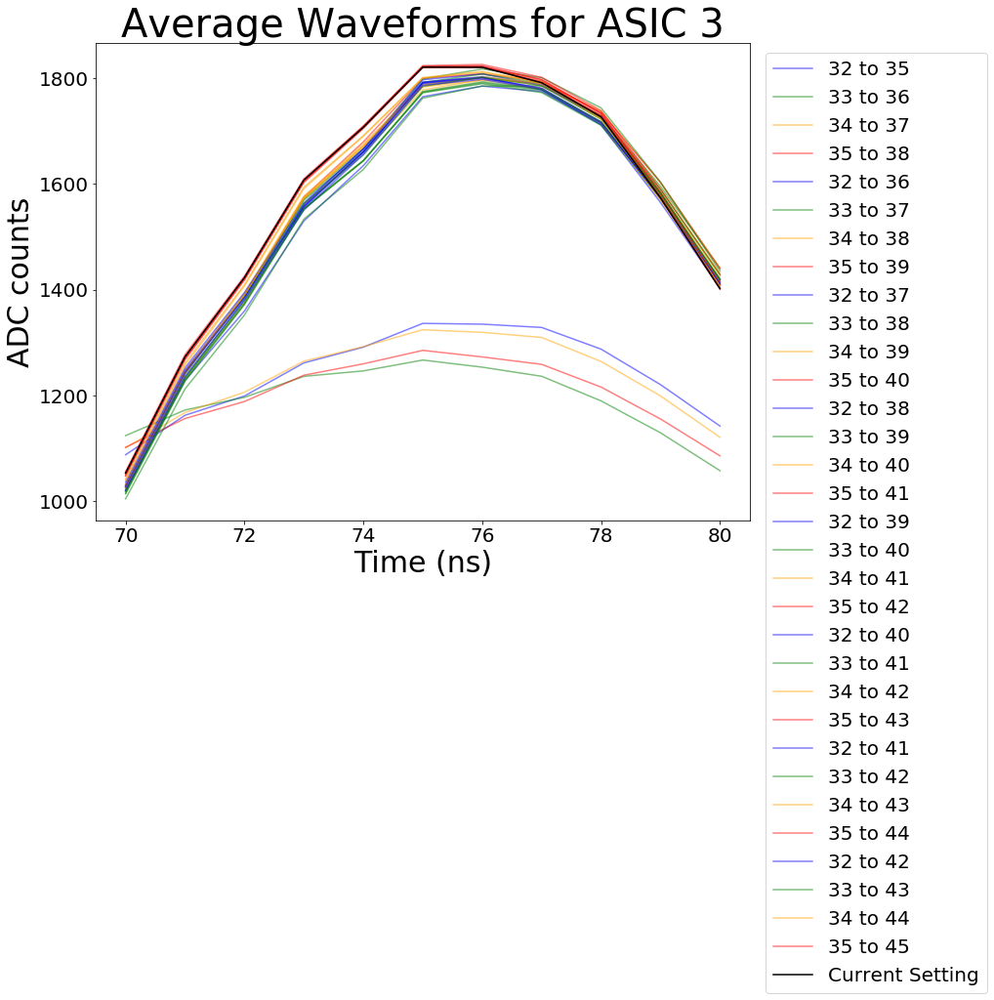

In [115]:
# Zoom in on top of pulse

number_runs = 8
x = [i for i in range(70,81)]

for ASIC in range(4):
    length = 3
    for run in range(number_runs):
        plt.plot(x, STRB1_32_even[ASIC][run][70:81], label = '32 to ' + str(32 + length), color = 'blue', alpha = 0.5)
        plt.plot(x, STRB1_33_even[ASIC][run][70:81], label = '33 to ' + str(33 + length), color = 'green', alpha = 0.5)
        plt.plot(x, STRB1_34_even[ASIC][run][70:81], label = '34 to ' + str(34 + length), color = 'orange', alpha = 0.5)
        plt.plot(x, STRB1_35_even[ASIC][run][70:81], label = '35 to ' + str(35 + length), color = 'red', alpha = 0.5)
        length = length + 1
    plt.plot(x, STRB1_35_even[ASIC][7][70:81], label = 'Current Setting', color = 'black')
    plt.title('Average Waveforms for ASIC ' + str(ASIC))
    plt.ylabel('ADC counts')
    plt.xlabel('Time (ns)')
    plt.legend(bbox_to_anchor = (1.01,1),loc = 'upper left')
    plt.show()

In [42]:
## Odd waveforms only ##

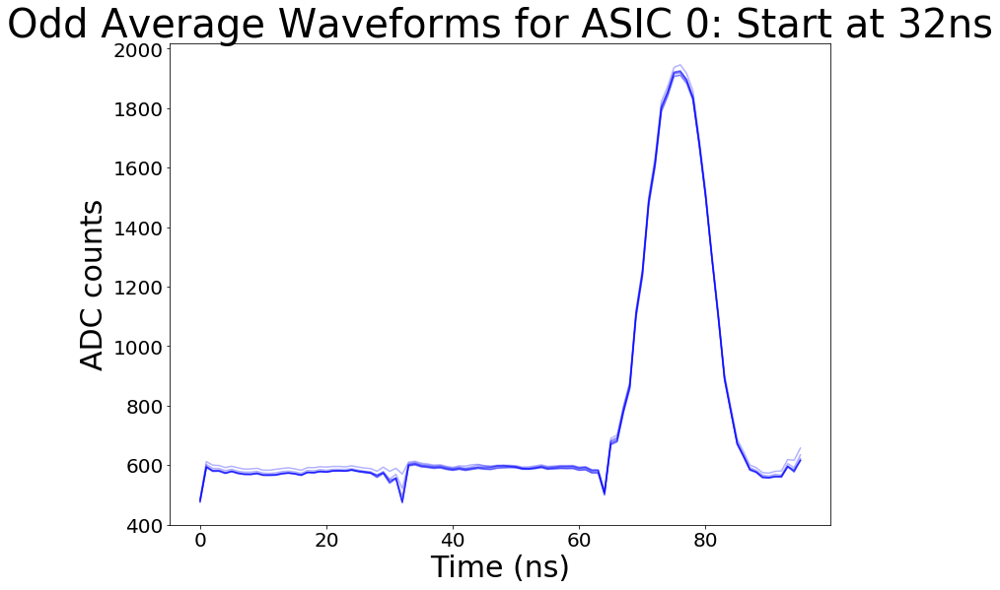

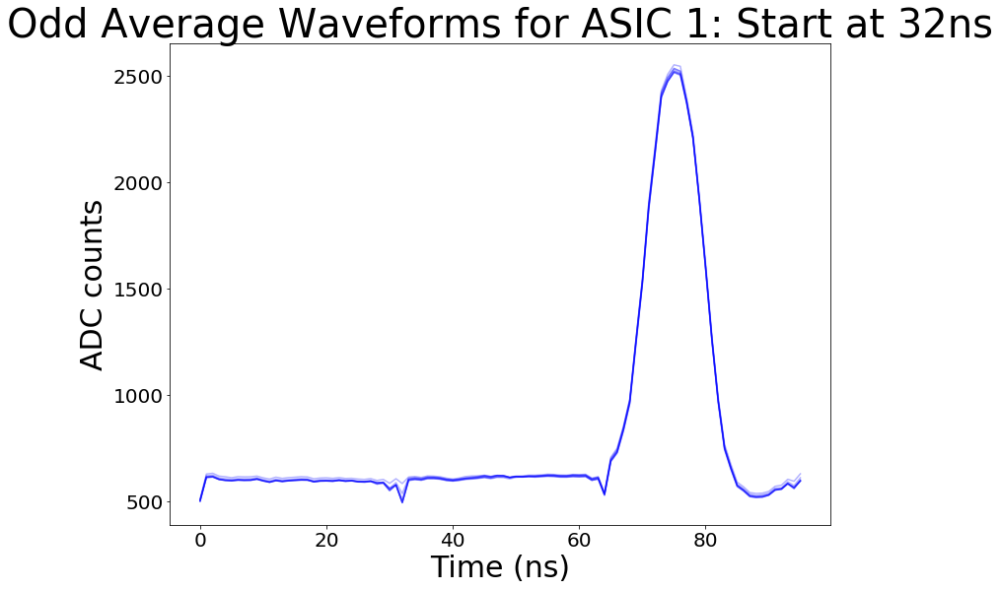

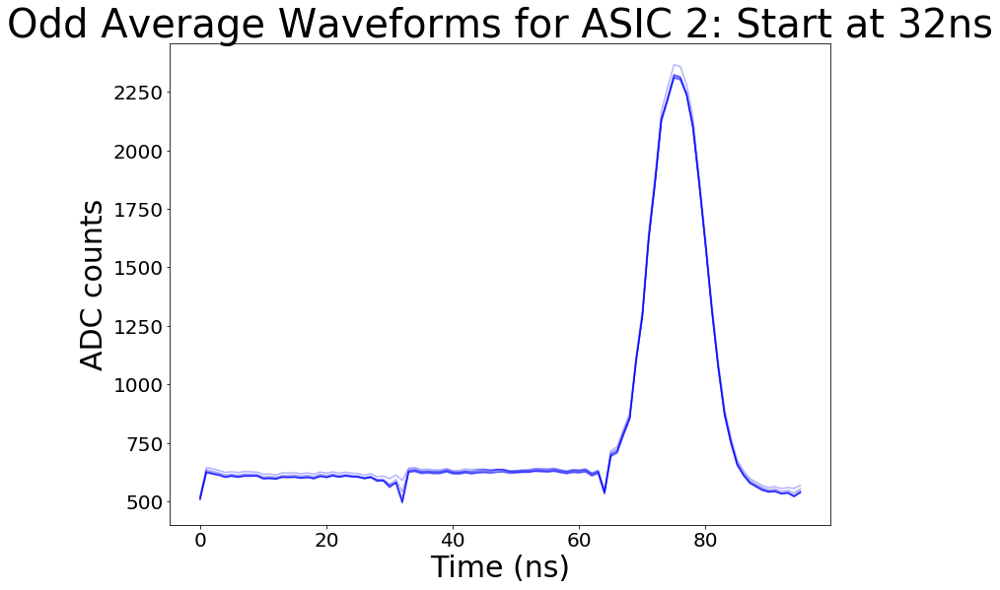

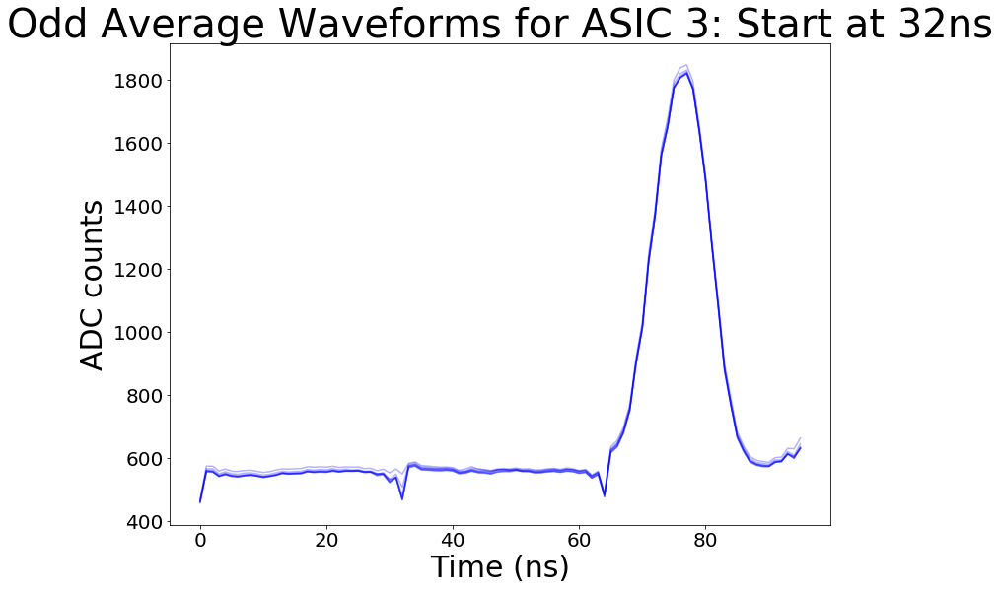

In [110]:
# Duration Scan begining at 32ns
# Using lowest point as phase shift correction

STRB1_32_odd = []
for ASIC in range(4):
    runs = []
    length = 3
    for run in range(320816,320824):
        data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/ASIC Initialization Scans/New STRB1 Duration+Location/sampleFileAllBlocks_run" + str(run) + "ASIC" + str(ASIC) + "CH6.npz", 'r'))
        waveforms = []
        for event in range(len(data['event'])):
            block = int(data['block'][event])
            if block%2!=0:
                first_block = np.ndarray.tolist(data['samples'][event][:32])
                for num in first_block:
                    if num<250:
                        first_block.remove(num)
                min_value = min(first_block)
                min_index = np.ndarray.tolist(data['samples'][event]).index(min_value)
                d = data['samples'][event][min_index: min_index+96]
                waveforms.append(d)
        avg_waveform = []
        for point in range(96):
            a = []
            for event in range(len(waveforms)):
                a.append(waveforms[event][point])
            avg_waveform.append(np.mean(a))
        runs.append(avg_waveform)
        plt.plot(avg_waveform, label = '32 to ' + str(32 + length), color = 'b', alpha = 0.3)
        length = length + 1
    STRB1_32_odd.append(runs)
    plt.title('Odd Average Waveforms for ASIC ' + str(ASIC) + ": Start at 32ns")
    plt.ylabel('ADC counts')
    plt.xlabel('Time (ns)')
    plt.show()

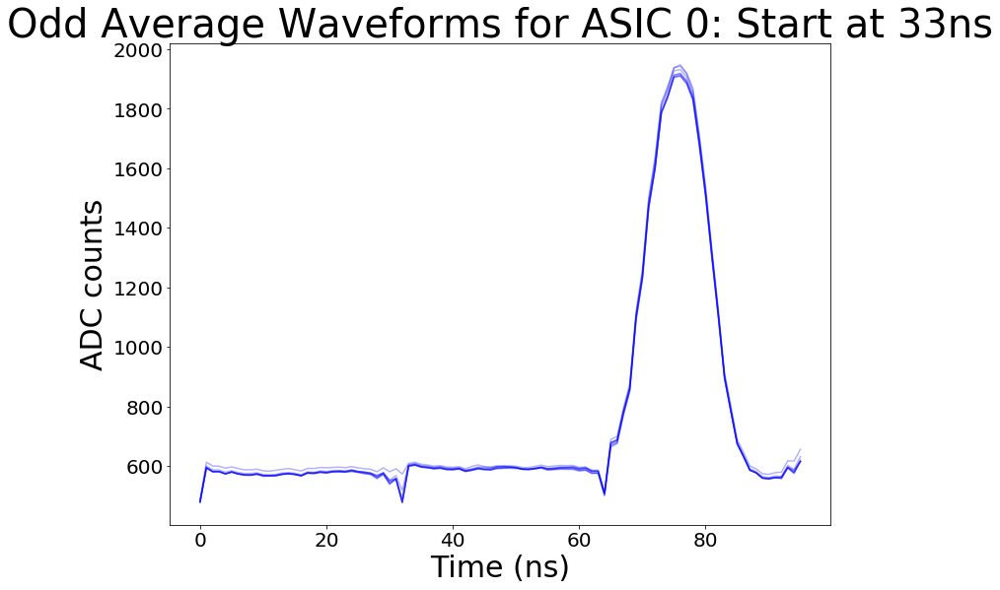

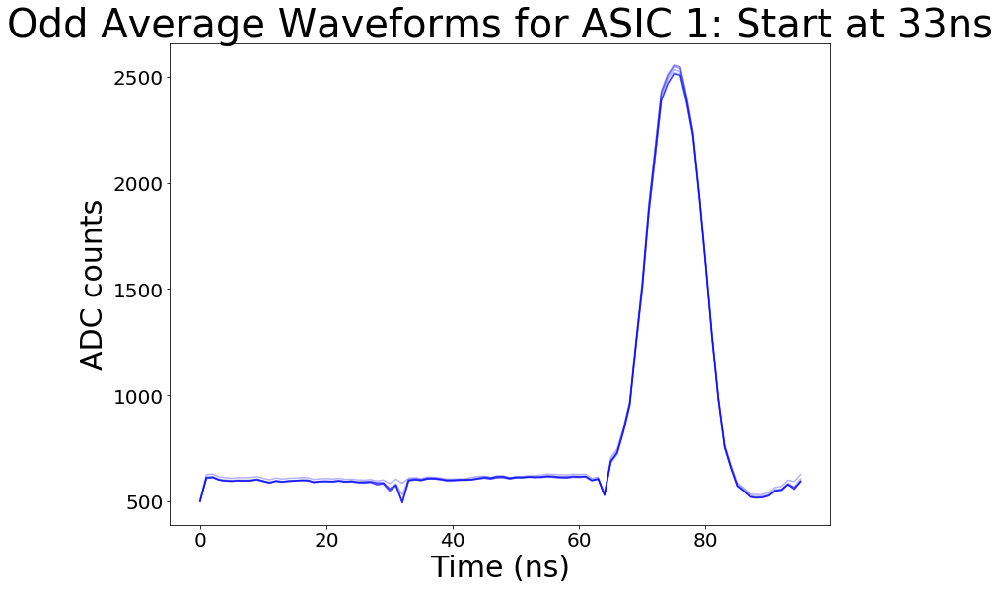

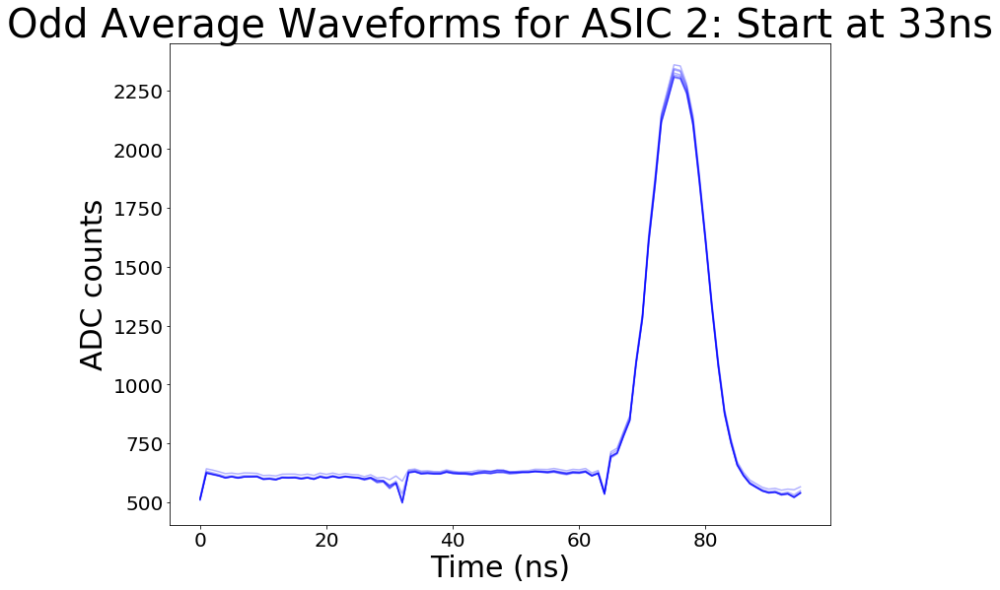

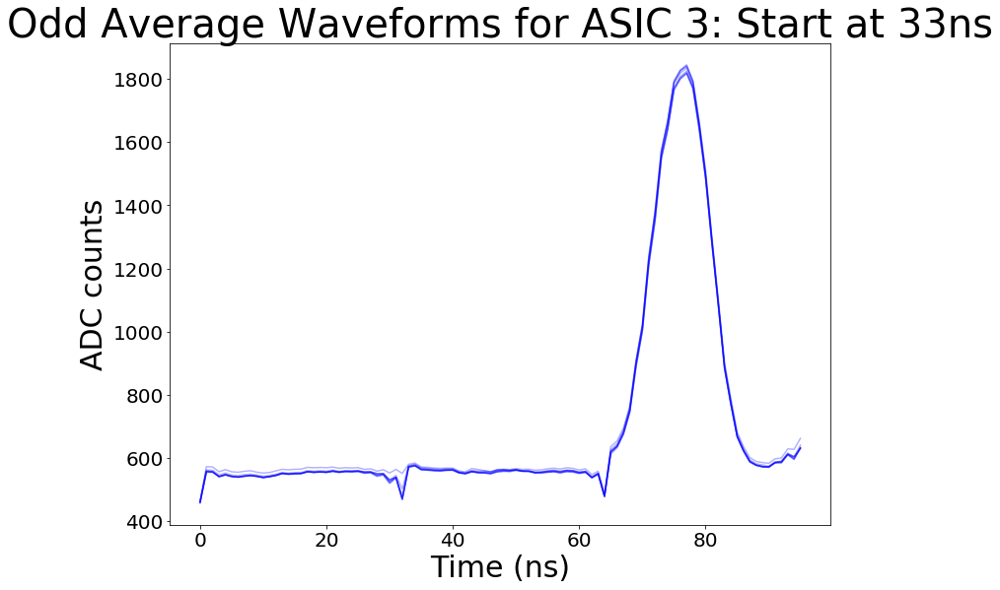

In [109]:
# Duration Scan begining at 33ns
# Using lowest point as phase shift correction

STRB1_33_odd = []
for ASIC in range(4):
    runs = []
    length = 3
    for run in range(320824,320832):
        data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/ASIC Initialization Scans/New STRB1 Duration+Location/sampleFileAllBlocks_run" + str(run) + "ASIC" + str(ASIC) + "CH6.npz", 'r'))
        waveforms = []
        for event in range(len(data['event'])):
            block = int(data['block'][event])
            if block%2!=0:
                first_block = np.ndarray.tolist(data['samples'][event][:32])
                for num in first_block:
                    if num<250:
                        first_block.remove(num)
                min_value = min(first_block)
                min_index = np.ndarray.tolist(data['samples'][event]).index(min_value)
                d = data['samples'][event][min_index: min_index+96]
                waveforms.append(d)
        avg_waveform = []
        for point in range(96):
            a = []
            for event in range(len(waveforms)):
                a.append(waveforms[event][point])
            avg_waveform.append(np.mean(a))
        runs.append(avg_waveform)
        plt.plot(avg_waveform, label = '33 to ' + str(33 + length), color = 'b', alpha = 0.3)
        length = length + 1
    STRB1_33_odd.append(runs)
    plt.title('Odd Average Waveforms for ASIC ' + str(ASIC) + ": Start at 33ns")
    plt.ylabel('ADC counts')
    plt.xlabel('Time (ns)')
    plt.show()

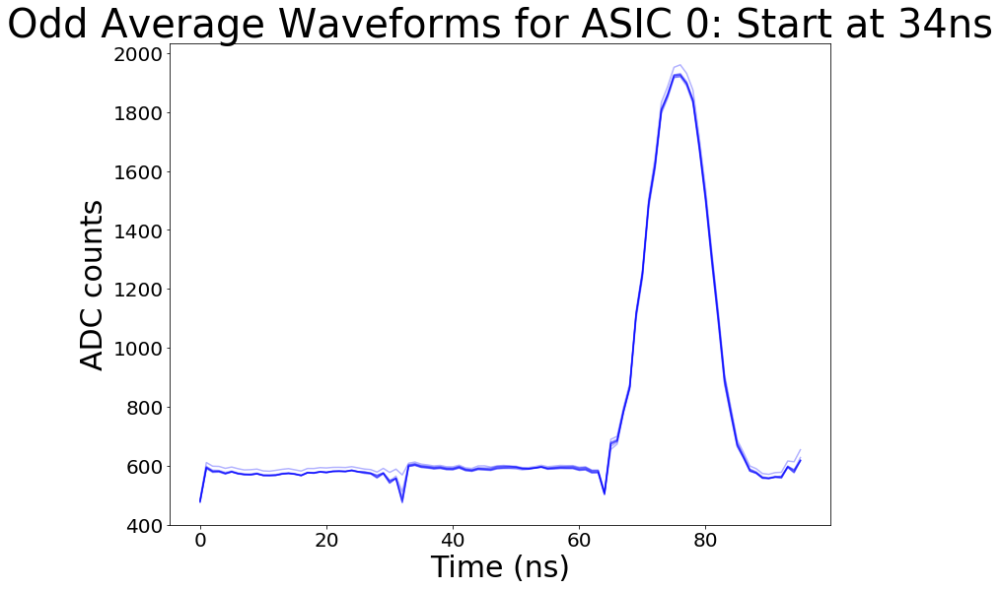

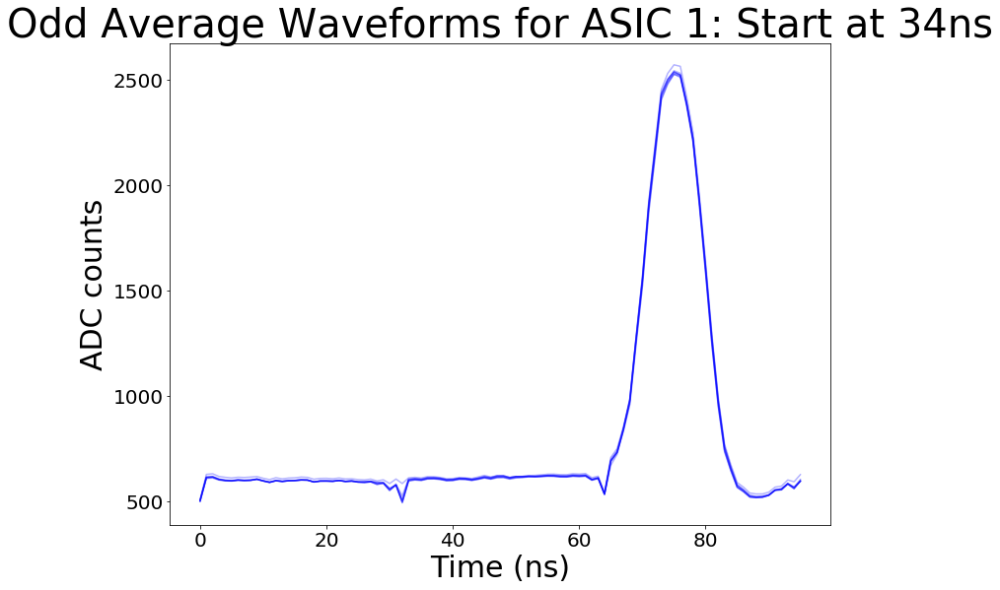

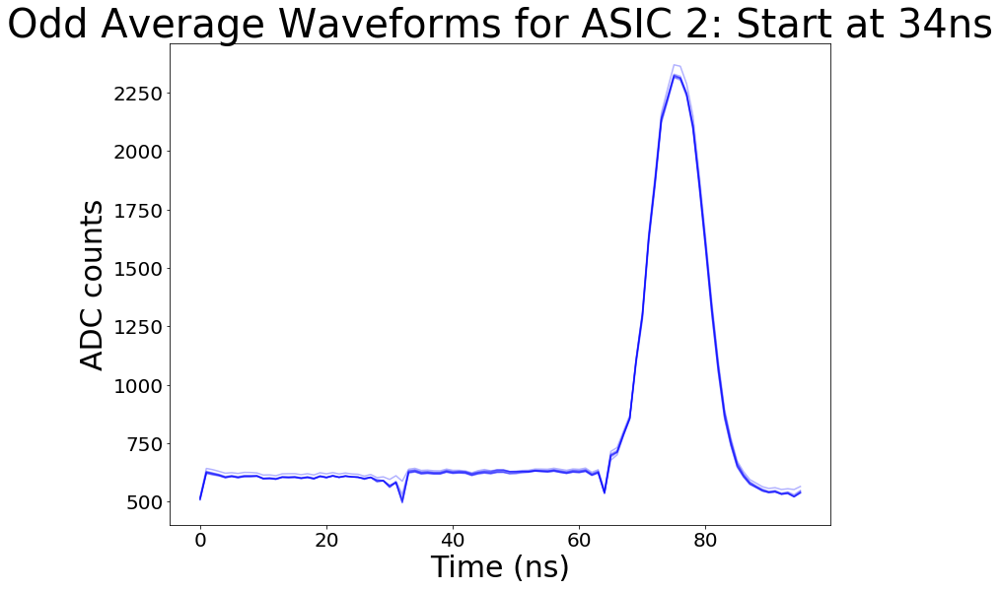

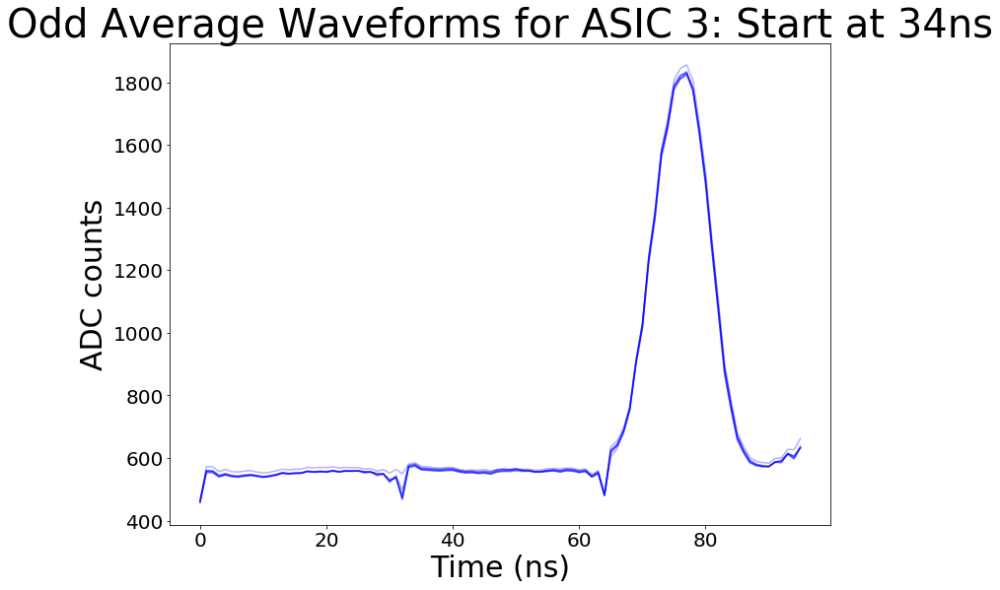

In [108]:
# Duration Scan begining at 34ns
# Using lowest point as phase shift correction

STRB1_34_odd = []
for ASIC in range(4):
    runs = []
    length = 3
    for run in range(320832,320840):
        data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/ASIC Initialization Scans/New STRB1 Duration+Location/sampleFileAllBlocks_run" + str(run) + "ASIC" + str(ASIC) + "CH6.npz", 'r'))
        waveforms = []
        for event in range(len(data['event'])):
            block = int(data['block'][event])
            if block%2!=0:
                first_block = np.ndarray.tolist(data['samples'][event][:32])
                for num in first_block:
                    if num<250:
                        first_block.remove(num)
                min_value = min(first_block)
                min_index = np.ndarray.tolist(data['samples'][event]).index(min_value)
                d = data['samples'][event][min_index: min_index+96]
                waveforms.append(d)
        avg_waveform = []
        for point in range(96):
            a = []
            for event in range(len(waveforms)):
                a.append(waveforms[event][point])
            avg_waveform.append(np.mean(a))
        runs.append(avg_waveform)
        plt.plot(avg_waveform, label = '34 to ' + str(34 + length), color = 'b', alpha = 0.3)
        length = length + 1
    STRB1_34_odd.append(runs)
    plt.title('Odd Average Waveforms for ASIC ' + str(ASIC) + ": Start at 34ns")
    plt.ylabel('ADC counts')
    plt.xlabel('Time (ns)')
    plt.show()

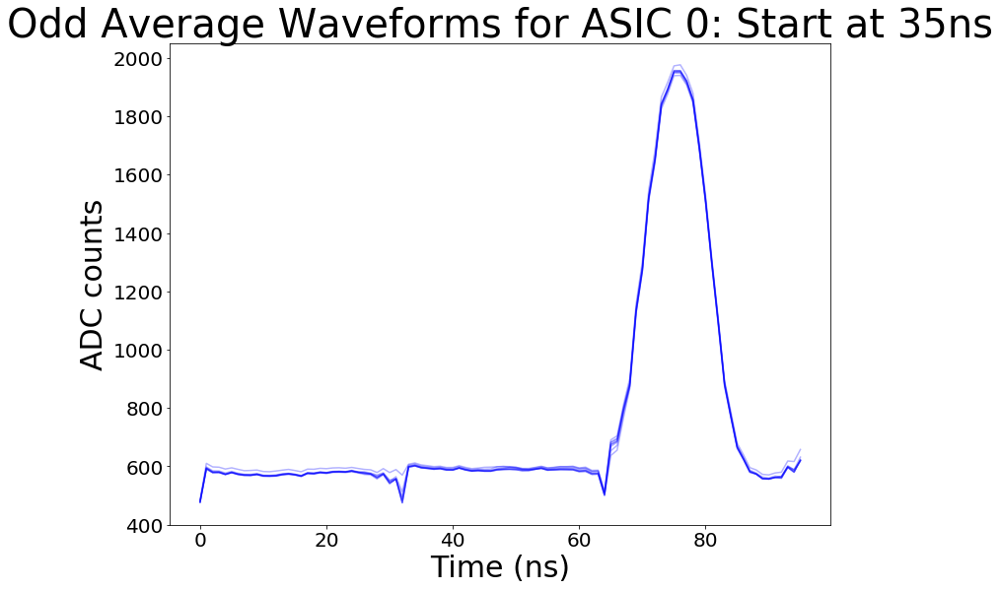

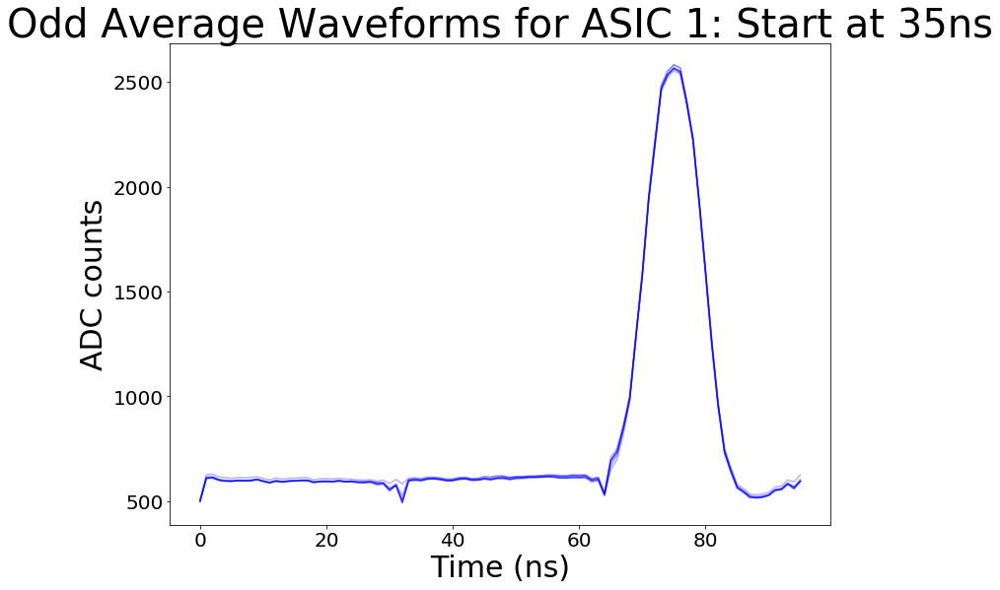

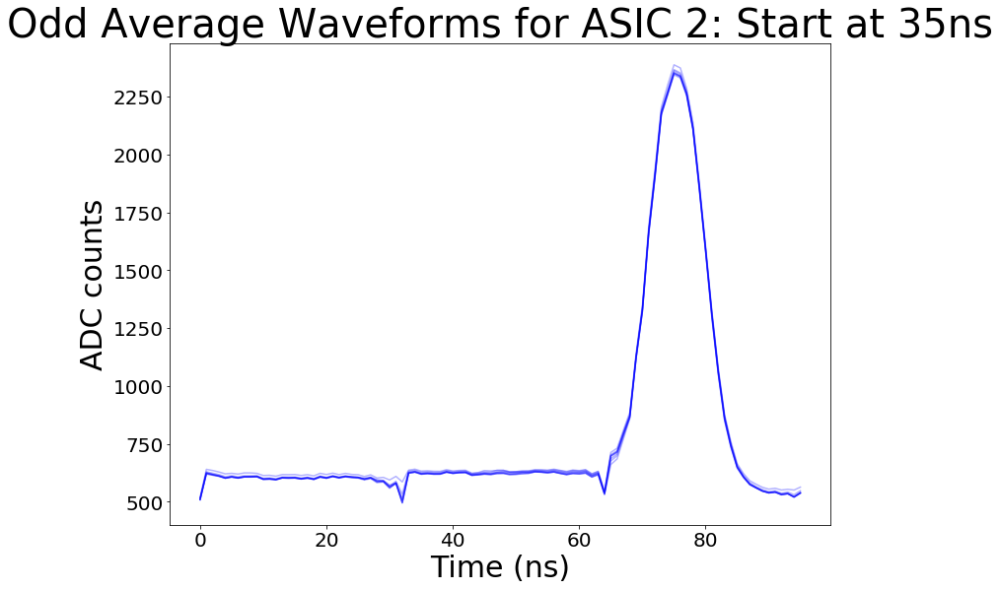

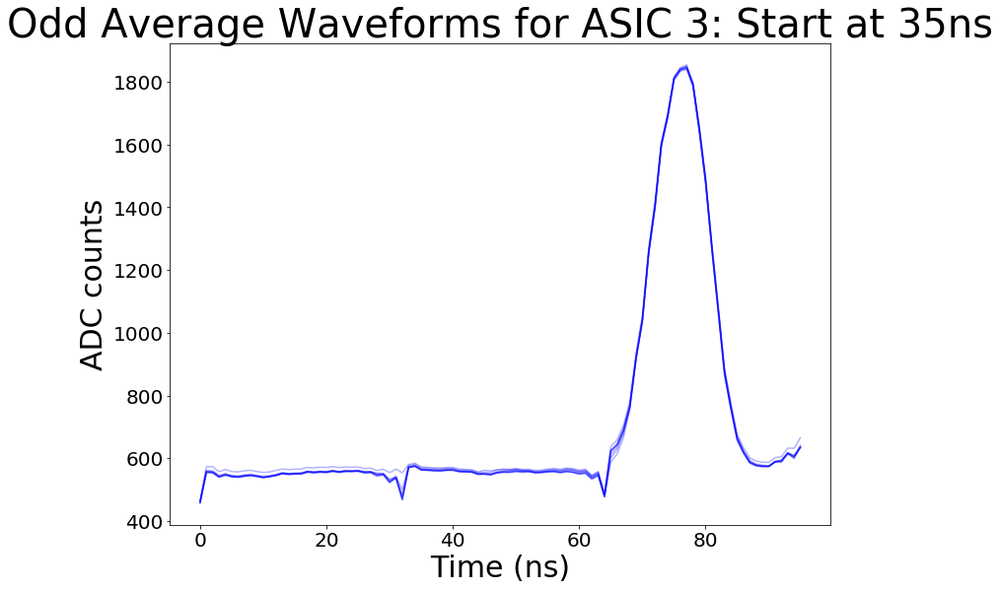

In [107]:
# Duration Scan begining at 35ns
# Using lowest point as phase shift correction

STRB1_35_odd = []
for ASIC in range(4):
    runs = []
    length = 3
    for run in range(320840,320848):
        data = dict(np.load("/users/wipacuser/Desktop/CTA/Runs/ASIC Initialization Scans/New STRB1 Duration+Location/sampleFileAllBlocks_run" + str(run) + "ASIC" + str(ASIC) + "CH6.npz", 'r'))
        waveforms = []
        for event in range(len(data['event'])):
            block = int(data['block'][event])
            if block%2!=0:
                first_block = np.ndarray.tolist(data['samples'][event][:32])
                for num in first_block:
                    if num<250:
                        first_block.remove(num)
                min_value = min(first_block)
                min_index = np.ndarray.tolist(data['samples'][event]).index(min_value)
                d = data['samples'][event][min_index: min_index+96]
                waveforms.append(d)
        avg_waveform = []
        for point in range(96):
            a = []
            for event in range(len(waveforms)):
                a.append(waveforms[event][point])
            avg_waveform.append(np.mean(a))
        runs.append(avg_waveform)
        plt.plot(avg_waveform, label = '35 to ' + str(35 + length), color = 'b', alpha = 0.3)
        length = length + 1
    STRB1_35_odd.append(runs)
    plt.title('Odd Average Waveforms for ASIC ' + str(ASIC) + ": Start at 35ns")
    plt.ylabel('ADC counts')
    plt.xlabel('Time (ns)')
    plt.show()

In [ ]:
# Take this scan again with the block boundry at a better location